In [41]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from langchain_community.document_loaders.csv_loader import CSVLoader
from langchain.text_splitter import RecursiveCharacterTextSplitter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os
import json

### Metriken

In [42]:
def recall(actual, predicted):
    act_set = set(actual)
    pred_set = set(predicted)
    result = round(len(act_set & pred_set) / float(len(act_set)), 2)
    return result

In [43]:
def recallHybrid(actual, predicted):
    act_set = set(actual)
    pred_set = set(predicted)
    print(pred_set)
    result = round(len(act_set & pred_set) / float(len(act_set)), 2)
    return result

In [44]:
def precision(actual, predicted):
    act_set = set(actual)
    pred_set = set(predicted)
    result = round(len(act_set & pred_set) / float(len(pred_set)), 2) if pred_set else 0.0
    return result

In [45]:
def map(actual, predicted,k):
    
    Q = len(actual)
    ap = []

    # loop through and calculate AP for each query q
    for q in range(Q):
        ap_num = 0
        # loop through k values
        for x in range(k):
            # calculate precision@k
            act_set = set(actual[q])                                                                                                                                   
            pred_set = set(predicted[:x+1])
            precision_at_k = len(act_set & pred_set) / (x+1)
            # calculate rel_k values
            if predicted[x] in actual[q]:
                rel_k = 1
            else:
                rel_k = 0
            # calculate numerator value for ap
            ap_num += precision_at_k * rel_k
        # now we calculate the AP value as the average of AP
        # numerator values
        ap_q = ap_num / len(actual[q])
        print(f"AP@{k}_{q+1} = {round(ap_q,2)}")
        ap.append(ap_q)

    # now we take the mean of all ap values to get mAP
    map_at_k = sum(ap) / Q
    return map_at_k
    # generate results
    print(f"mAP@{k} = {round(map_at_k, 2)}")

### Parameter

### Inizialisierung

In [46]:
from langchain_community.document_loaders import PyPDFLoader
from langchain_community.retrievers import BM25Retriever
from langchain_community.embeddings import HuggingFaceEmbeddings
from langchain.vectorstores import FAISS
from sklearn.metrics.pairwise import cosine_similarity
from langchain.retrievers.ensemble import EnsembleRetriever

k = 10


bmRetrieverList = []
denseRetrieverList = []
hybridRetrieverList = []

retriever_fragen = {}
for i in range(1,51):
    retriever_fragen.update({i:0})

with open("eval_fragen.json", encoding="utf8") as f:
    d = json.load(f, strict = False)
    
    for idx, frage in enumerate(d["question"]):
        retriever_fragen.update({idx + 1: frage})

def initBMRetriever(i):
    chunksize = 128
    loader = PyPDFLoader(f"C:/Users/lschaper/Desktop/SprachKI/data/{i}.pdf")
    if(i == 8):
        chunksize = 256
    text_splitter = RecursiveCharacterTextSplitter(chunk_size=chunksize , chunk_overlap=int(0))
    data = loader.load()
    pages = text_splitter.split_documents(data)

    bmRetriever = BM25Retriever.from_documents(pages)
    #bmRetriever.k = k
    bmRetrieverList.append(bmRetriever)

def initDenseRetriever(i):
    chunksize = 128
    loader = PyPDFLoader(f"C:/Users/lschaper/Desktop/SprachKI/data/{i}.pdf")
    if(i == 8):
        chunksize = 256
    text_splitter = RecursiveCharacterTextSplitter(chunk_size=chunksize , chunk_overlap=int(0))
    data = loader.load()
    pages = text_splitter.split_documents(data)

    model_name = 'sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2'
    model_kwargs = {'device': 'cuda'}
    encode_kwargs = {'normalize_embeddings': False}

    hf = HuggingFaceEmbeddings(
        model_name=model_name,
        model_kwargs=model_kwargs,
        encode_kwargs=encode_kwargs
    )

    vectore_store = FAISS.from_documents(pages, embedding=hf)

    denseRetrieverList.append(vectore_store)
    
def initHybridRetriever():
    for sparse,dense in zip(bmRetrieverList,denseRetrieverList):
        ensemble_retriever = EnsembleRetriever(retrievers=[dense.as_retriever(),
                                                   sparse],
                                       weights=[0.5, 0.5])
        hybridRetrieverList.append(ensemble_retriever)



In [ ]:
for i in range(1,11):
    initBMRetriever(i)
    initDenseRetriever(i)

c:\Users\lschaper\AppData\Local\Programs\Python\Python312\Lib\site-packages\transformers\tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


### Durchlauf

In [8]:
def initCorpus(idx_Document):

    loader = PyPDFLoader(f"C:/Users/lschaper/Desktop/SprachKI/data/{idx_Document}.pdf")
    chunksize = 128
    if(idx_Document == 8):
        chunksize = 256
    
    text_splitter = RecursiveCharacterTextSplitter(chunk_size=chunksize , chunk_overlap=int(0))
    data = loader.load()

    pages = text_splitter.split_documents(data)

    ### Erstellen des Corpus
    corpus = {}
    for i,page in zip(range(1,len(pages) + 1),pages):
        corpus.update({page.page_content:0})

    with open(f"data_{idx_Document}.json", encoding="utf8") as f:
        d = json.load(f, strict = False)
        
        for chunk, text in zip(d["chunks"],corpus):
            corpus.update({text: chunk["fragen"]})
       
    return corpus

In [9]:
def actualDocument(idx_Frage, data_dict):
    actual_dict = {}
    actual_index_list = []
    for i, key in enumerate(data_dict):
        if(data_dict[key] != 0):
            for idx_fragen in data_dict[key]:
                if(idx_fragen == idx_Frage):
                    #print(i+1)
                    actual_dict.update({key:  i + 1})
                    actual_index_list.append(i + 1)
    
    return actual_dict, actual_index_list

#dict, idx_list = actualDocument(idx_Frage,corpus)


In [10]:
from langchain.retrievers.ensemble import EnsembleRetriever
def predictedDocuments(idx_Frage, corpus, retriever_type, bmRetriever,denseRetriever,k_value):
    prediction_dict = {}
    prediction_idx_list = []
    prediction = ""

    if(retriever_type == "sparse"):
        bmRetriever.k = k_value
        prediction = bmRetriever.invoke(retriever_fragen[idx_Frage])
        

    elif(retriever_type == "dense"):
        prediction = denseRetriever.similarity_search(retriever_fragen[idx_Frage],k_value)

    elif(retriever_type == "hybrid"):
        bmRetriever.k = k_value
        ensemble_retriever = EnsembleRetriever(retrievers=[denseRetriever.as_retriever( search_kwargs={"k": k_value}),
                                                   bmRetriever],
                                       weights=[0.5, 0.5])
        
        prediction = ensemble_retriever.invoke(retriever_fragen[idx_Frage])
    
    else:
        print("Missing retriever_type")

    for i,key in enumerate(corpus):
        for doc in prediction:
            if(key == doc.page_content):
                prediction_dict.update({doc.page_content: i+1})
                prediction_idx_list.append(i+1)
    return prediction_dict, prediction_idx_list

#dict, idx_list = predictedDocuments(corpus,bmRetriever,k=k)


In [11]:
def recallForK(idx_Frage, corpus, retriever_type, bmRetriever, denseRetriever):
    recall_set = {}
    _ , actual_list = actualDocument(idx_Frage=idx_Frage, data_dict=corpus)
    #print(f"Actual: {actual_list}")
    for i in range(1,k+1):
        _ , prediction_list = predictedDocuments(idx_Frage, corpus,retriever_type,bmRetriever,denseRetriever,i)
        #print(prediction_list)
        if actual_list:
            recall_at_k = recall(actual_list,prediction_list)
        
            #print(f"Prediction bei {i}: {prediction_list}")
            recall_set.update({i : recall_at_k})
        else:
            #print(f"actual_List leer bei {i}")
            recall_set.update({i : 0.0})
            
    return recall_set

#diagramm_data = recallForK(idx_Frage,corpus,bmRetriever,k)

In [12]:
def precisionForK(idx_Frage, corpus, retriever_type, bmRetriever, denseRetriever):
    precision_set = {}
    _ , actual_list = actualDocument(idx_Frage=idx_Frage, data_dict=corpus)
    #print(f"Actual: {actual_list}")
    for i in range(1,k+1):
        _ , prediction_list = predictedDocuments(idx_Frage, corpus,retriever_type,bmRetriever,denseRetriever,i)
        if actual_list:
            precision_at_k = precision(actual_list,prediction_list)
        
            #print(f"Prediction bei {i}: {prediction_list}")
            precision_set.update({i : precision_at_k})
        else:
            #print(f"actual_List leer bei {i}")
            precision_set.update({i : 0.0})
            
    return precision_set

#diagramm_data = recallForK(idx_Frage,corpus,bmRetriever,k)

In [13]:
def f1ForK(idx_Frage, corpus, retriever_type, bmRetriever, denseRetriever):
    f1_set = {}
    _ , actual_list = actualDocument(idx_Frage=idx_Frage, data_dict=corpus)
    #print(f"Actual: {actual_list}")
    for i in range(1,k+1):
        _ , prediction_list = predictedDocuments(idx_Frage, corpus,retriever_type,bmRetriever,denseRetriever,i)
        if actual_list:
            precision_at_k = precision(actual_list,prediction_list)
            recall_at_k = recall(actual_list,prediction_list)
            if(precision_at_k != 0.0 or recall_at_k != 0.0):
                f1_at_k = (2 * precision_at_k * recall_at_k)/(precision_at_k + recall_at_k)
            #print(f"Prediction bei {i}: {prediction_list}")
            else:
                f1_at_k = 0.0
            f1_set.update({i : f1_at_k})
        else:
            #print(f"actual_List leer bei {i}")
            f1_set.update({i : 0.0})
            
    return f1_set

#diagramm_data = recallForK(idx_Frage,corpus,bmRetriever,k)

In [14]:
def averagePrecisionForK(idx_Frage, corpus, retriever_type, bmRetriever, denseRetriever):
    ap_num = 0.0
    currentPrediction = 0
    max_precision_at_k = 0.0
    _ , actual_list = actualDocument(idx_Frage=idx_Frage, data_dict=corpus)
    #print(f"Actual: {actual_list}")
    for i in range(1,k+1):
        _ , prediction_list = predictedDocuments(idx_Frage, corpus,retriever_type,bmRetriever,denseRetriever,i)
        if actual_list:
            precision_at_k = precision(actual_list,prediction_list)


            if(i == 1):
                currentPrediction = prediction_list
            else:
                _ , lastPrediction = predictedDocuments(idx_Frage, corpus,retriever_type,bmRetriever,denseRetriever,i-1)
                currentPrediction = [cp for cp in prediction_list if cp not in lastPrediction]
                
            for value in currentPrediction:  

                if value in actual_list:
                    rel_k = 1
                else:
                    rel_k = 0
            
                ap_num += (precision_at_k * rel_k)

                relevant_results = len(set(actual_list) & set(prediction_list))
                

            if(len(actual_list)/i >= 1.0):
                max_at_k = 1.0
            else:
                max_at_k = 0.0 # 0 weil rel_k bei allen 0 wäre
            max_precision_at_k += max_at_k 

            relevant_result_at_k = i
            if(relevant_result_at_k > len(actual_list)):
                relevant_result_at_k = len(actual_list)
                #print(f"Max-Precision bei {i}: {max_at_k}")
            #print(f"Prediction bei {i}: {prediction_list}")
        else:
            #print(f"actual_List leer bei {i}")
            return 0.0, 0.0
    #print(f"AP@{i}: {ap_num}")
    ap_q = ap_num/(relevant_results) if relevant_results else 0.0
        
    return ap_q, max_precision_at_k/(relevant_result_at_k)

#diagramm_data = recallForK(idx_Frage,corpus,bmRetriever,k)

### Diagram erstellen

In [35]:
def createDiagramPrecisionOverlap(data_1,data_2,data_3, idx_Frage):


    # Daten
    x1 = list(range(1,len(data_1)+1)) 
    y1 = data_1  # Werte

    x2 = list(range(1,len(data_2)+1)) 
    y2 = data_2  # Werte

    x3 = list(range(1,len(data_3)+1)) 
    y3 = data_3

    # Erstelle ein Diagramm mit mehreren Linien
    plt.figure(figsize=(8, 6))  # Größe des Diagramms

    # Linie 1
    plt.plot(x1, y1, marker='o', label='BM25-Retriever', color='blue', linestyle='-')
    # Linie 2
    plt.plot(x2, y2, marker='s', label='Dense-Retriever', color='green', linestyle='--')
    # Linie 3
    plt.plot(x3, y3, marker='^', label='Hybrid-Retriever', color='red', linestyle=':')

    # Achsenbeschriftungen und Titel
    plt.xlabel("@K")
    plt.ylabel("Precision")
    if(idx_Frage == 0):
        plt.title(f'Durchschnitt aller Queries')

    else:
        plt.title(f'Query {idx_Frage}')

    # Achsenbegrenzungen und Ticks
    plt.ylim(0.0, 1.1)
    plt.yticks([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8 ,0.9, 1.0])
    
    plt.xlim(0.5, 10.5)
    plt.xticks([1, 2, 3, 4, 5, 6, 7, 8 ,9, 10])
    

    # Gitter, Legende und Anzeige
    plt.grid(True)
    plt.legend()
    plt.savefig(f"precision_{idx_Frage}.pdf")
    plt.show()

    


In [36]:
def createDiagramF1Overlap(data_1,data_2,data_3, idx_Frage):


    # Daten
    x1 = list(range(1,len(data_1)+1)) 
    y1 = data_1  # Werte

    x2 = list(range(1,len(data_2)+1)) 
    y2 = data_2  # Werte

    x3 = list(range(1,len(data_3)+1)) 
    y3 = data_3

    # Erstelle ein Diagramm mit mehreren Linien
    plt.figure(figsize=(8, 6))  # Größe des Diagramms

    # Linie 1
    plt.plot(x1, y1, marker='o', label='BM25-Retriever', color='blue', linestyle='-')
    # Linie 2
    plt.plot(x2, y2, marker='s', label='Dense-Retriever', color='green', linestyle='--')
    # Linie 3
    plt.plot(x3, y3, marker='^', label='Hybrid-Retriever', color='red', linestyle=':')

    # Achsenbeschriftungen und Titel
    plt.xlabel("@K")
    plt.ylabel("F1")
    if(idx_Frage == 0):
        plt.title(f'Durchschnitt aller Queries')

    else:
        plt.title(f'Query {idx_Frage}')

    # Achsenbegrenzungen und Ticks
    plt.ylim(0.0, 1.1)
    plt.yticks([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8 ,0.9, 1.0])
    
    plt.xlim(0.5, 10.5)
    plt.xticks([1, 2, 3, 4, 5, 6, 7, 8 ,9, 10])
    

    # Gitter, Legende und Anzeige
    plt.grid(True)
    plt.legend()
    plt.savefig(f"f1_{idx_Frage}.pdf")
    plt.show()

    

In [37]:
def createDiagramRecallOverlap(data_1,data_2,data_3, idx_Frage):


    # Daten
    x1 = list(range(1,len(data_1)+1)) 
    y1 = data_1  # Werte

    x2 = list(range(1,len(data_2)+1)) 
    y2 = data_2  # Werte

    x3 = list(range(1,len(data_3)+1)) 
    y3 = data_3

    # Erstelle ein Diagramm mit mehreren Linien
    plt.figure(figsize=(8, 6))  # Größe des Diagramms

    # Linie 1
    plt.plot(x1, y1, marker='o', label='BM25-Retriever', color='blue', linestyle='-')
    # Linie 2
    plt.plot(x2, y2, marker='s', label='Dense-Retriever', color='green', linestyle='--')
    # Linie 3
    plt.plot(x3, y3, marker='^', label='Hybrid-Retriever', color='red', linestyle=':')

    # Achsenbeschriftungen und Titel
    plt.xlabel("@K")
    plt.ylabel("Recall")

    if(idx_Frage == 0):
        plt.title(f'Durchschnitt aller Queries')

    else:
        plt.title(f'Query {idx_Frage}')
    
    # Achsenbegrenzungen und Ticks
    plt.ylim(0.0, 1.1)
    plt.yticks([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8 ,0.9, 1.0])
    
    plt.xlim(0.5, 10.5)
    plt.xticks([1, 2, 3, 4, 5, 6, 7, 8 ,9, 10])

    # Gitter, Legende und Anzeige
    plt.grid(True)
    plt.legend()
    plt.savefig(f"recall_{idx_Frage}.pdf")
    plt.show()

    


In [38]:
def createMapDiagram(data,max,text):
    x_labels = [f"Dokument {i+1}" for i in range(len(data))]

    # X-Positionen der Balken (für jeden Wert)
    x_positions = range(len(data))

    # Erstelle das Balkendiagramm
    plt.figure(figsize=(10, 6))  # Größe des Diagramms
    plt.bar(x_positions, data, color='skyblue', edgecolor='black')

    plt.plot(x_positions, max, color='red', linestyle='-', marker='o', label=f'Maximale MAP@{k}')

    # Beschriftungen der X-Achse setzen
    plt.xticks(ticks=x_positions, labels=x_labels, rotation=45, ha='right')  # Beschriftungen drehen

    # Achsentitel und Diagrammtitel
    plt.xlabel("Dokumente")
    plt.ylabel(f"MAP@{k}")
    plt.ylim(0.0, 1.0)
    plt.yticks([0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4 ,0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75,0.8,0.85,0.9,0.95,1.0])
    plt.title(f"MAP für {text}")

    # Optionale Gitterlinien
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Diagramm anzeigen
    plt.tight_layout()  # Optimiert den Platz für Beschriftungen
    plt.show()

In [31]:
def _createMapDiagram(data,text):
    x_labels = [f"Dokument {i+1}" for i in range(len(data))]

    # X-Positionen der Balken (für jeden Wert)
    x_positions = range(len(data))

    # Erstelle das Balkendiagramm
    plt.figure(figsize=(10, 6))  # Größe des Diagramms
    plt.bar(x_positions, data, color='skyblue', edgecolor='black')

    # Beschriftungen der X-Achse setzen
    plt.xticks(ticks=x_positions, labels=x_labels, rotation=45, ha='right')  # Beschriftungen drehen

    # Achsentitel und Diagrammtitel
    plt.xlabel("Dokumente")
    plt.ylabel(f"MAP@{k}")
    plt.ylim(0.0, 1.0)
    plt.yticks([0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4 ,0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75,0.8,0.85,0.9,0.95,1.0])
    plt.title(f"normierter MAP für {text}")

    # Optionale Gitterlinien
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Diagramm anzeigen
    plt.tight_layout()  # Optimiert den Platz für Beschriftungen
    plt.show()

### Auswertung

In [20]:
def createRecallDiagramms():
    averageBmDiagramm_data = [0,0,0,0,0,0,0,0,0,0]
    averageDenseDiagramm_data = [0,0,0,0,0,0,0,0,0,0]
    averageHybridDiagramm_data = [0,0,0,0,0,0,0,0,0,0]

    bmDiagramm_data = []
    denseDiagramm_data = []
    hybridDiagramm_data = []

    for i in range(1,51):
        bmRecallDataList = []
        denseRecallDataList = []
        hybridRecallDataList = []

        initBmDiagramData = [0,0,0,0,0,0,0,0,0,0]
        initDenseDiagramData = [0,0,0,0,0,0,0,0,0,0]
        initHybridDiagramData = [0,0,0,0,0,0,0,0,0,0]
        
        for j in range(1,11):
            #print(j) 
            corpus = initCorpus(j)

            bmRetriever = bmRetrieverList[j-1]
            denseRetriever = denseRetrieverList[j-1]

            currentBmValue = recallForK(i,corpus,"sparse",bmRetriever,denseRetriever)
            currentDenseValue = recallForK(i,corpus,"dense",bmRetriever,denseRetriever)
            currentHybridValue = recallForK(i,corpus,"hybrid",bmRetriever,denseRetriever)
        
            bmRecallDataList.append(list(currentBmValue.values()))
            denseRecallDataList.append(list(currentDenseValue.values()))
            hybridRecallDataList.append(list(currentHybridValue.values()))
            
        for _list in bmRecallDataList:
            initBmDiagramData = np.array(initBmDiagramData) + np.array(_list)
            bmDiagramm_data = np.divide(initBmDiagramData,10)

        for _list in denseRecallDataList:
            initDenseDiagramData = np.array(initDenseDiagramData) + np.array(_list)
        denseDiagramm_data = np.divide(initDenseDiagramData,10)

        for _list in hybridRecallDataList:
            initHybridDiagramData = np.array(initHybridDiagramData) + np.array(_list)
        hybridDiagramm_data = np.divide(initHybridDiagramData,10)
        print(f"BM - Recall: {bmDiagramm_data}, Dense - Recall: {denseDiagramm_data}, Hybrid - Recall: {hybridDiagramm_data}")
        createDiagramRecallOverlap(bmDiagramm_data,denseDiagramm_data,hybridDiagramm_data,i)
    
        averageBmDiagramm_data = np.array(averageBmDiagramm_data) + np.array(bmDiagramm_data)
        averageDenseDiagramm_data = np.array(averageDenseDiagramm_data) + np.array(denseDiagramm_data)
        averageHybridDiagramm_data = np.array(averageHybridDiagramm_data) + np.array(hybridDiagramm_data)
    
    averageBmDiagramm_data = np.divide(averageBmDiagramm_data,50)
    averageDenseDiagramm_data = np.divide(averageDenseDiagramm_data,50)
    averageHybridDiagramm_data = np.divide(averageHybridDiagramm_data,50)
    print(f"BM - Recall: {averageBmDiagramm_data}, Dense - Recall: {averageDenseDiagramm_data}, Hybrid - Recall: {averageHybridDiagramm_data}")
    createDiagramRecallOverlap(averageBmDiagramm_data,averageDenseDiagramm_data,averageHybridDiagramm_data,0)
        

In [21]:
def createPrecisionDiagramms():
    averageBmDiagramm_data = [0,0,0,0,0,0,0,0,0,0]
    averageDenseDiagramm_data = [0,0,0,0,0,0,0,0,0,0]
    averageHybridDiagramm_data = [0,0,0,0,0,0,0,0,0,0]

    bmDiagramm_data = []
    denseDiagramm_data = []
    hybridDiagramm_data = []

    for i in range(1,51):
        bmRecallDataList = []
        denseRecallDataList = []
        hybridRecallDataList = []

        initBmDiagramData = [0,0,0,0,0,0,0,0,0,0]
        initDenseDiagramData = [0,0,0,0,0,0,0,0,0,0]
        initHybridDiagramData = [0,0,0,0,0,0,0,0,0,0]
        
        for j in range(1,11):
            #print(j) 
            corpus = initCorpus(j)

            bmRetriever = bmRetrieverList[j-1]
            denseRetriever = denseRetrieverList[j-1]

            currentBmValue = precisionForK(i,corpus,"sparse",bmRetriever,denseRetriever)
            currentDenseValue = precisionForK(i,corpus,"dense",bmRetriever,denseRetriever)
            currentHybridValue = precisionForK(i,corpus,"hybrid",bmRetriever,denseRetriever)
            bmRecallDataList.append(list(currentBmValue.values()))
            denseRecallDataList.append(list(currentDenseValue.values()))
            hybridRecallDataList.append(list(currentHybridValue.values()))
            
        for _list in bmRecallDataList:
            initBmDiagramData = np.array(initBmDiagramData) + np.array(_list)
            bmDiagramm_data = np.divide(initBmDiagramData,10)

        for _list in denseRecallDataList:
            initDenseDiagramData = np.array(initDenseDiagramData) + np.array(_list)
        denseDiagramm_data = np.divide(initDenseDiagramData,10)

        for _list in hybridRecallDataList:
            initHybridDiagramData = np.array(initHybridDiagramData) + np.array(_list)
        hybridDiagramm_data = np.divide(initHybridDiagramData,10)
        print(f"BM - Precision: {bmDiagramm_data}, Dense - Precision: {denseDiagramm_data}, Hybrid - Precision: {hybridDiagramm_data}")
        createDiagramPrecisionOverlap(bmDiagramm_data,denseDiagramm_data,hybridDiagramm_data,i)

        averageBmDiagramm_data = np.array(averageBmDiagramm_data) + np.array(bmDiagramm_data)
        averageDenseDiagramm_data = np.array(averageDenseDiagramm_data) + np.array(denseDiagramm_data)
        averageHybridDiagramm_data = np.array(averageHybridDiagramm_data) + np.array(hybridDiagramm_data)
    
    averageBmDiagramm_data = np.divide(averageBmDiagramm_data,50)
    averageDenseDiagramm_data = np.divide(averageDenseDiagramm_data,50)
    averageHybridDiagramm_data = np.divide(averageHybridDiagramm_data,50)
    print(f"BM - Recall: {averageBmDiagramm_data}, Dense - Recall: {averageDenseDiagramm_data}, Hybrid - Recall: {averageHybridDiagramm_data}")
    createDiagramPrecisionOverlap(averageBmDiagramm_data,averageDenseDiagramm_data,averageHybridDiagramm_data,0)
        

In [25]:
def createF1Diagramms():
    averageBmDiagramm_data = [0,0,0,0,0,0,0,0,0,0]
    averageDenseDiagramm_data = [0,0,0,0,0,0,0,0,0,0]
    averageHybridDiagramm_data = [0,0,0,0,0,0,0,0,0,0]
    
    bmDiagramm_data = []
    denseDiagramm_data = []
    hybridDiagramm_data = []

    for i in range(1,51):
        bmRecallDataList = []
        denseRecallDataList = []
        hybridRecallDataList = []

        initBmDiagramData = [0,0,0,0,0,0,0,0,0,0]
        initDenseDiagramData = [0,0,0,0,0,0,0,0,0,0]
        initHybridDiagramData = [0,0,0,0,0,0,0,0,0,0]
        
        for j in range(1,11):
            print(j) 
            corpus = initCorpus(j)

            bmRetriever = bmRetrieverList[j-1]
            denseRetriever = denseRetrieverList[j-1]

            currentBmValue = f1ForK(i,corpus,"sparse",bmRetriever,denseRetriever)
            currentDenseValue = f1ForK(i,corpus,"dense",bmRetriever,denseRetriever)
            currentHybridValue = f1ForK(i,corpus,"hybrid",bmRetriever,denseRetriever)

            bmRecallDataList.append(list(currentBmValue.values()))
            denseRecallDataList.append(list(currentDenseValue.values()))
            hybridRecallDataList.append(list(currentHybridValue.values()))
            
        for _list in bmRecallDataList:
            initBmDiagramData = np.array(initBmDiagramData) + np.array(_list)
            bmDiagramm_data = np.divide(initBmDiagramData,10)

        for _list in denseRecallDataList:
            initDenseDiagramData = np.array(initDenseDiagramData) + np.array(_list)
        denseDiagramm_data = np.divide(initDenseDiagramData,10)

        for _list in hybridRecallDataList:
            initHybridDiagramData = np.array(initHybridDiagramData) + np.array(_list)
        hybridDiagramm_data = np.divide(initHybridDiagramData,10)
        print(f"BM - F1: {bmDiagramm_data}, Dense - F1: {denseDiagramm_data}, Hybrid - F1: {hybridDiagramm_data}")
        createDiagramF1Overlap(bmDiagramm_data,denseDiagramm_data,hybridDiagramm_data,i)

        averageBmDiagramm_data = np.array(averageBmDiagramm_data) + np.array(bmDiagramm_data)
        averageDenseDiagramm_data = np.array(averageDenseDiagramm_data) + np.array(denseDiagramm_data)
        averageHybridDiagramm_data = np.array(averageHybridDiagramm_data) + np.array(hybridDiagramm_data)
    
    averageBmDiagramm_data = np.divide(averageBmDiagramm_data,50)
    averageDenseDiagramm_data = np.divide(averageDenseDiagramm_data,50)
    averageHybridDiagramm_data = np.divide(averageHybridDiagramm_data,50)
    print(f"BM - Recall: {averageBmDiagramm_data}, Dense - Recall: {averageDenseDiagramm_data}, Hybrid - Recall: {averageHybridDiagramm_data}")
    createDiagramF1Overlap(averageBmDiagramm_data,averageDenseDiagramm_data,averageHybridDiagramm_data,0)

In [23]:
def createMapData():
    mapBmDiagramData = []
    mapDenseDiagramData = []
    mapHybridDiagramData = []

    mapMaxBmDiagramData = []
    mapMaxDenseDiagramData = []
    mapMaxHybridDiagramData = []

    initBmMapPrecision = [0,0,0,0,0,0,0,0,0,0]
    initDenseDiagramData = [0,0,0,0,0,0,0,0,0,0]
    initHybridDiagramData = [0,0,0,0,0,0,0,0,0,0]

    maxBmMapPrecision = [0,0,0,0,0,0,0,0,0,0]
    maxDenseMapPrecision = [0,0,0,0,0,0,0,0,0,0]
    maxHybridMapPrecision = [0,0,0,0,0,0,0,0,0,0]
    
    for i in range(1,51):
        bmAveragePrecisionList = []
        denseAveragePrecisionList = []
        hybridAveragePrecisionList = []

        bmMaxPrecisionList = []
        denseMaxPrecisionList = []
        hybridMaxPrecisionList = []

        
        
        for j in range(1,11):
            #print(j) 
            corpus = initCorpus(j)

            bmRetriever = bmRetrieverList[j-1]
            denseRetriever = denseRetrieverList[j-1]

            averageBmPrecision, maxBmPrecision = averagePrecisionForK(i,corpus,"sparse",bmRetriever,denseRetriever)
            averageDensePrecision, maxDensePrecision = averagePrecisionForK(i,corpus,"dense",bmRetriever,denseRetriever)
            averageHybridPrecision, maxHybridPrecision = averagePrecisionForK(i,corpus,"hybrid",bmRetriever,denseRetriever)
            bmAveragePrecisionList.append(averageBmPrecision)
            denseAveragePrecisionList.append(averageDensePrecision)
            hybridAveragePrecisionList.append(averageHybridPrecision)

            bmMaxPrecisionList.append(maxBmPrecision)
            denseMaxPrecisionList.append(maxDensePrecision)
            hybridMaxPrecisionList.append(maxHybridPrecision)

        initBmMapPrecision = np.array(initBmMapPrecision) + np.array(bmAveragePrecisionList)
        initDenseDiagramData = np.array(initDenseDiagramData) + np.array(denseAveragePrecisionList)
        initHybridDiagramData = np.array(initHybridDiagramData) + np.array(hybridAveragePrecisionList)

        maxBmMapPrecision = np.array(maxBmMapPrecision) + np.array(bmMaxPrecisionList)
        maxDenseMapPrecision = np.array(maxDenseMapPrecision) + np.array(denseMaxPrecisionList)
        maxHybridMapPrecision = np.array(maxHybridMapPrecision) + np.array(hybridMaxPrecisionList)

    mapBmDiagramData = np.divide(initBmMapPrecision,50)
    mapDenseDiagramData = np.divide(initDenseDiagramData,50)
    mapHybridDiagramData = np.divide(initHybridDiagramData,50)

    mapMaxBmDiagramData = np.divide(maxBmMapPrecision,50)
    mapMaxDenseDiagramData = np.divide(maxDenseMapPrecision,50)
    mapMaxHybridDiagramData = np.divide(maxHybridMapPrecision,50)



    print(f"MAP@K BM25Retriever: {mapBmDiagramData}")
    print(f"Max MAP@K BM25Retriever: {mapMaxBmDiagramData}")
    print(f"MAP@K DenseRetriever: {mapDenseDiagramData}")
    print(f"Max MAP@K DenseRetriever: {mapMaxDenseDiagramData}")
    print(f"MAP@K HybridRetriever: {mapHybridDiagramData}")
    print(f"Max MAP@K HybridRetriever: {mapMaxHybridDiagramData}")
        
    
    
    createMapDiagram(mapBmDiagramData,mapMaxBmDiagramData,"BM25 Retriever")
    createMapDiagram(mapDenseDiagramData,mapMaxDenseDiagramData, "Dense Retriever")
    createMapDiagram(mapHybridDiagramData,mapMaxHybridDiagramData, "Hybrid Retriever")

    print(f"normierter MAP Bm25: {np.divide(mapBmDiagramData,mapMaxBmDiagramData)}")
    print(f"normierter MAP Dense: {np.divide(mapDenseDiagramData,mapMaxDenseDiagramData)}")
    print(f"normierter MAP Hybrid: {np.divide(mapHybridDiagramData,mapMaxHybridDiagramData)}")
    _createMapDiagram(np.divide(mapBmDiagramData,mapMaxBmDiagramData),"BM25 Retriever")
    _createMapDiagram(np.divide(mapDenseDiagramData,mapMaxDenseDiagramData),"Dense Retriever")
    _createMapDiagram(np.divide(mapHybridDiagramData,mapMaxHybridDiagramData), "Hybrid Retriever")

MAP@K BM25Retriever: [0.08 0.18 0.18 0.1  0.   0.1  0.16 0.16 0.16 0.14]
Max MAP@K BM25Retriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K DenseRetriever: [0.04 0.1  0.18 0.1  0.02 0.16 0.16 0.04 0.18 0.16]
Max MAP@K DenseRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K HybridRetriever: [0.06 0.14 0.18 0.1  0.01 0.13 0.16 0.1  0.17 0.15]
Max MAP@K HybridRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]


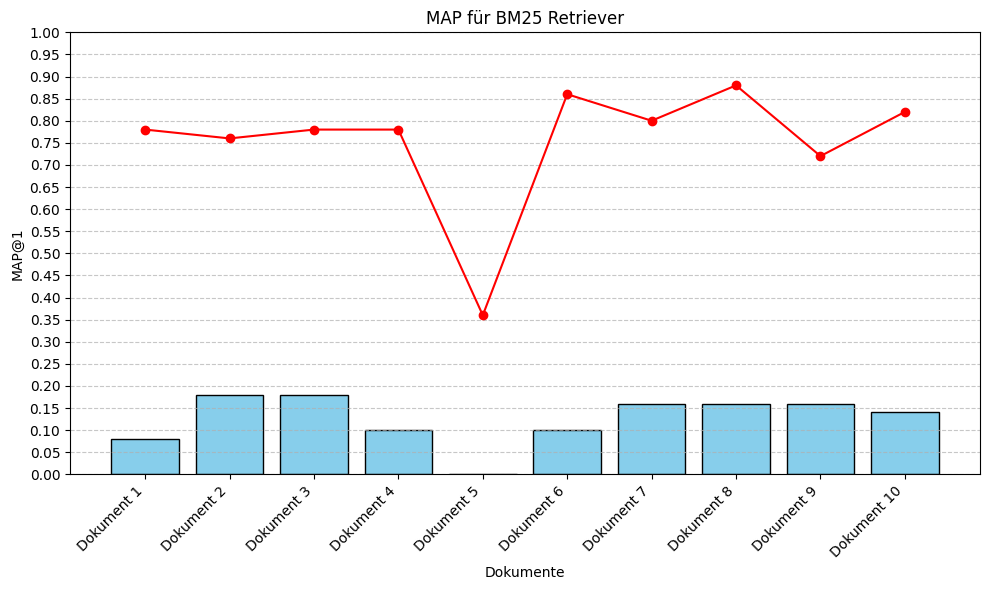

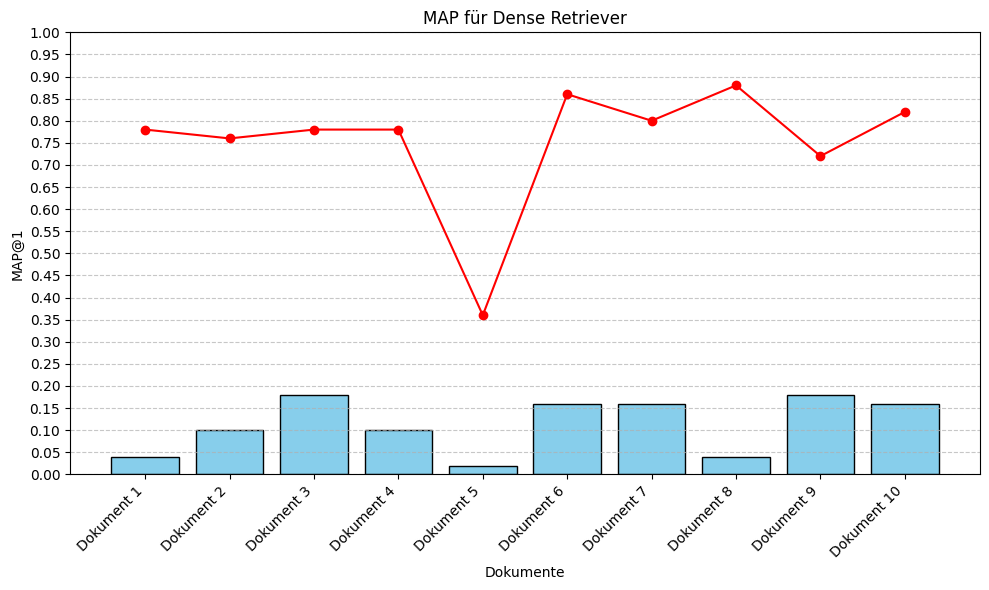

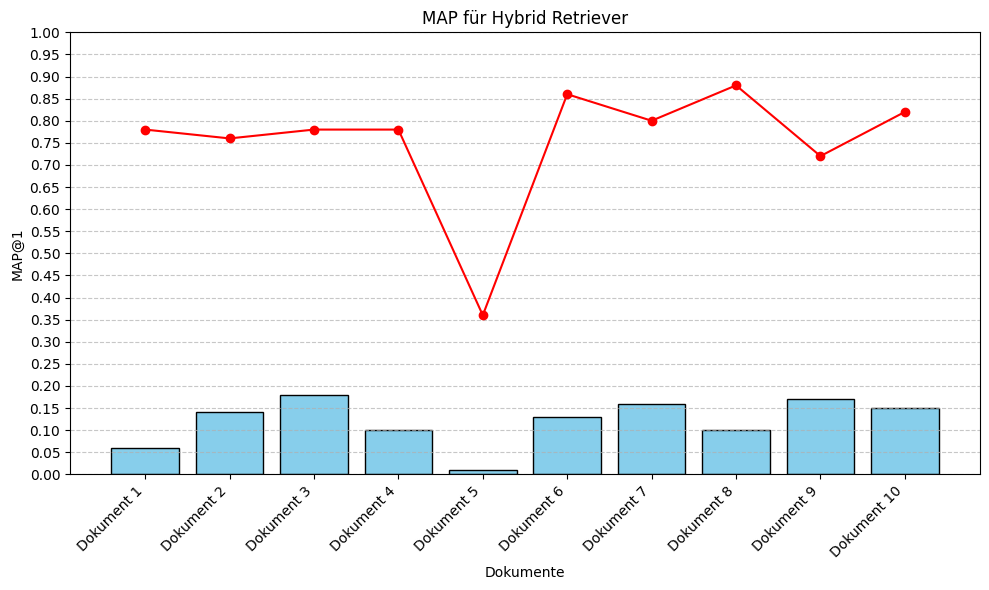

normierter MAP Bm25: [0.1025641  0.23684211 0.23076923 0.12820513 0.         0.11627907
 0.2        0.18181818 0.22222222 0.17073171]
normierter MAP Dense: [0.05128205 0.13157895 0.23076923 0.12820513 0.05555556 0.18604651
 0.2        0.04545455 0.25       0.19512195]
normierter MAP Hybrid: [0.07692308 0.18421053 0.23076923 0.12820513 0.02777778 0.15116279
 0.2        0.11363636 0.23611111 0.18292683]


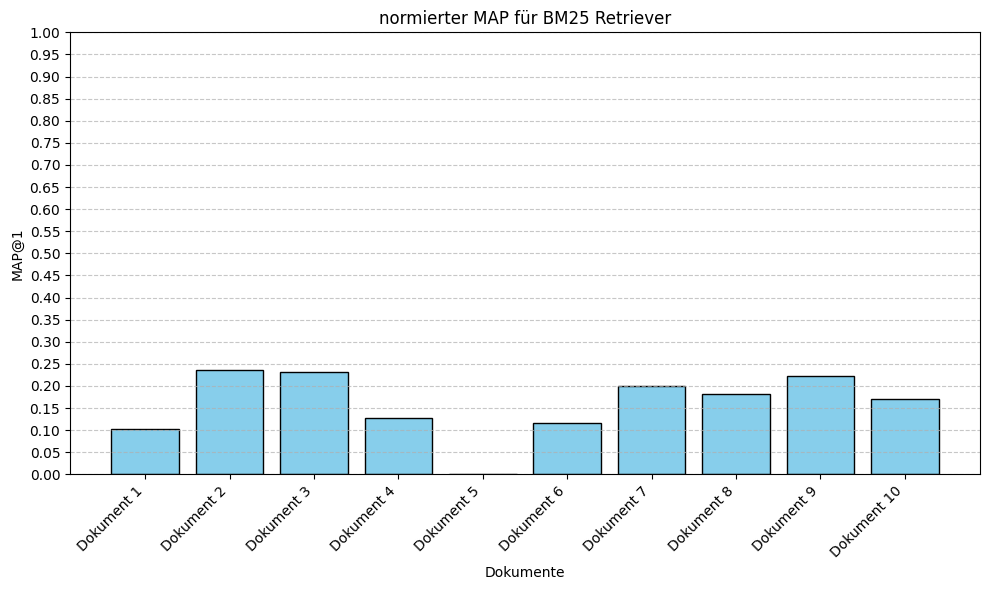

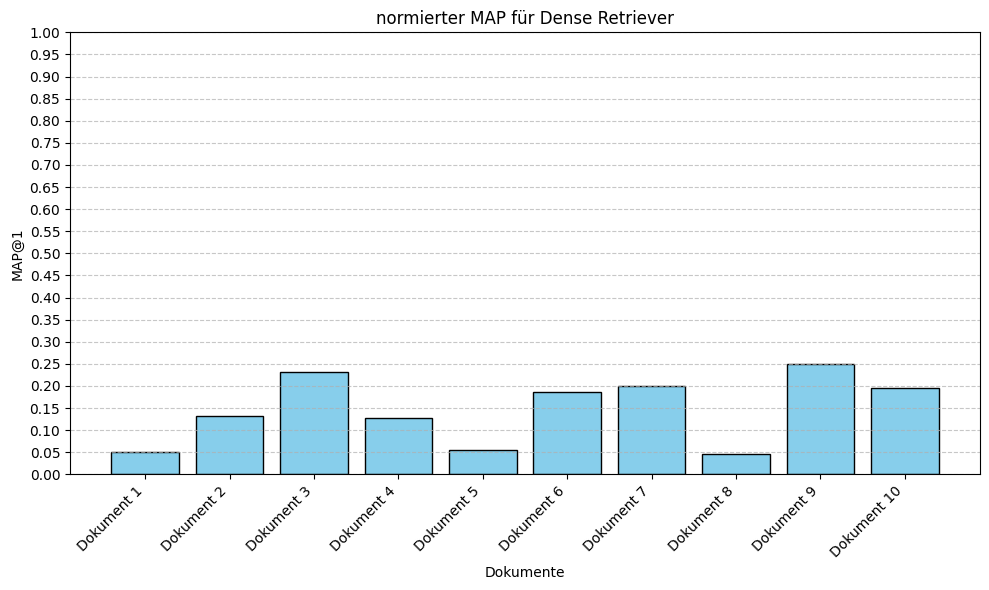

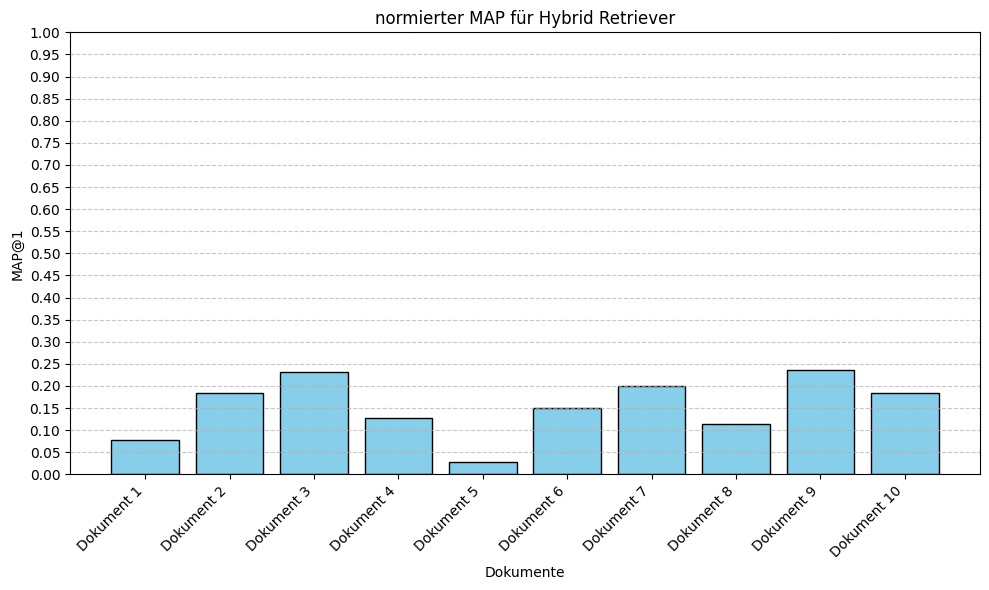

MAP@K BM25Retriever: [0.13 0.22 0.23 0.13 0.01 0.18 0.23 0.19 0.18 0.15]
Max MAP@K BM25Retriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K DenseRetriever: [0.06 0.17 0.24 0.18 0.03 0.23 0.24 0.09 0.25 0.19]
Max MAP@K DenseRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K HybridRetriever: [0.0817 0.1882 0.2201 0.1415 0.02   0.1966 0.223  0.1316 0.1883 0.165 ]
Max MAP@K HybridRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]


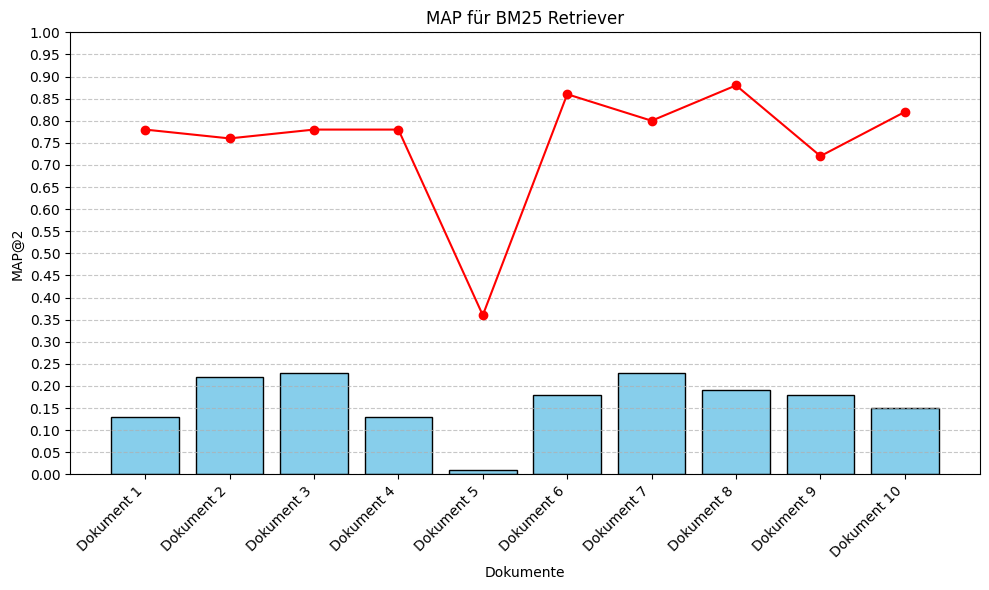

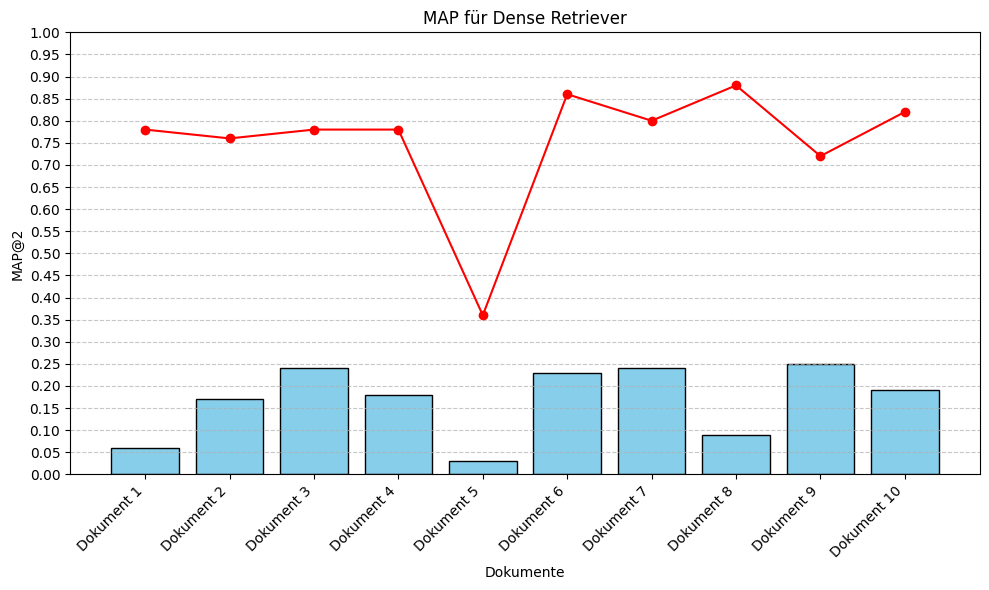

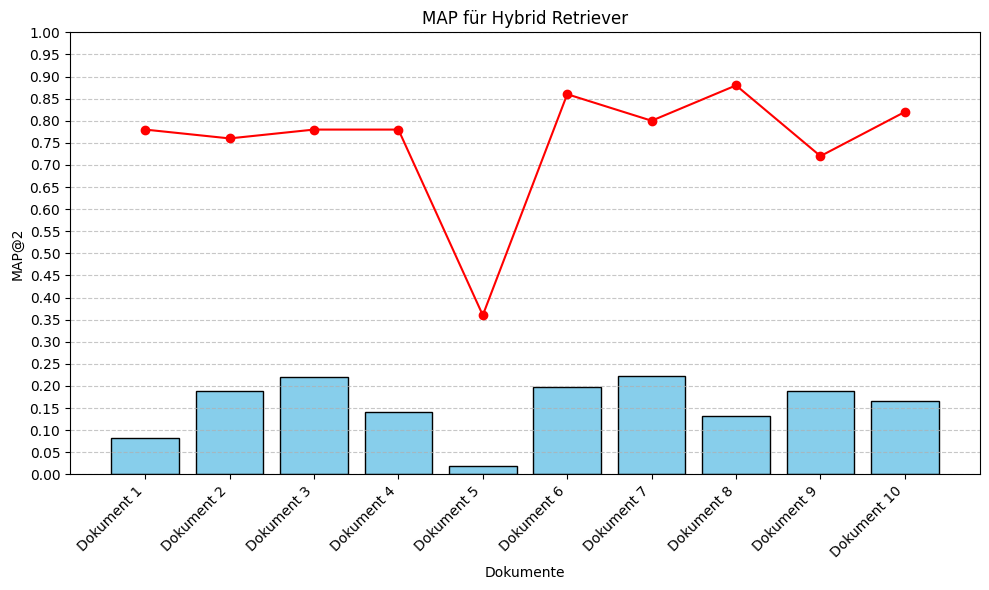

normierter MAP Bm25: [0.16666667 0.28947368 0.29487179 0.16666667 0.02777778 0.20930233
 0.2875     0.21590909 0.25       0.18292683]
normierter MAP Dense: [0.07692308 0.22368421 0.30769231 0.23076923 0.08333333 0.26744186
 0.3        0.10227273 0.34722222 0.23170732]
normierter MAP Hybrid: [0.10474359 0.24763158 0.28217949 0.18141026 0.05555556 0.22860465
 0.27875    0.14954545 0.26152778 0.20121951]


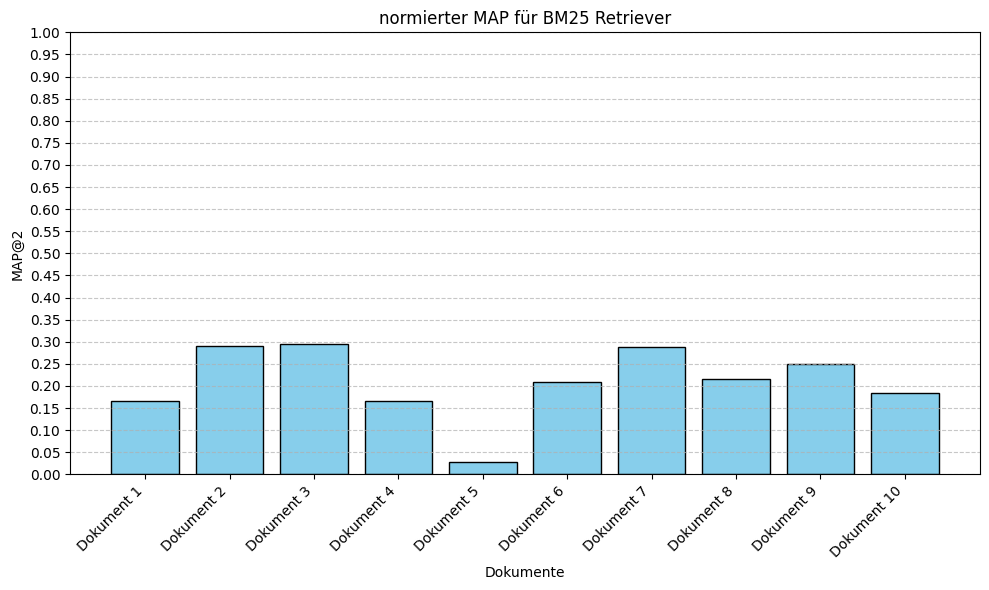

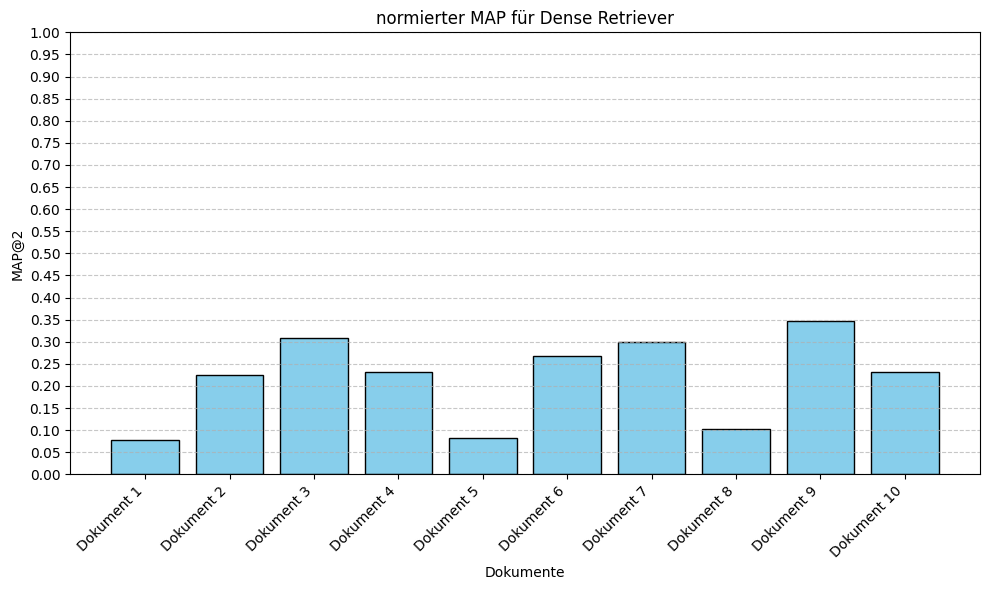

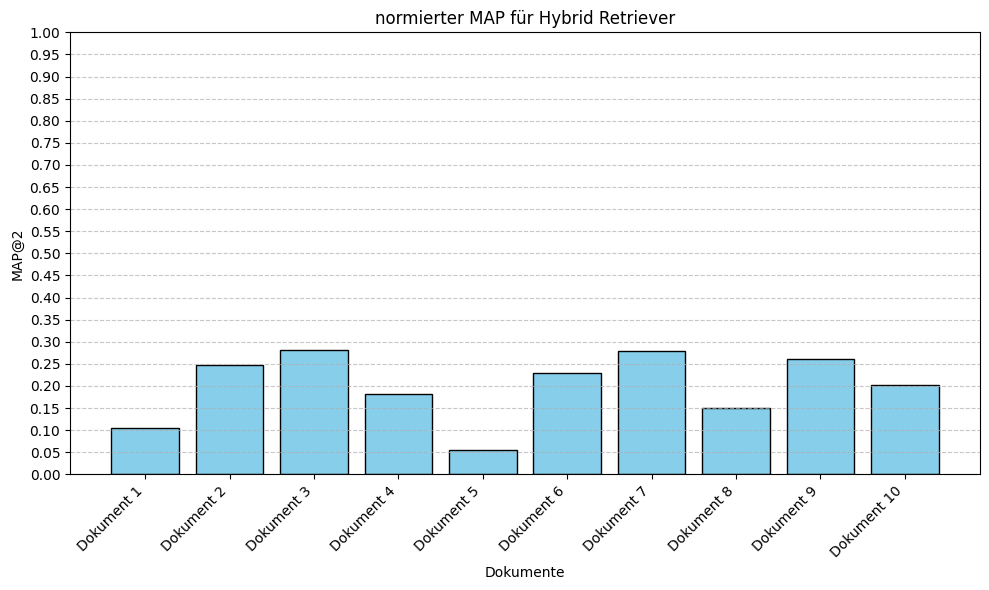

MAP@K BM25Retriever: [0.1449 0.2398 0.2465 0.1432 0.0166 0.1932 0.23   0.19   0.1998 0.1533]
Max MAP@K BM25Retriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K DenseRetriever: [0.0732 0.175  0.2829 0.1998 0.03   0.2515 0.273  0.0983 0.2467 0.2164]
Max MAP@K DenseRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K HybridRetriever: [0.0925 0.1964 0.234  0.143  0.0234 0.2075 0.2363 0.1375 0.1842 0.1741]
Max MAP@K HybridRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]


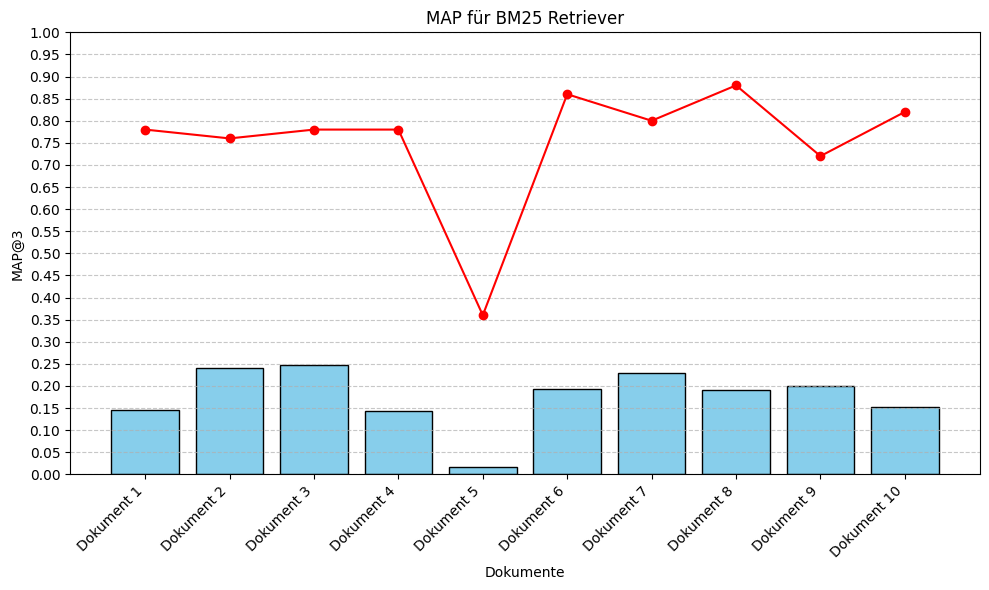

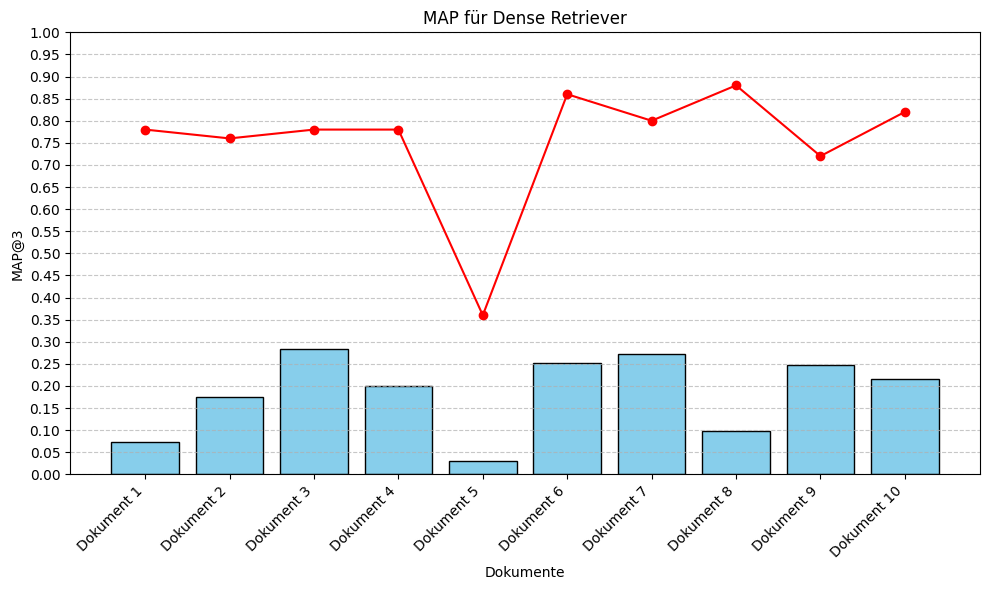

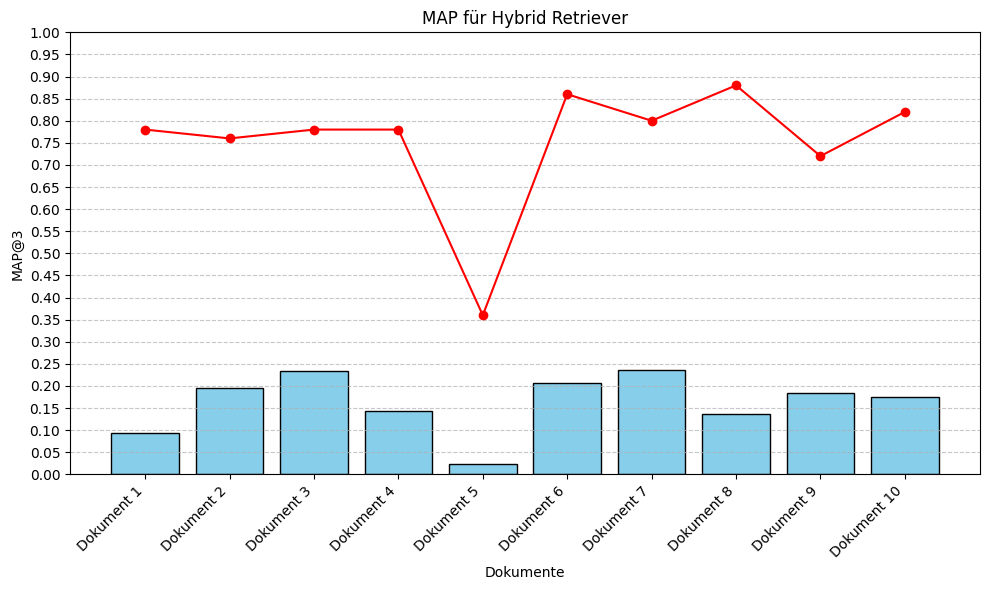

normierter MAP Bm25: [0.18576923 0.31552632 0.31602564 0.18358974 0.04611111 0.22465116
 0.2875     0.21590909 0.2775     0.18695122]
normierter MAP Dense: [0.09384615 0.23026316 0.36269231 0.25615385 0.08333333 0.29244186
 0.34125    0.11170455 0.34263889 0.26390244]
normierter MAP Hybrid: [0.11858974 0.25842105 0.3        0.18333333 0.065      0.24127907
 0.295375   0.15625    0.25583333 0.21231707]


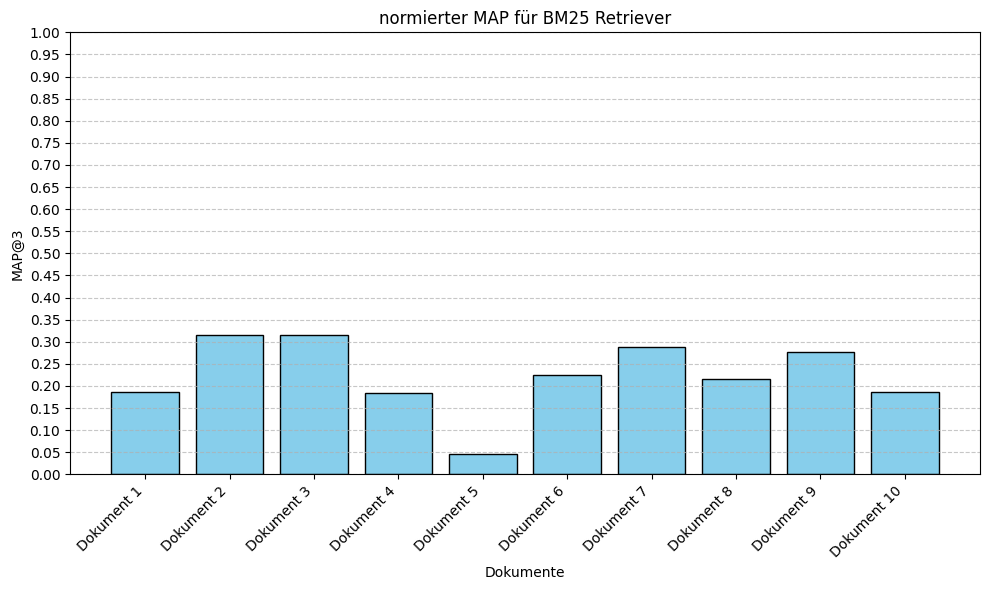

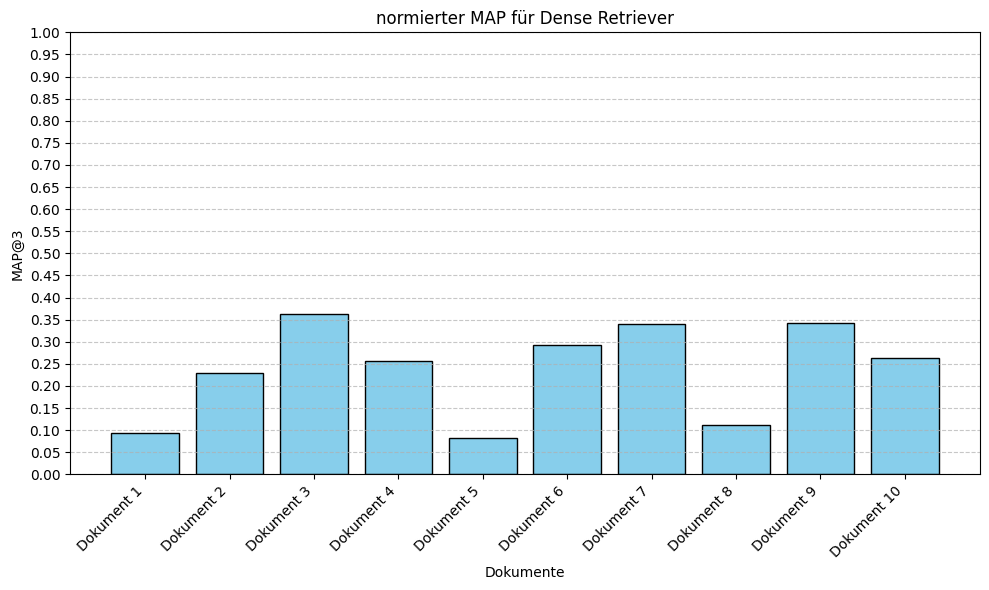

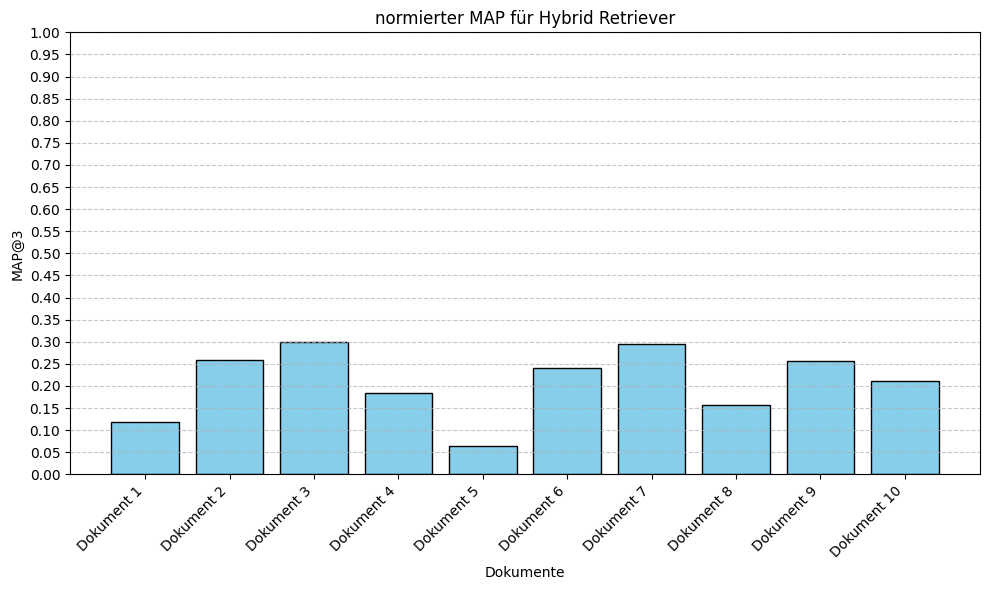

MAP@K BM25Retriever: [0.1599     0.2465     0.2715     0.1649     0.0166     0.2032
 0.235      0.19443333 0.2015     0.1583    ]
Max MAP@K BM25Retriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K DenseRetriever: [0.0882     0.17443333 0.3163     0.2248     0.03       0.2565
 0.263      0.1044     0.2567     0.2114    ]
Max MAP@K DenseRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K HybridRetriever: [0.10763333 0.19986667 0.24626667 0.15366667 0.0234     0.211
 0.2291     0.14016667 0.1873     0.1644    ]
Max MAP@K HybridRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]


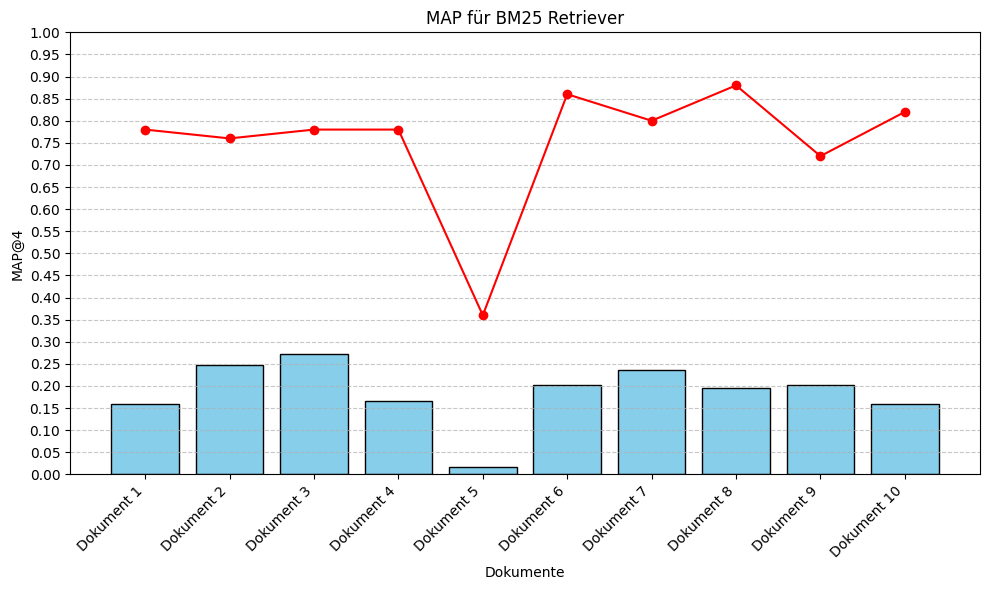

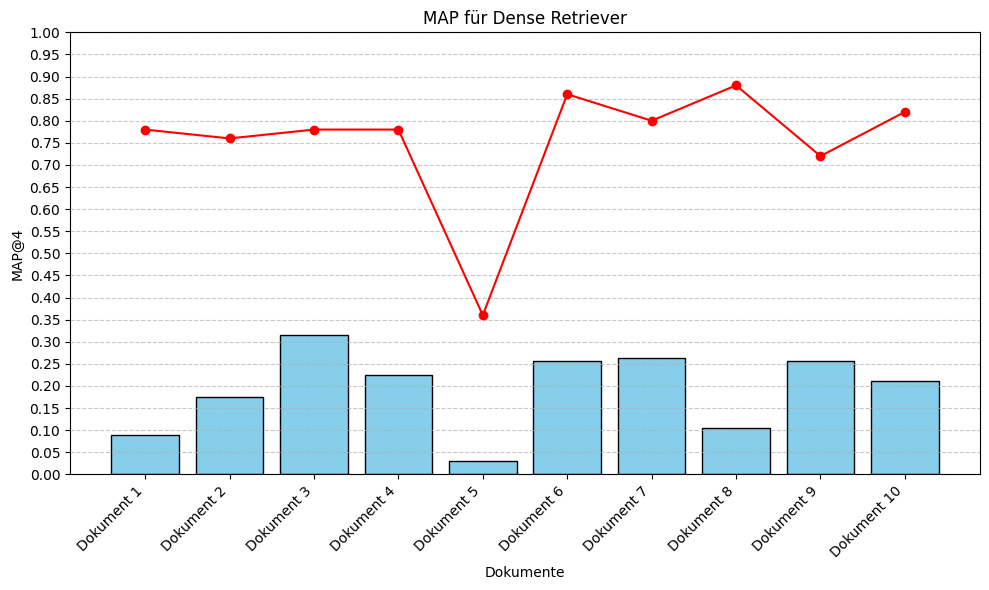

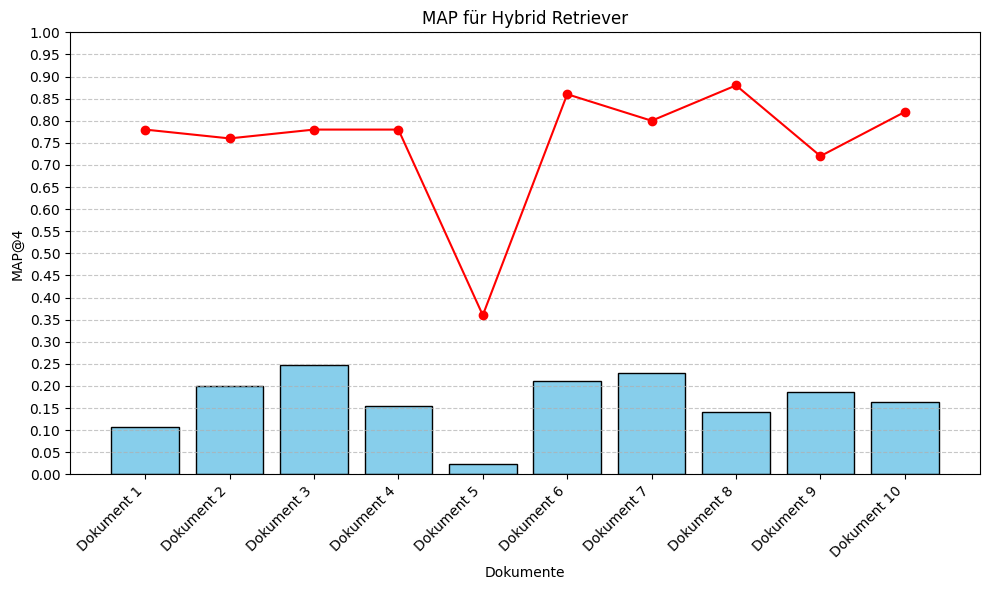

normierter MAP Bm25: [0.205      0.32434211 0.34807692 0.21141026 0.04611111 0.23627907
 0.29375    0.22094697 0.27986111 0.19304878]
normierter MAP Dense: [0.11307692 0.22951754 0.40551282 0.28820513 0.08333333 0.29825581
 0.32875    0.11863636 0.35652778 0.25780488]
normierter MAP Hybrid: [0.13799145 0.26298246 0.3157265  0.19700855 0.065      0.24534884
 0.286375   0.1592803  0.26013889 0.2004878 ]


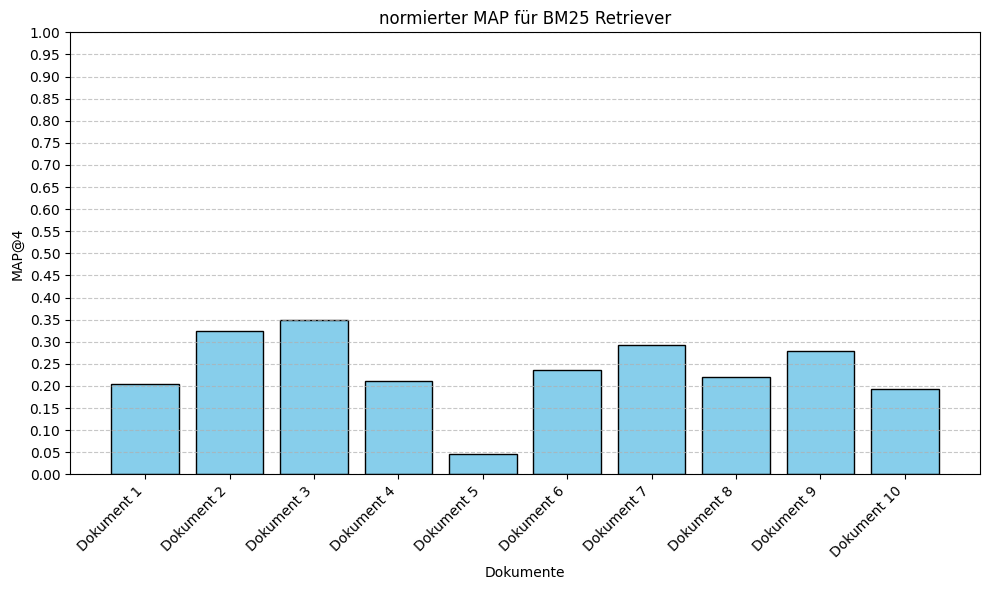

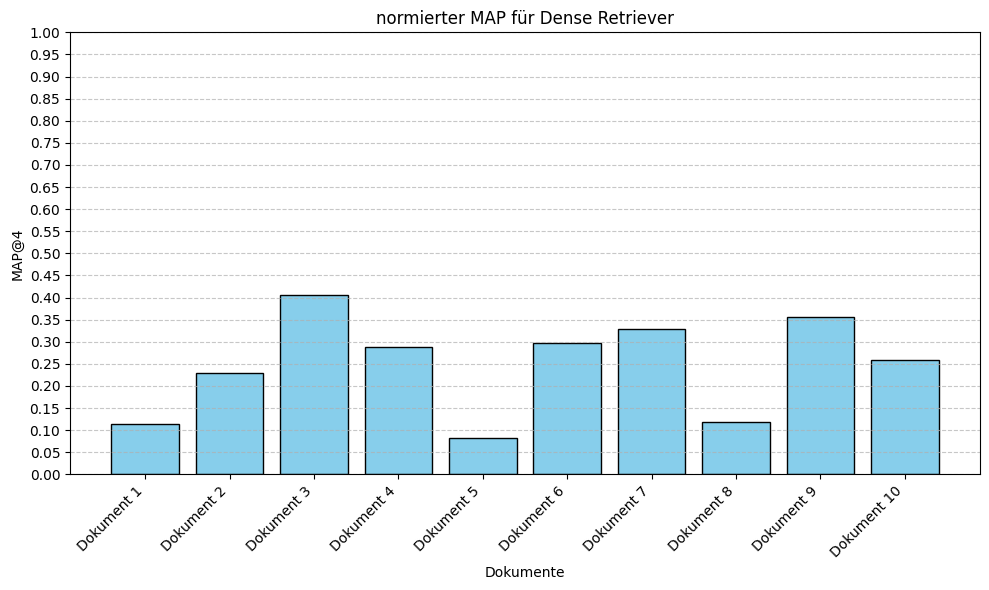

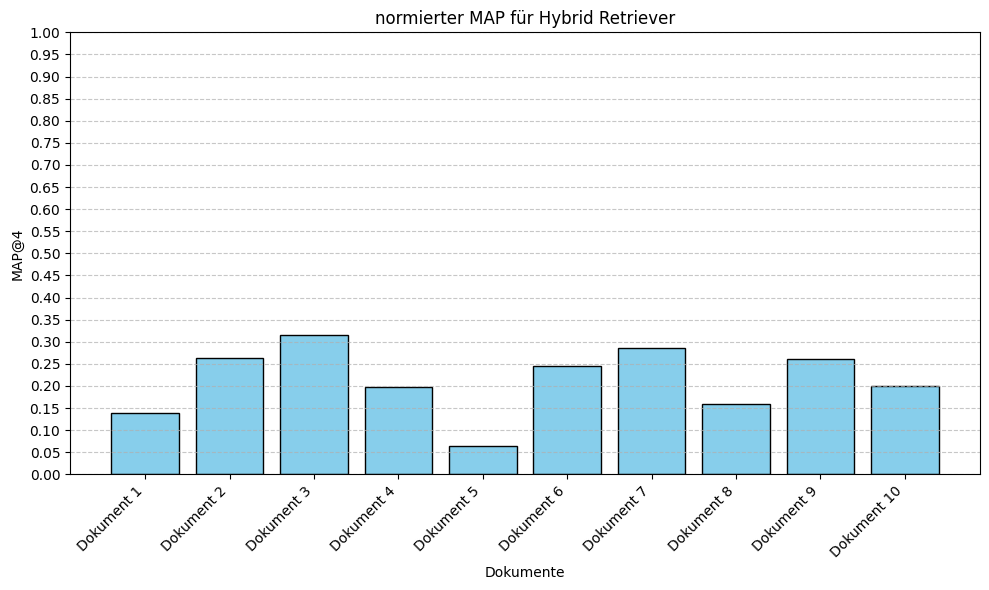

MAP@K BM25Retriever: [0.1719     0.2445     0.2739     0.16913333 0.0206     0.2152
 0.2385     0.20243333 0.2015     0.1623    ]
Max MAP@K BM25Retriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K DenseRetriever: [0.0992     0.18643333 0.32716667 0.2335     0.038      0.2605
 0.2677     0.1074     0.2667     0.2154    ]
Max MAP@K DenseRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K HybridRetriever: [0.11783333 0.1965     0.24783333 0.15796667 0.0298     0.213
 0.23086667 0.14406667 0.1965     0.1688    ]
Max MAP@K HybridRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]


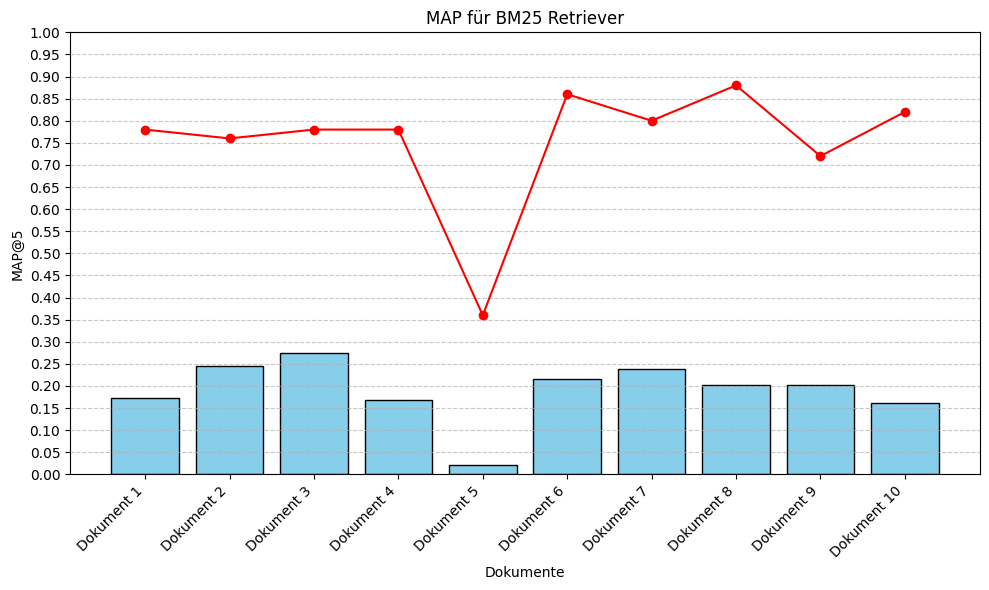

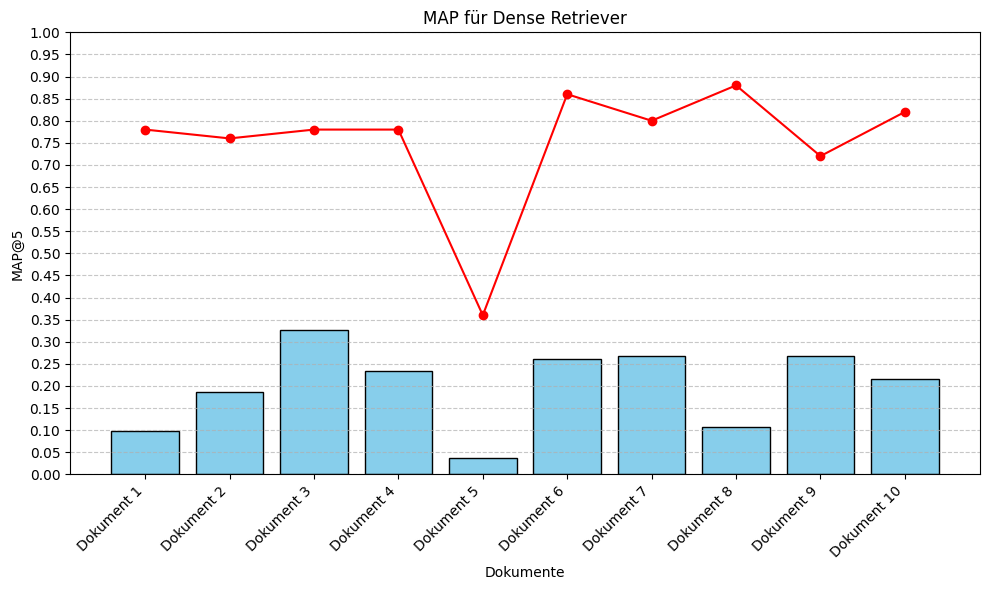

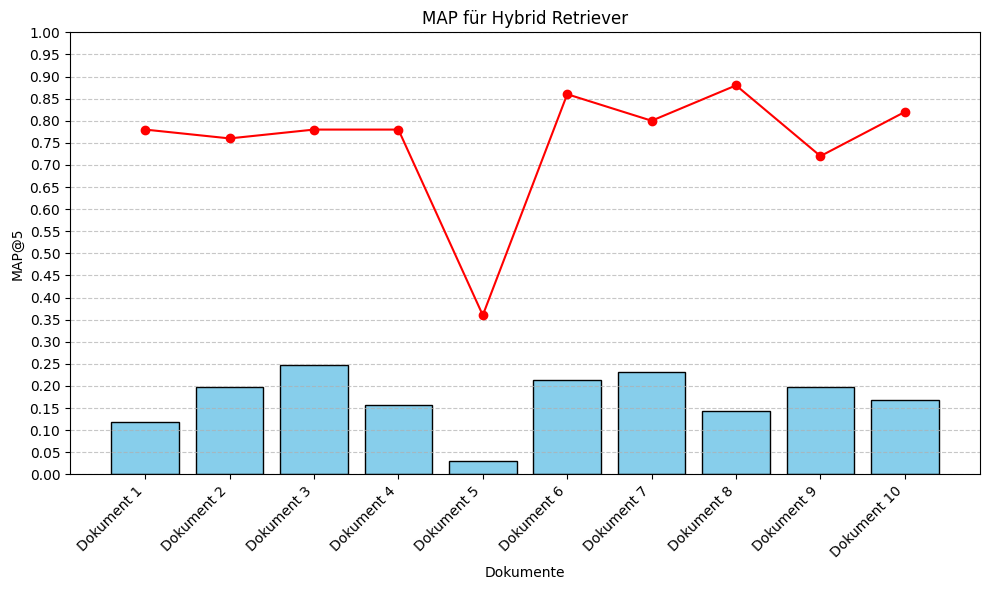

normierter MAP Bm25: [0.22038462 0.32171053 0.35115385 0.21683761 0.05722222 0.25023256
 0.298125   0.23003788 0.27986111 0.19792683]
normierter MAP Dense: [0.12717949 0.24530702 0.41944444 0.29935897 0.10555556 0.30290698
 0.334625   0.12204545 0.37041667 0.26268293]
normierter MAP Hybrid: [0.15106838 0.25855263 0.31773504 0.20252137 0.08277778 0.24767442
 0.28858333 0.16371212 0.27291667 0.20585366]


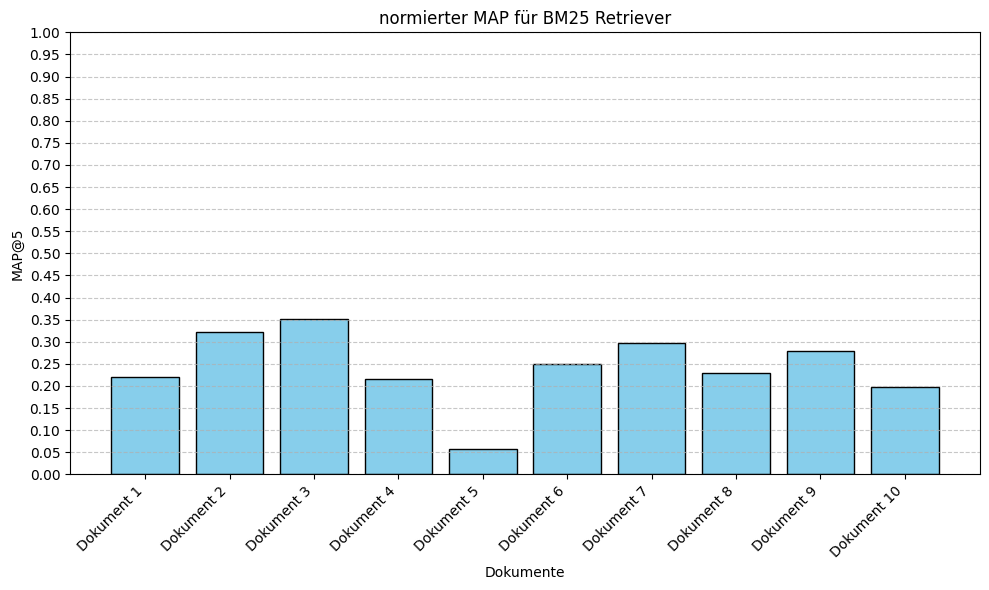

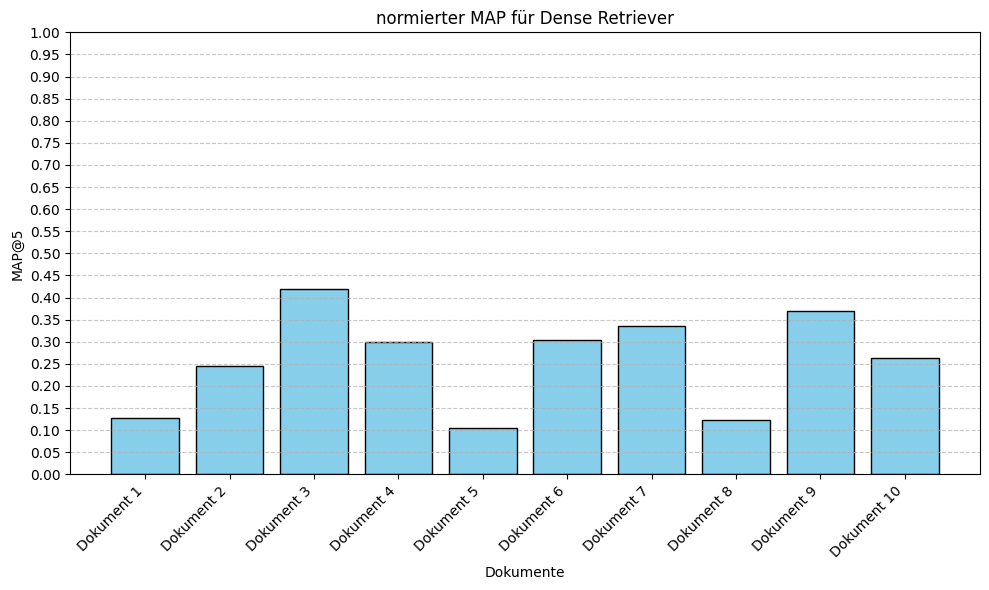

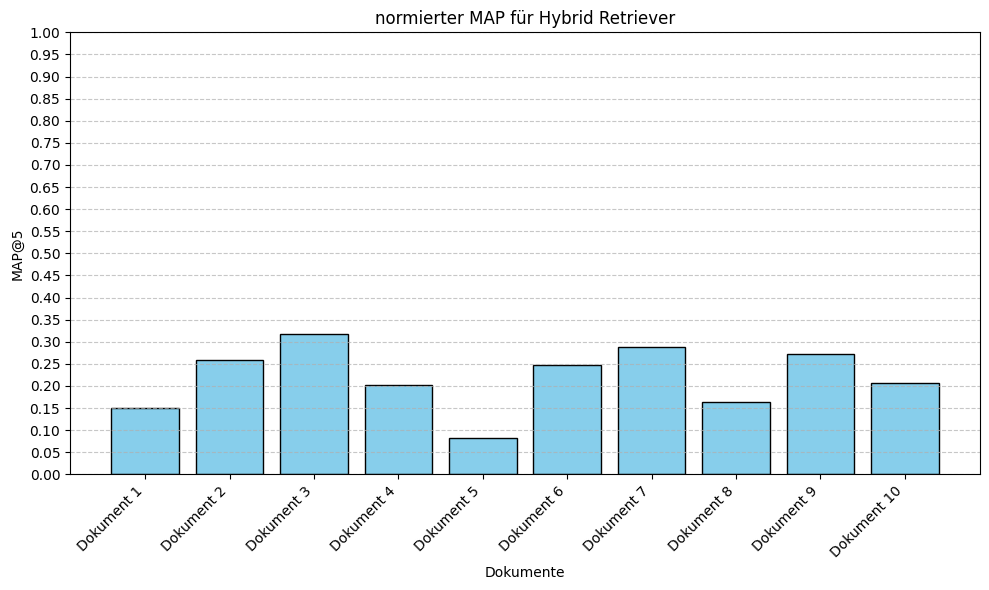

MAP@K BM25Retriever: [0.1953     0.24506667 0.2773     0.1907     0.0206     0.2254
 0.2432     0.19913333 0.2049     0.1691    ]
Max MAP@K BM25Retriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K DenseRetriever: [0.106      0.19663333 0.32766667 0.2352     0.0414     0.25823333
 0.2591     0.1159     0.2803     0.2256    ]
Max MAP@K DenseRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K HybridRetriever: [0.13026667 0.19763333 0.24945    0.15956667 0.0307     0.21166667
 0.22381667 0.14503333 0.1995     0.171     ]
Max MAP@K HybridRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]


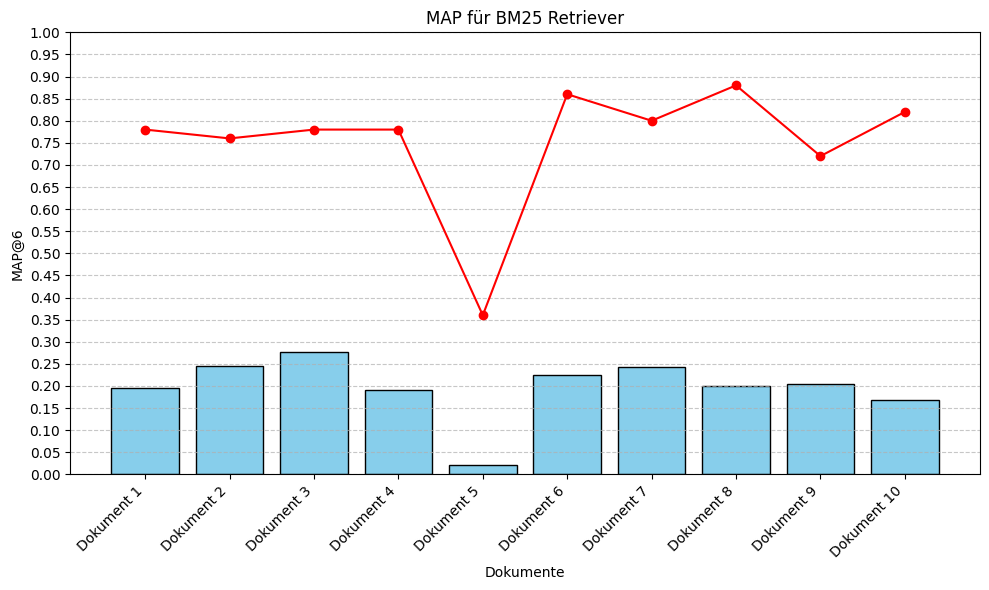

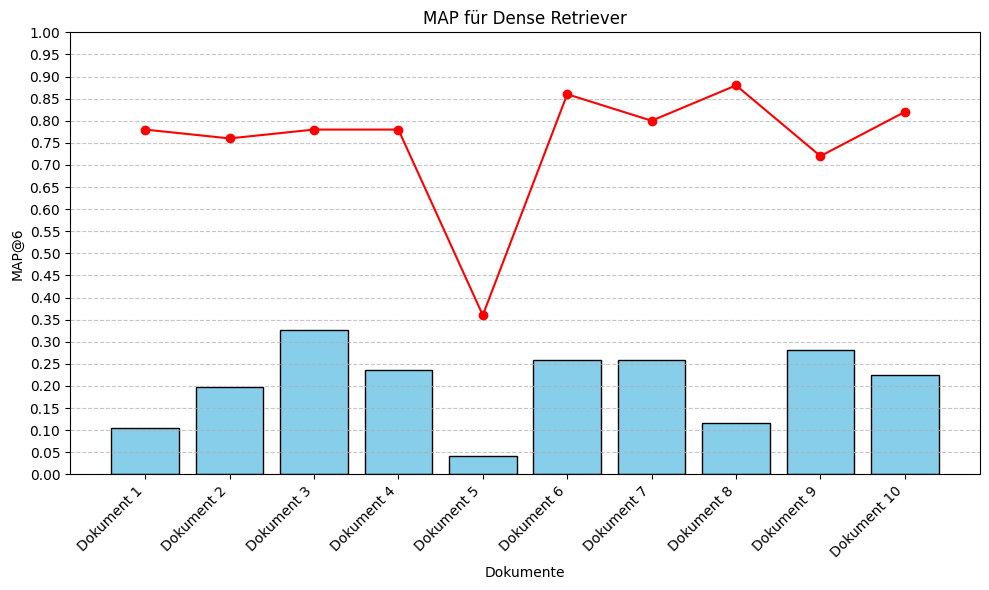

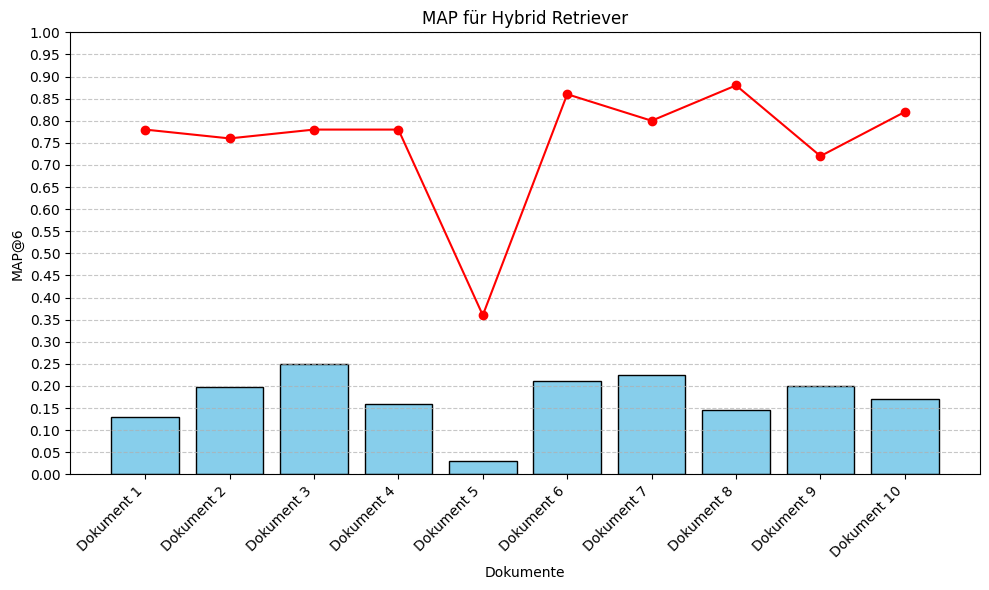

normierter MAP Bm25: [0.25038462 0.32245614 0.35551282 0.24448718 0.05722222 0.26209302
 0.304      0.22628788 0.28458333 0.20621951]
normierter MAP Dense: [0.13589744 0.25872807 0.42008547 0.30153846 0.115      0.30027132
 0.323875   0.13170455 0.38930556 0.27512195]
normierter MAP Hybrid: [0.16700855 0.26004386 0.31980769 0.20457265 0.08527778 0.24612403
 0.27977083 0.16481061 0.27708333 0.20853659]


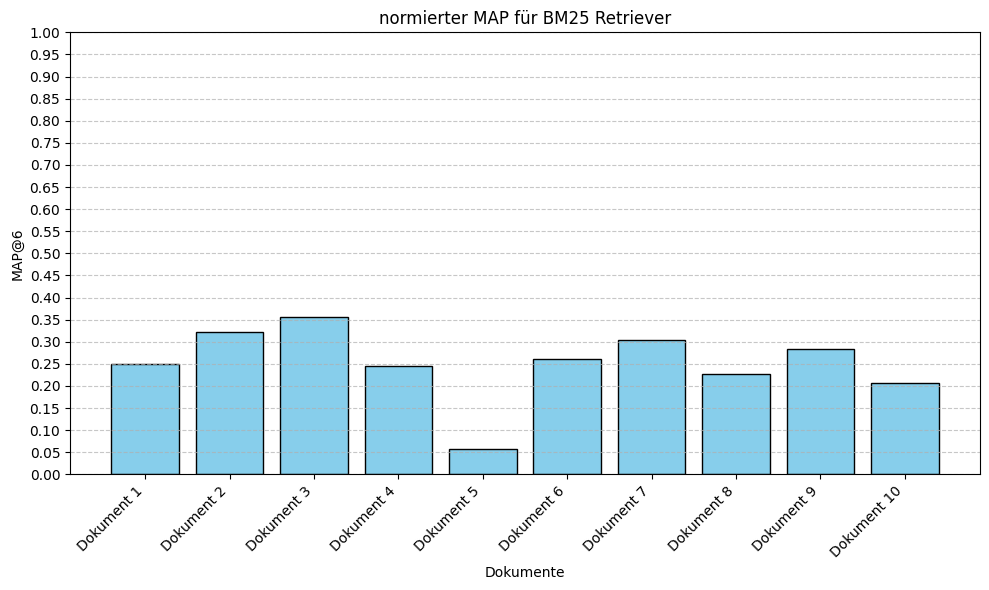

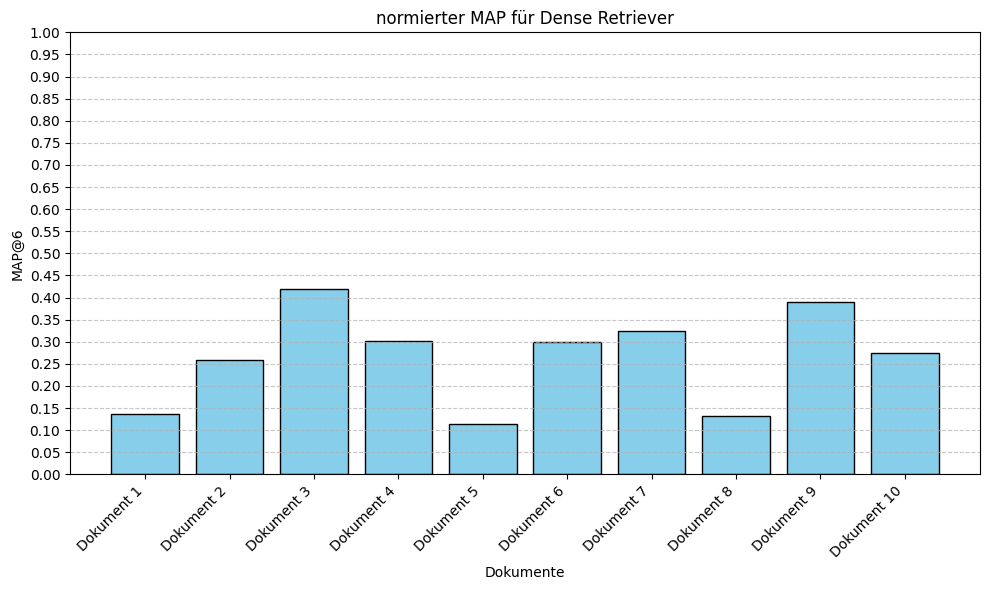

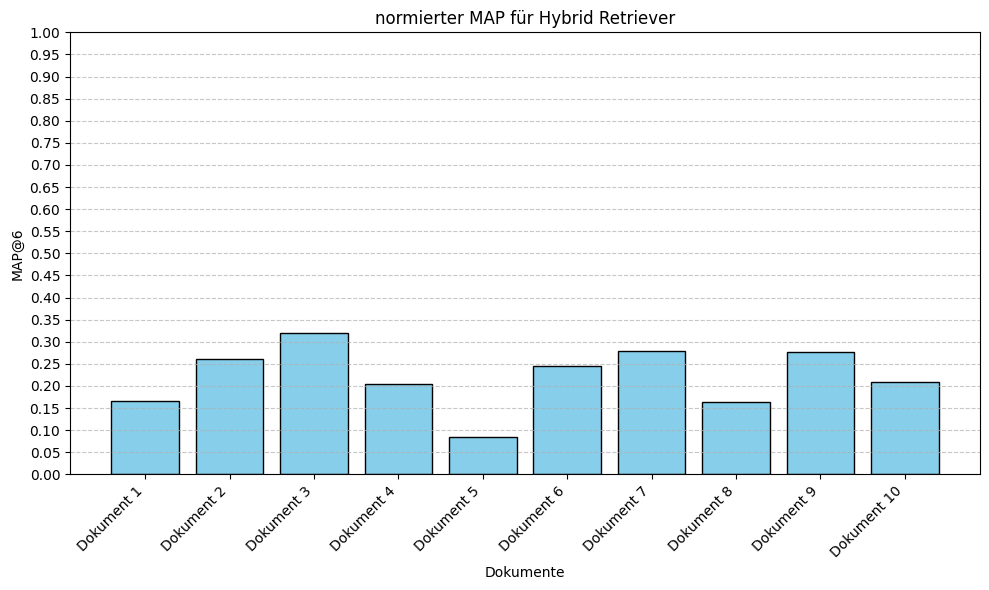

MAP@K BM25Retriever: [0.2007     0.25066667 0.279      0.20203333 0.0234     0.2261
 0.2488     0.19913333 0.2185     0.1435    ]
Max MAP@K BM25Retriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K DenseRetriever: [0.1129     0.19513333 0.32376667 0.2405     0.0554     0.24693333
 0.26       0.1187     0.281      0.2256    ]
Max MAP@K DenseRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K HybridRetriever: [0.1402     0.1968     0.2361     0.16403333 0.0375     0.20806667
 0.22641667 0.14503333 0.2035     0.1617    ]
Max MAP@K HybridRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]


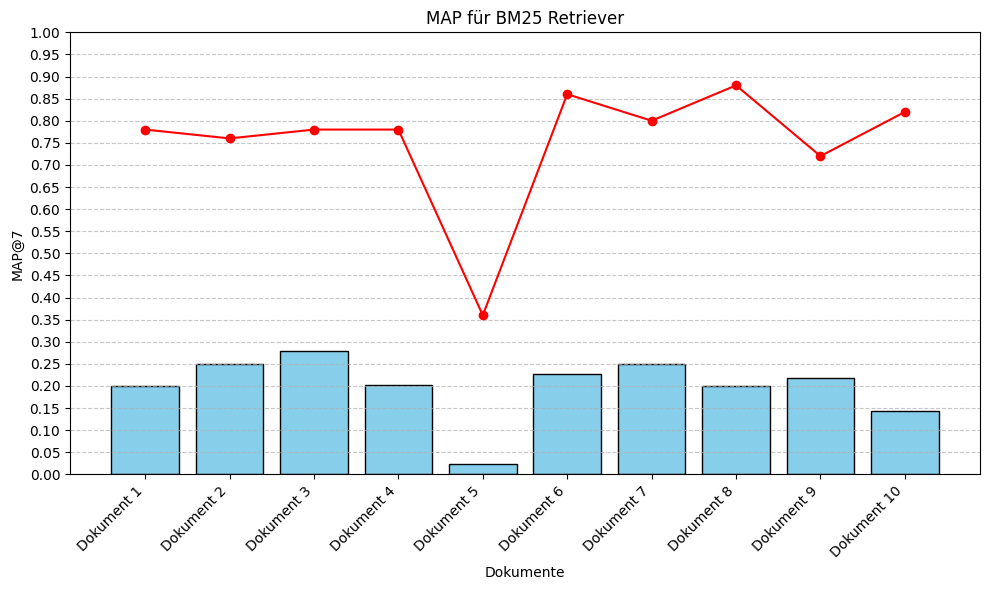

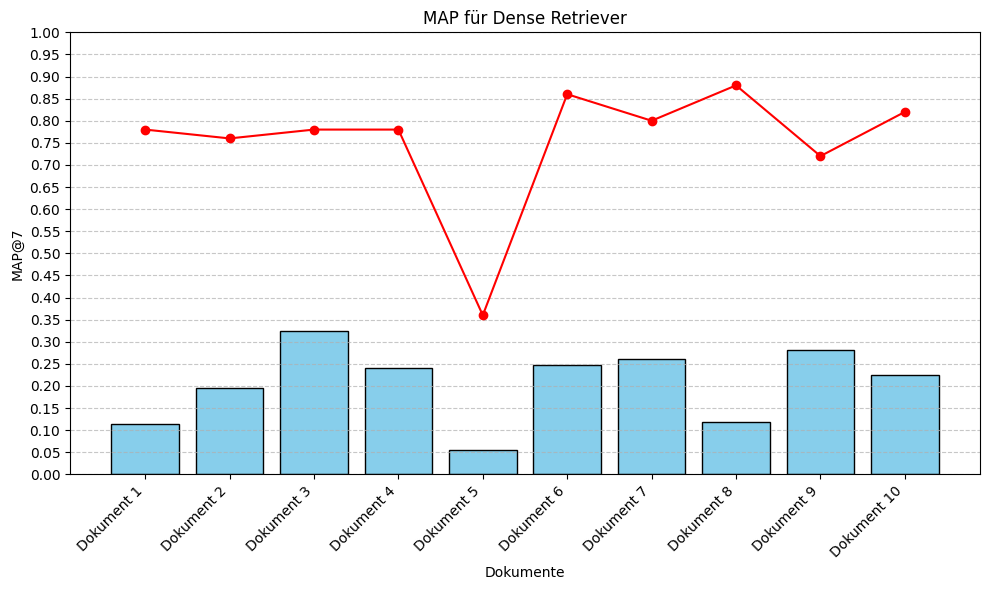

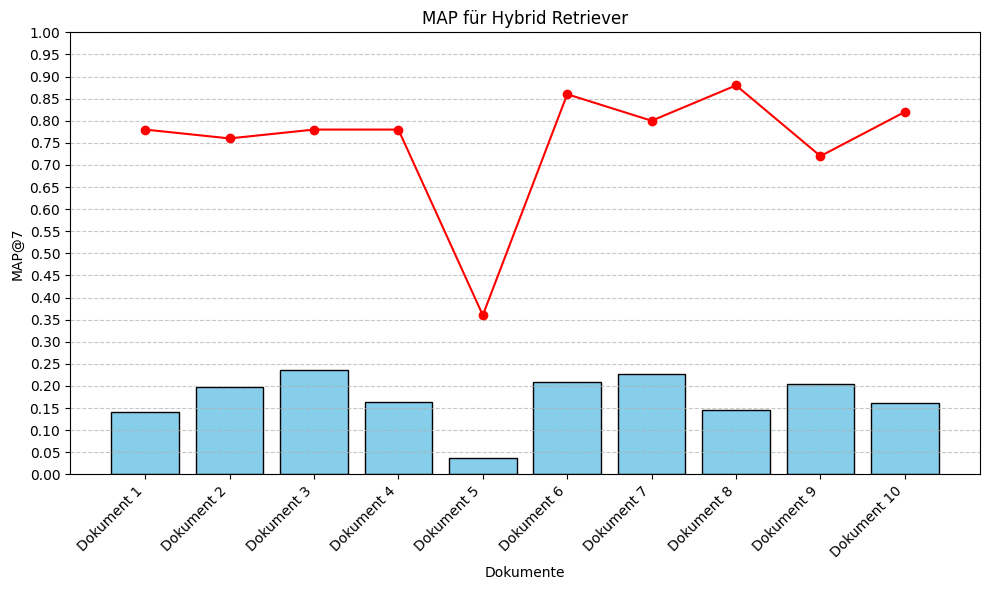

normierter MAP Bm25: [0.25730769 0.32982456 0.35769231 0.25901709 0.065      0.26290698
 0.311      0.22628788 0.30347222 0.175     ]
normierter MAP Dense: [0.14474359 0.25675439 0.41508547 0.30833333 0.15388889 0.28713178
 0.325      0.13488636 0.39027778 0.27512195]
normierter MAP Hybrid: [0.17974359 0.25894737 0.30269231 0.21029915 0.10416667 0.24193798
 0.28302083 0.16481061 0.28263889 0.19719512]


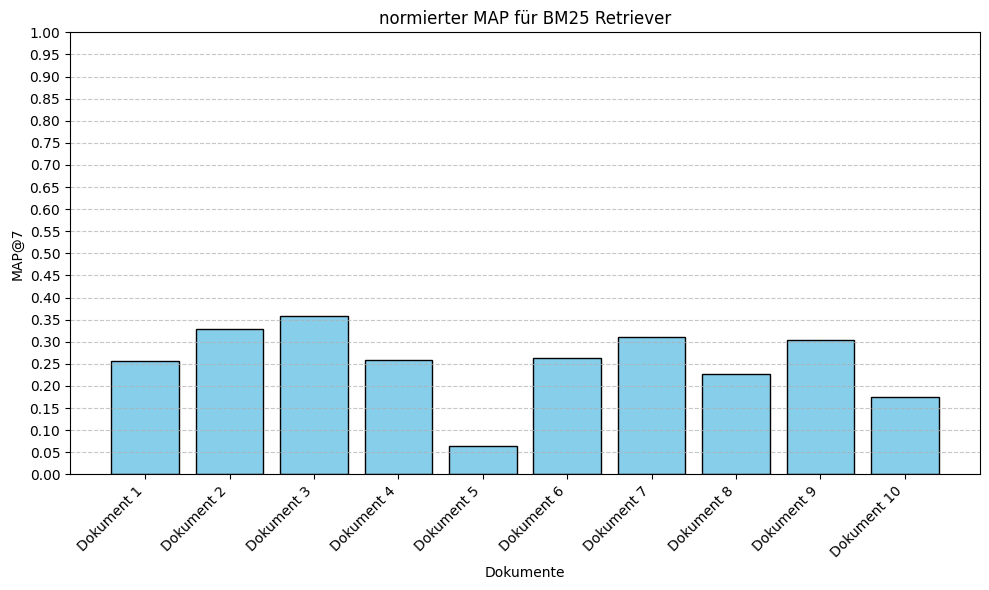

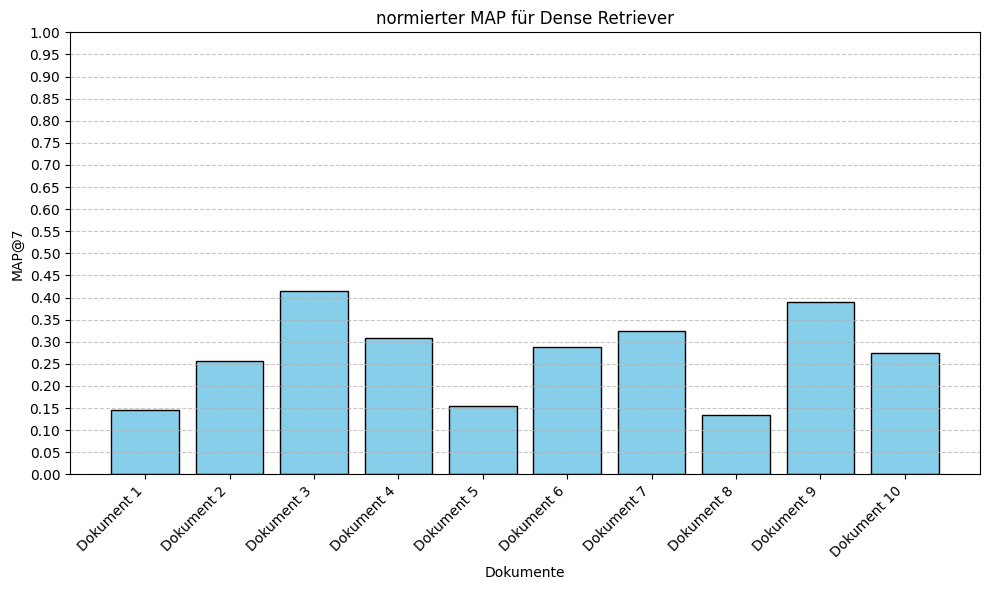

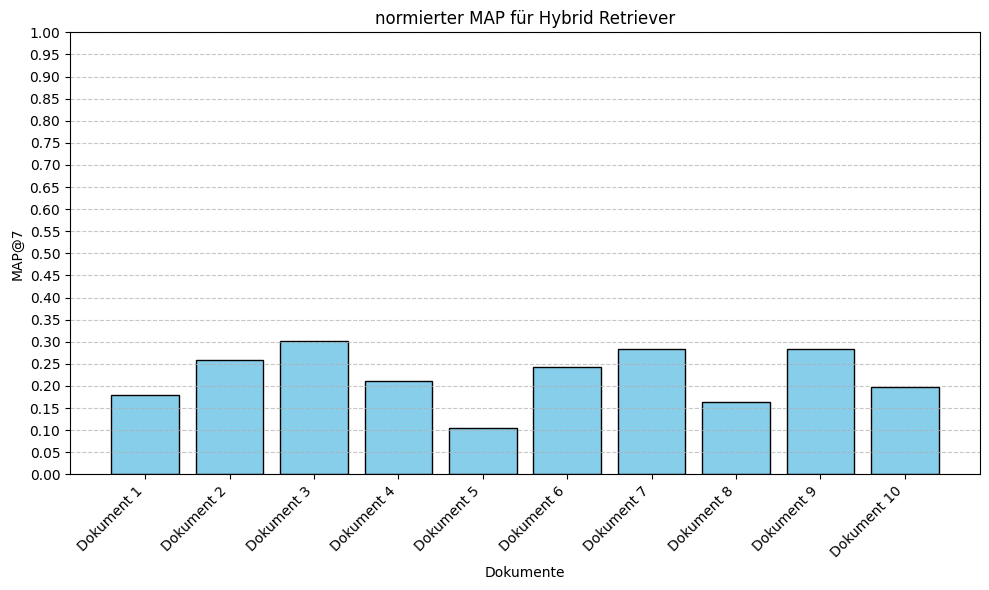

MAP@K BM25Retriever: [0.2046     0.25066667 0.2688     0.20883333 0.0234     0.2285
 0.2499     0.1961     0.224      0.13133333]
Max MAP@K BM25Retriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K DenseRetriever: [0.119      0.19263333 0.32376667 0.2365     0.0578     0.24538333
 0.2677     0.12326667 0.2833     0.2328    ]
Max MAP@K DenseRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K HybridRetriever: [0.14286667 0.19473333 0.23723333 0.16826667 0.0387     0.20776667
 0.22694667 0.14241333 0.2074     0.15773333]
Max MAP@K HybridRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]


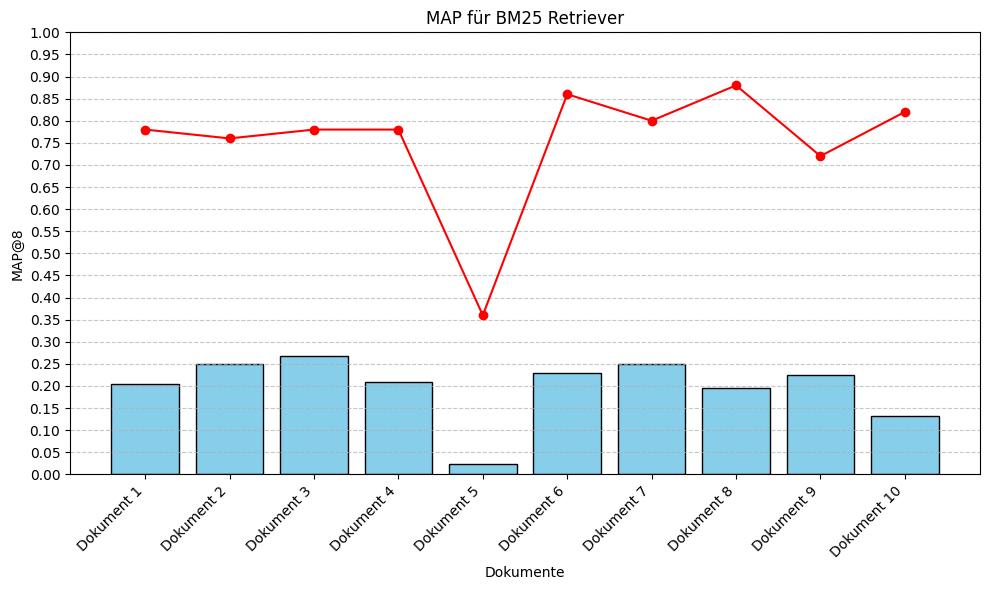

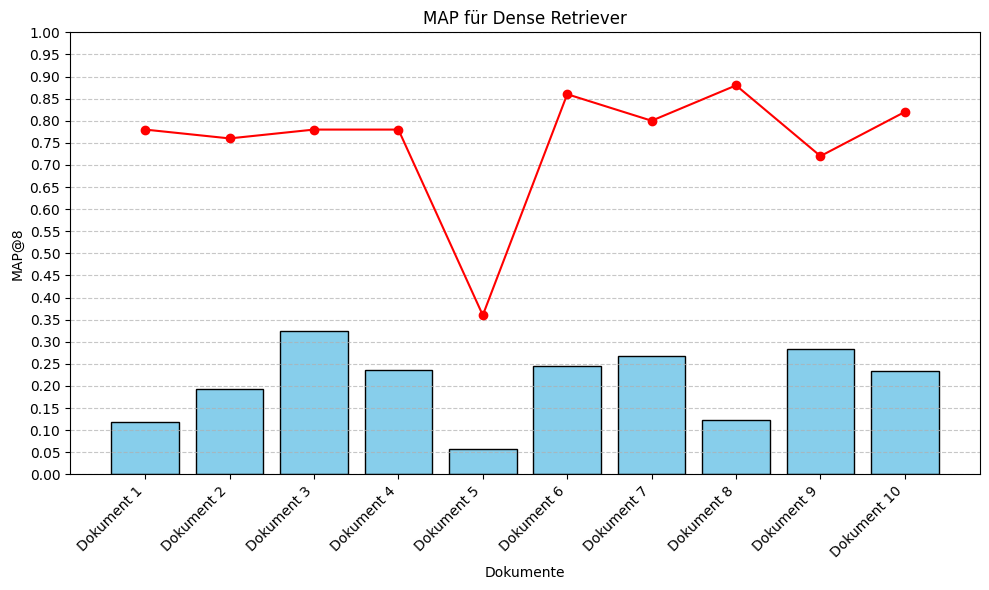

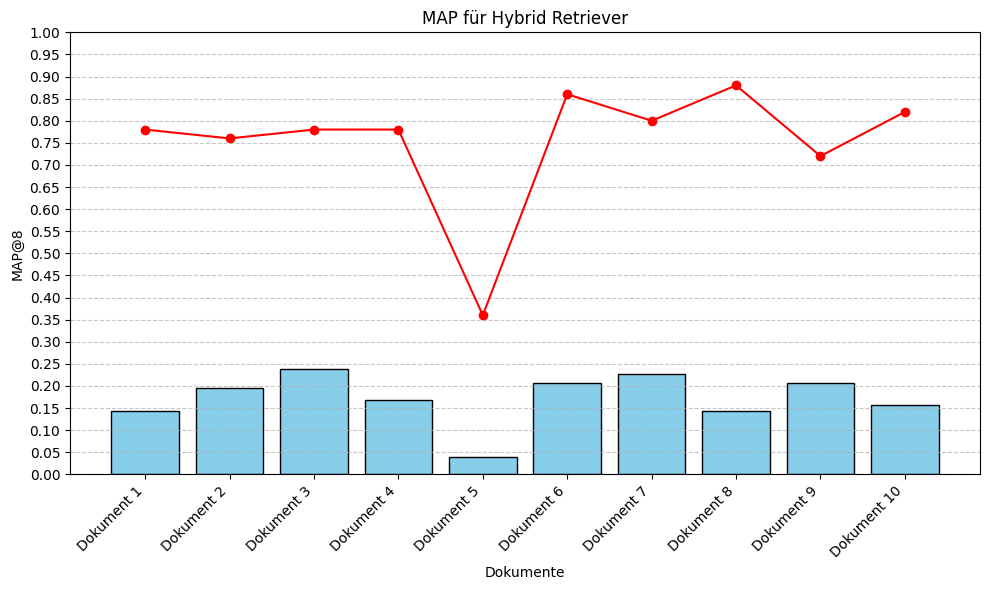

normierter MAP Bm25: [0.26230769 0.32982456 0.34461538 0.26773504 0.065      0.26569767
 0.312375   0.22284091 0.31111111 0.1601626 ]
normierter MAP Dense: [0.1525641  0.25346491 0.41508547 0.30320513 0.16055556 0.28532946
 0.334625   0.14007576 0.39347222 0.28390244]
normierter MAP Hybrid: [0.18316239 0.25622807 0.3041453  0.2157265  0.1075     0.24158915
 0.28368333 0.16183333 0.28805556 0.19235772]


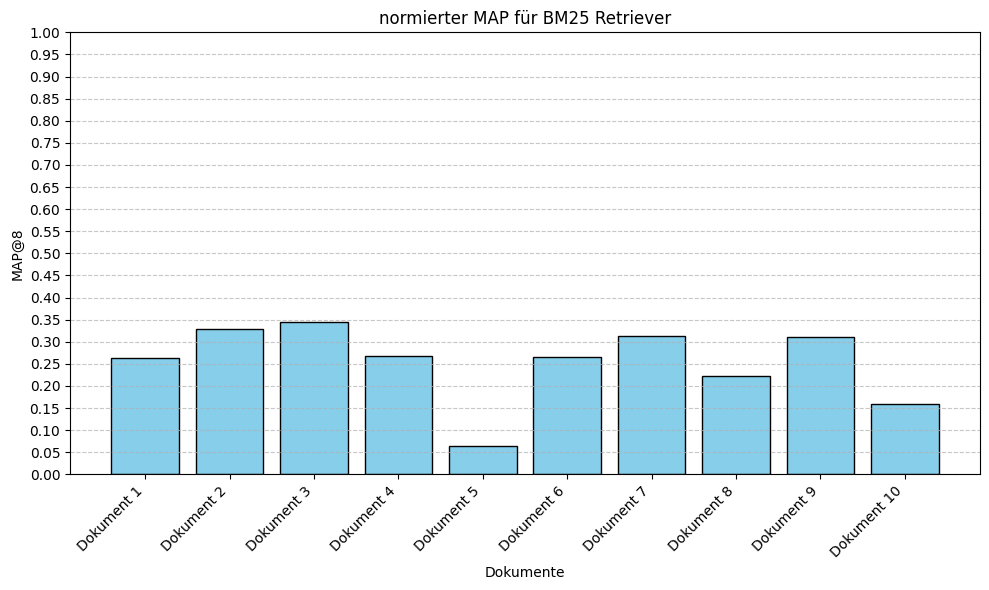

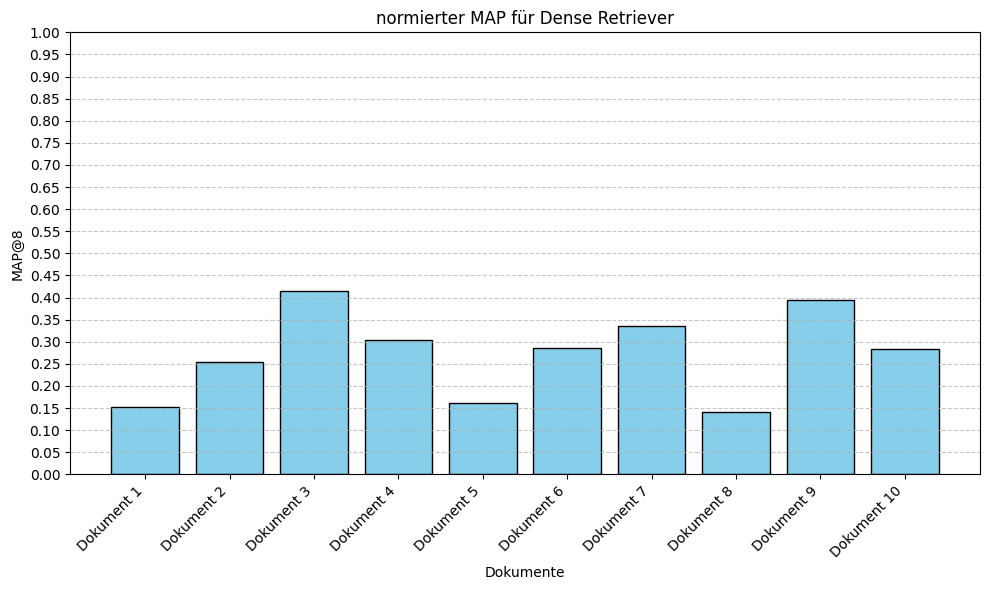

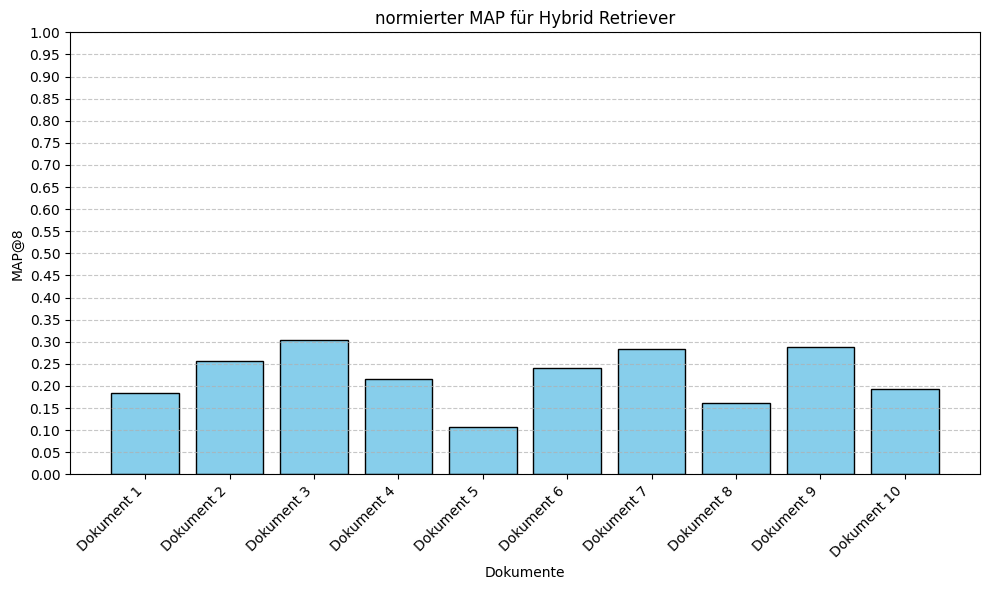

MAP@K BM25Retriever: [0.2075     0.25286667 0.26263333 0.21363333 0.0234     0.2307
 0.2587     0.18106667 0.2162     0.13156667]
Max MAP@K BM25Retriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K DenseRetriever: [0.1234     0.20143333 0.32836667 0.2312     0.06       0.24488333
 0.2742     0.12376667 0.286      0.2372    ]
Max MAP@K DenseRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K HybridRetriever: [0.13903333 0.19283333 0.23933333 0.1699     0.0401     0.20654
 0.21988    0.13363    0.20813333 0.16053333]
Max MAP@K HybridRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]


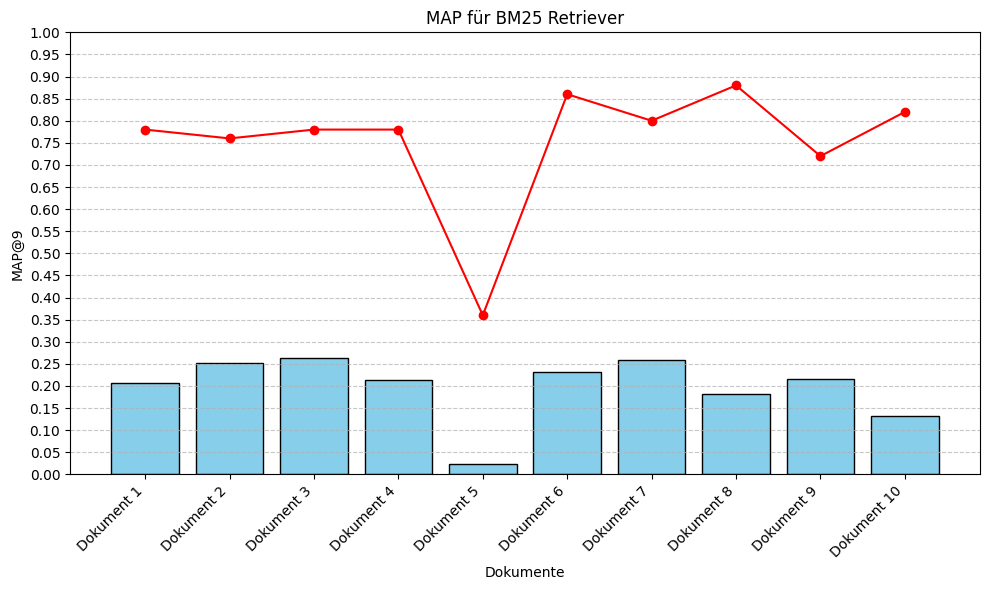

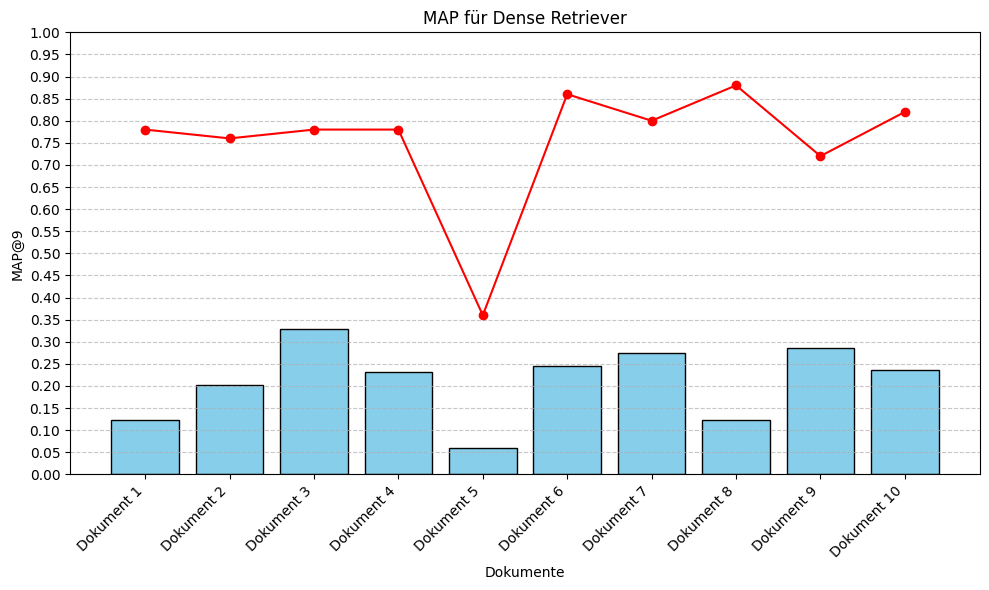

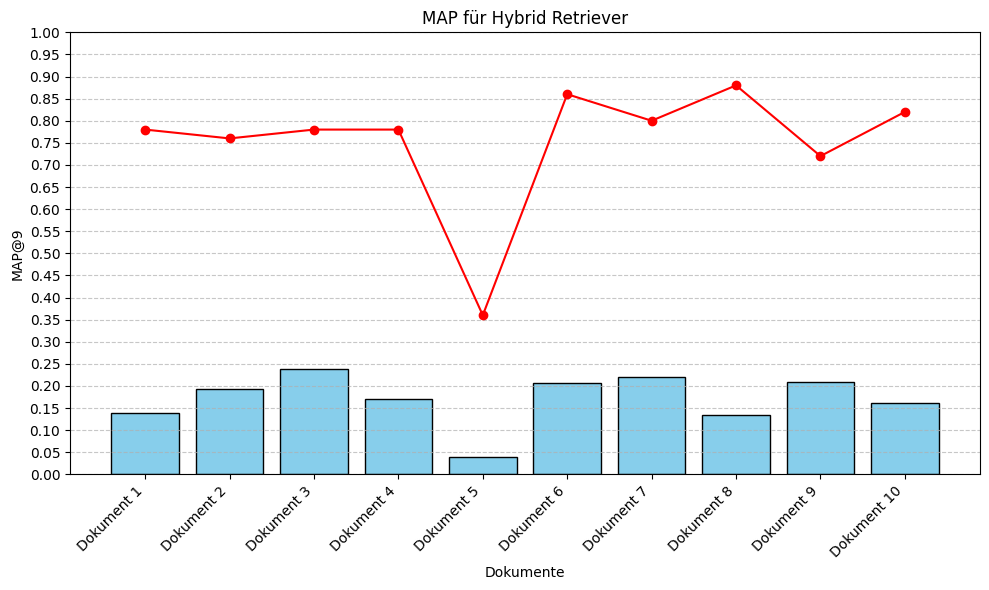

normierter MAP Bm25: [0.26602564 0.3327193  0.3367094  0.27388889 0.065      0.26825581
 0.323375   0.20575758 0.30027778 0.16044715]
normierter MAP Dense: [0.15820513 0.26504386 0.42098291 0.29641026 0.16666667 0.28474806
 0.34275    0.14064394 0.39722222 0.28926829]
normierter MAP Hybrid: [0.17824786 0.25372807 0.30683761 0.21782051 0.11138889 0.24016279
 0.27485    0.15185227 0.28907407 0.19577236]


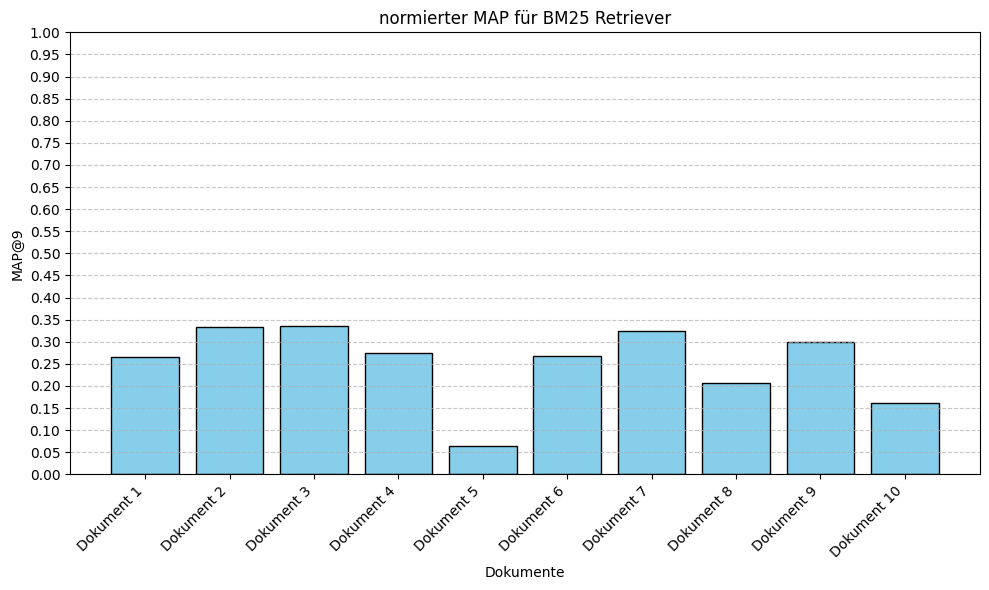

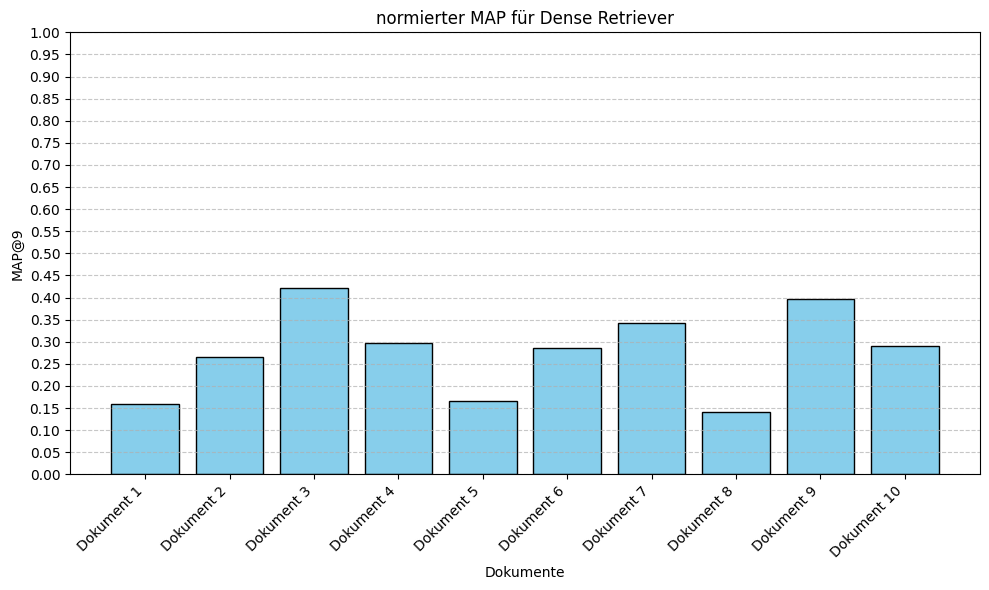

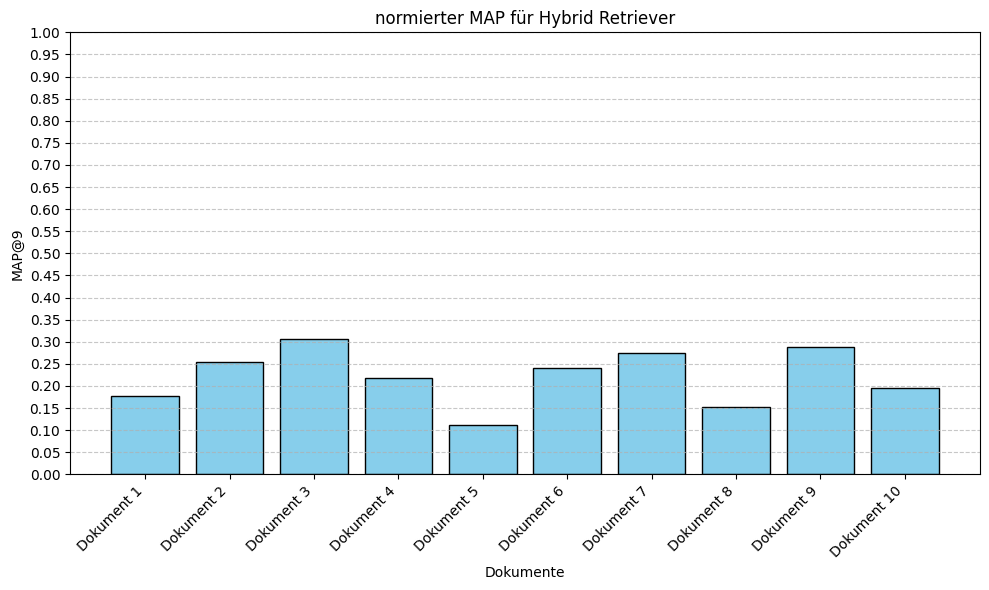

MAP@K BM25Retriever: [0.20703333 0.25486667 0.25473333 0.21653333 0.0234     0.2327
 0.2593     0.18565    0.2237     0.13556667]
Max MAP@K BM25Retriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K DenseRetriever: [0.1254     0.20163333 0.32353333 0.23113333 0.064      0.24488333
 0.27381667 0.12606667 0.25676667 0.2392    ]
Max MAP@K DenseRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]
MAP@K HybridRetriever: [0.139      0.1918     0.23453333 0.17171667 0.0417     0.20654
 0.21874    0.13708333 0.2008     0.16183333]
Max MAP@K HybridRetriever: [0.78 0.76 0.78 0.78 0.36 0.86 0.8  0.88 0.72 0.82]


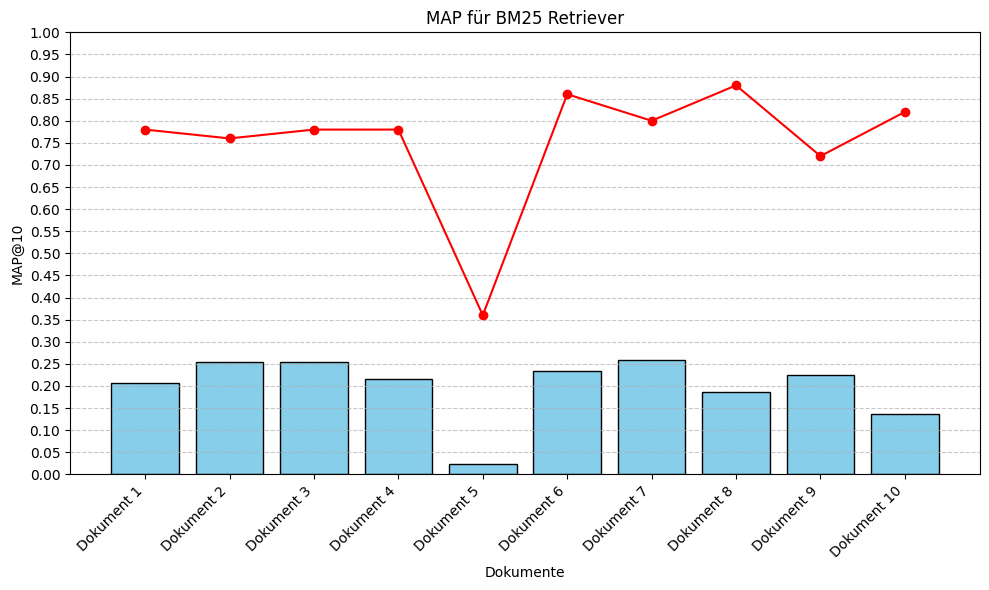

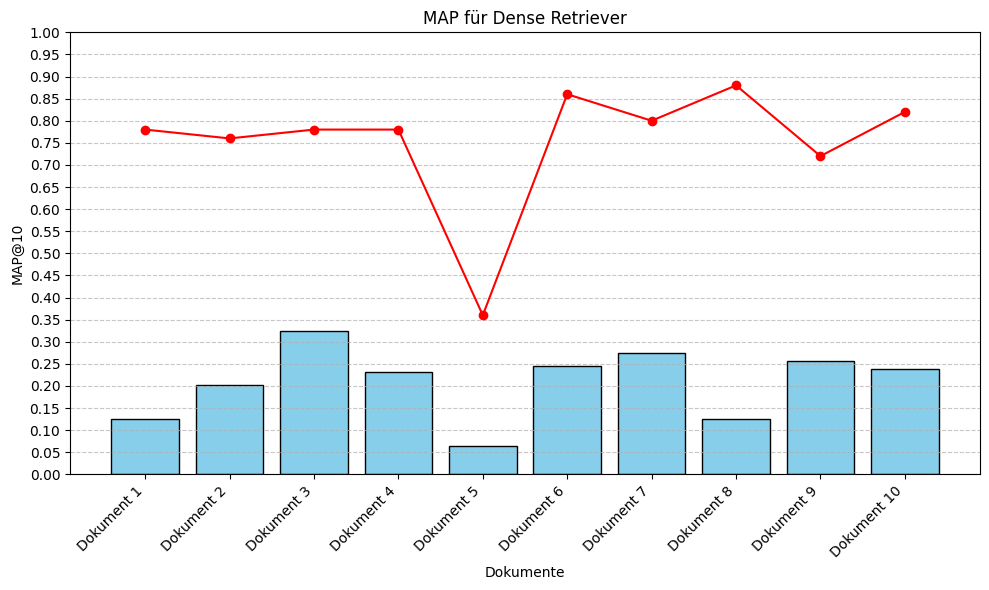

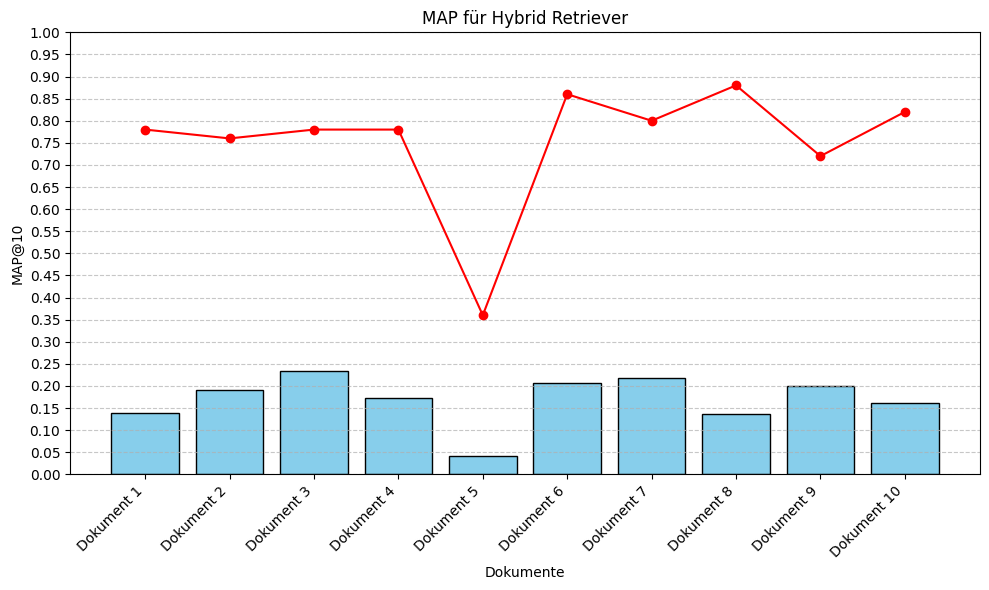

normierter MAP Bm25: [0.26542735 0.33535088 0.3265812  0.27760684 0.065      0.2705814
 0.324125   0.21096591 0.31069444 0.1653252 ]
normierter MAP Dense: [0.16076923 0.26530702 0.41478632 0.29632479 0.17777778 0.28474806
 0.34227083 0.14325758 0.35662037 0.29170732]
normierter MAP Hybrid: [0.17820513 0.25236842 0.30068376 0.22014957 0.11583333 0.24016279
 0.273425   0.15577652 0.27888889 0.19735772]


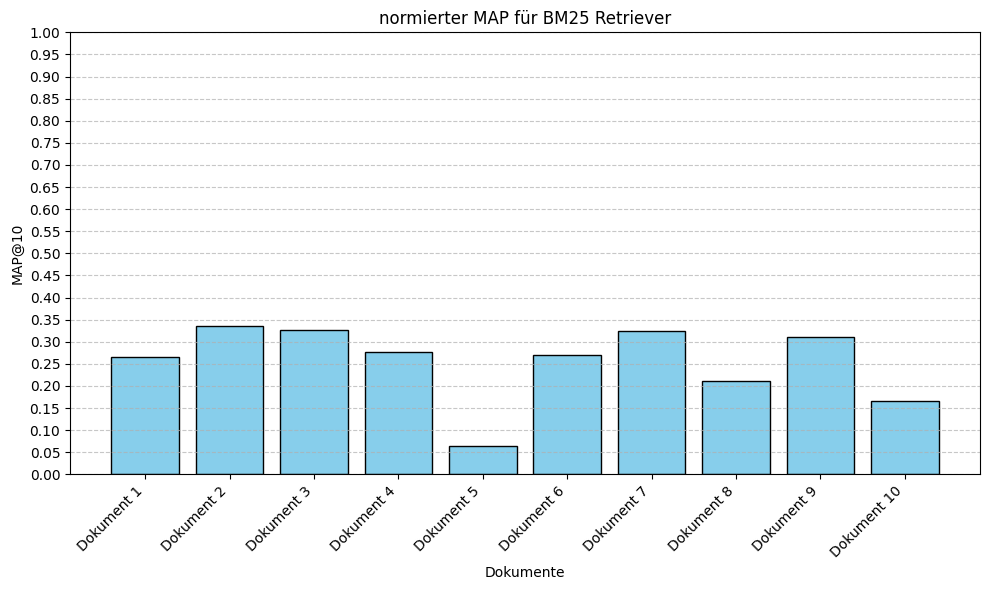

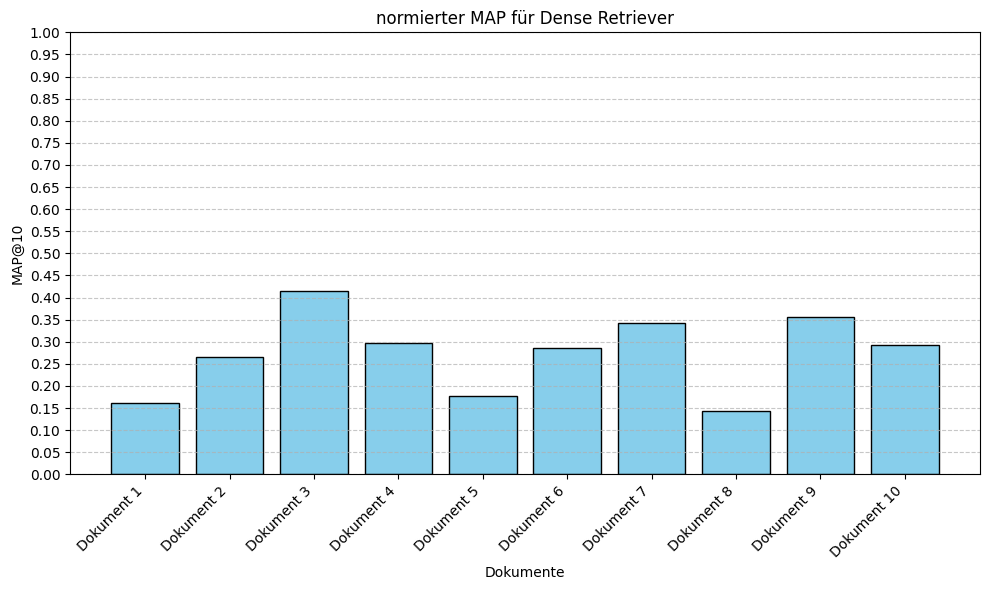

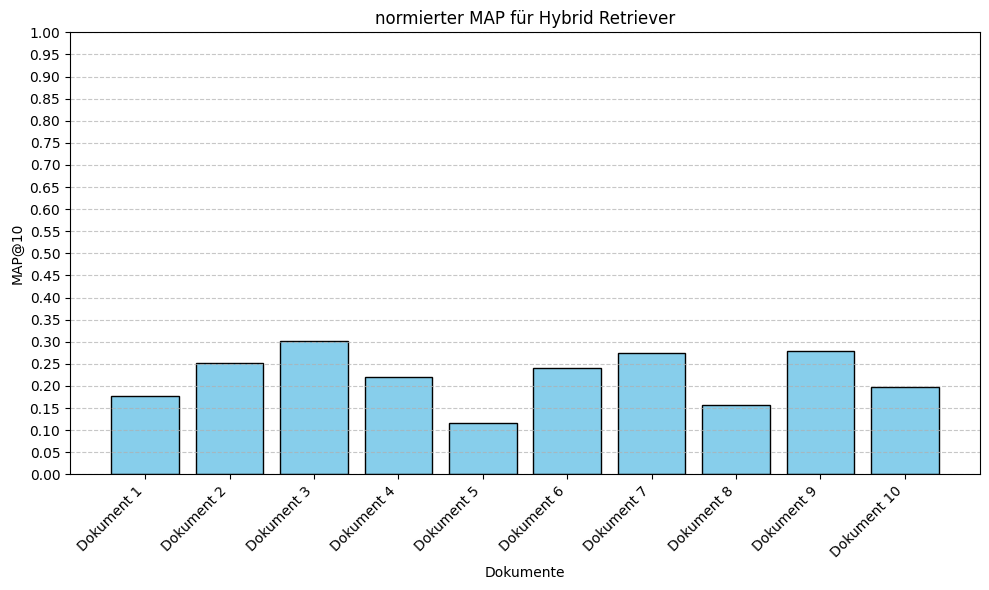

In [65]:
#for i in range (1,k+1):
    #k = i
    #createMapData()

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.07868389 0.18822454 0.15664731 0.13546798 0.11898335 0.14725027
 0.20668718 0.24031456 0.23501399 0.23361909], Dense - F1: [0.         0.1984655  0.23040635 0.25106732 0.27066499 0.28377909
 0.27507598 0.26265439 0.24085713 0.25123585], Hybrid - F1: [0.06513217 0.27510386 0.25935338 0.25456463 0.23433353 0.25564932
 0.26813373 0.28455778 0.26619176 0.25420164]


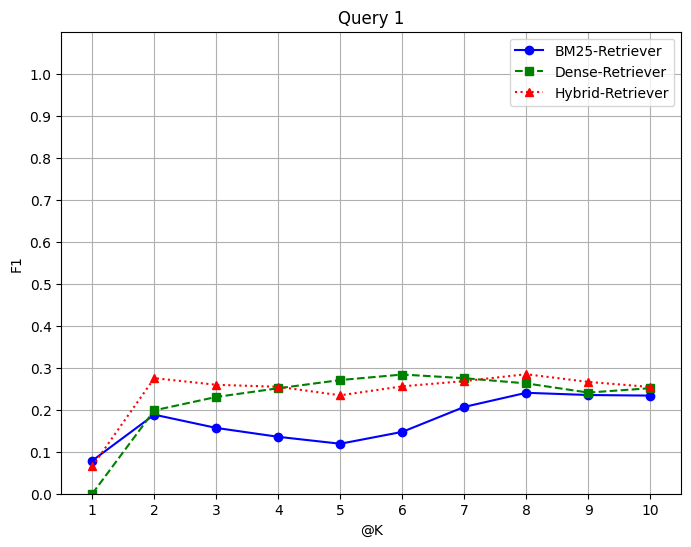

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.07868389 0.18822454 0.15664731 0.13546798 0.11898335 0.12772932
 0.18873502 0.22320541 0.21973621 0.21933337], Dense - F1: [0.11868389 0.1958088  0.22993323 0.20047227 0.2064016  0.18503027
 0.16754229 0.15136571 0.13988972 0.14486862], Hybrid - F1: [0.11201722 0.20081829 0.20875886 0.1680723  0.16736526 0.16049544
 0.19168116 0.19883364 0.18359864 0.18451968]


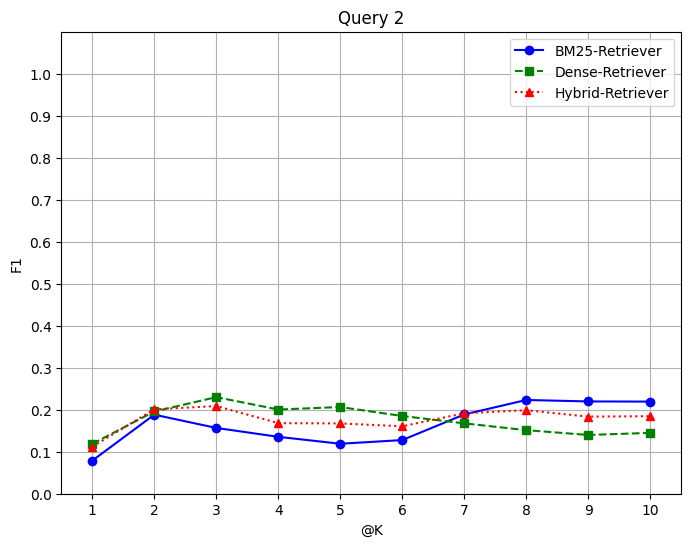

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.11868389 0.13179884 0.14533655 0.16046798 0.15899158 0.1886234
 0.18654641 0.20405388 0.20497852 0.21974168], Dense - F1: [0.11868389 0.1958088  0.16748496 0.17547227 0.15560795 0.13941904
 0.16754229 0.15136571 0.15516749 0.14486862], Hybrid - F1: [0.13924812 0.19924399 0.18415056 0.20316723 0.18527549 0.19061271
 0.18952232 0.19136898 0.18614644 0.18718025]


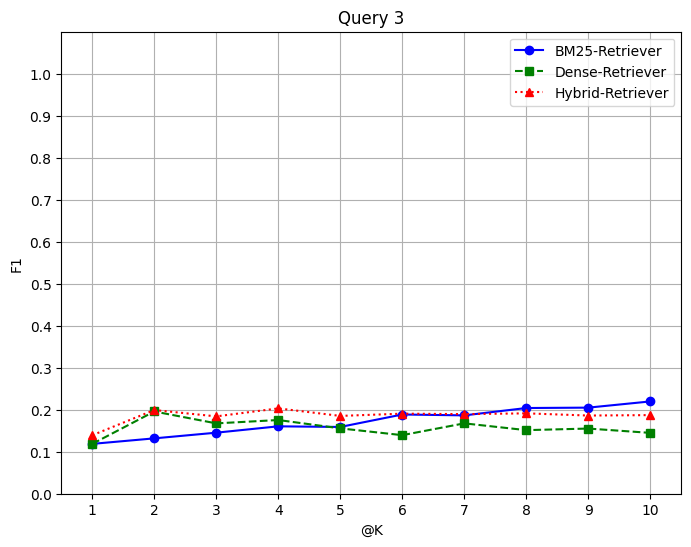

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.12830795 0.25295595 0.21242731 0.1838056  0.16195715 0.18503027
 0.2430229  0.27350691 0.26468044 0.26138791], Dense - F1: [0.16830795 0.13822454 0.11688828 0.13095133 0.11559972 0.1038981
 0.10895843 0.13249375 0.14111194 0.13164603], Hybrid - F1: [0.19153529 0.25144989 0.19627001 0.18447705 0.16148376 0.16902629
 0.20989224 0.2363738  0.23514546 0.21589413]


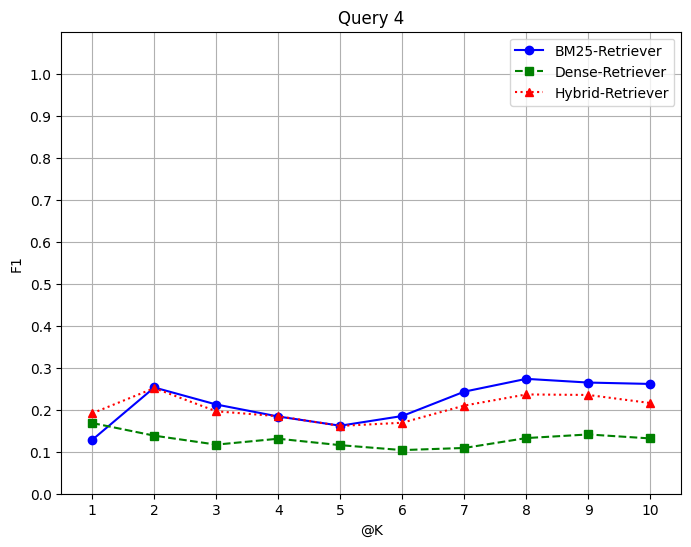

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.08962406 0.07309237 0.11688828 0.2084372  0.20908504 0.20494932
 0.18380731 0.18593697 0.17250376 0.18947846], Dense - F1: [0.11868389 0.0984655  0.13448496 0.16726496 0.22478267 0.20203027
 0.20372747 0.18491229 0.20318291 0.2038711 ], Hybrid - F1: [0.14166386 0.10888828 0.15731398 0.21331742 0.25145804 0.23256652
 0.21153514 0.20736827 0.20920558 0.21736609]


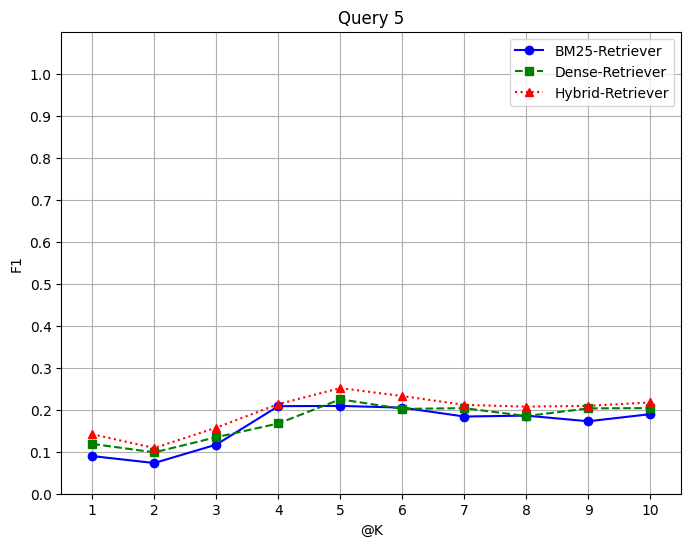

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.04962406 0.12951807 0.10575904 0.11522989 0.12282719 0.13025027
 0.19133234 0.22536064 0.20637907 0.20674078], Dense - F1: [0.08962406 0.17155787 0.20148496 0.20047227 0.17783017 0.15965713
 0.14566729 0.15136571 0.13988972 0.1305829 ], Hybrid - F1: [0.08295739 0.16957143 0.1778167  0.16391711 0.15596114 0.15075742
 0.18948992 0.20003586 0.18349931 0.18451968]


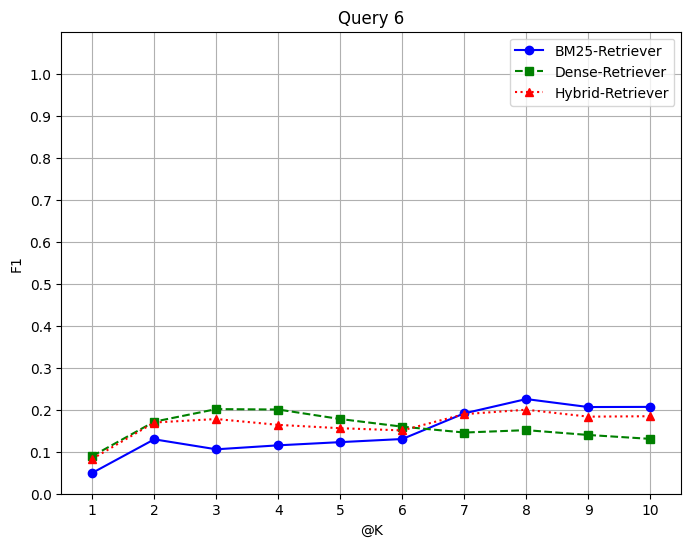

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.0957265  0.07537313 0.08397904 0.13975904 0.14678433 0.13043719
 0.15497507 0.13921933 0.12877614 0.11988905], Dense - F1: [0.11629073 0.08975904 0.07275904 0.0820197  0.07185547 0.06481313
 0.05688941 0.06540311 0.09424335 0.10332931], Hybrid - F1: [0.16513217 0.11535304 0.10938456 0.13222097 0.13326987 0.12198823
 0.13856312 0.13639196 0.12647722 0.1241703 ]


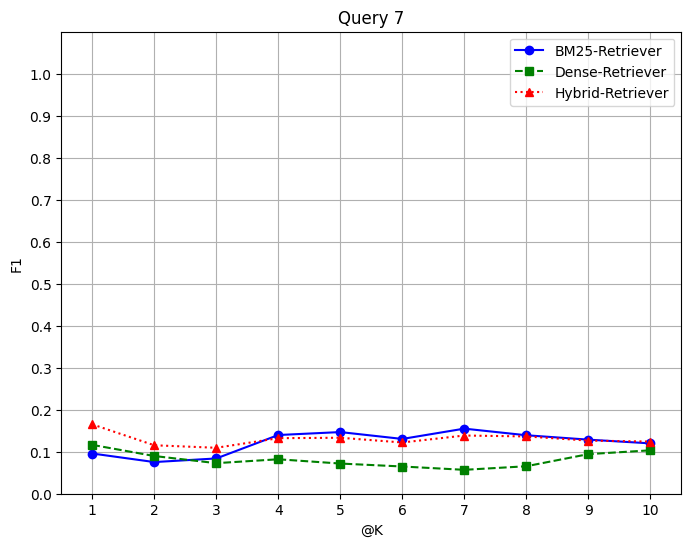

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.07868389 0.10561266 0.16219904 0.13928571 0.16907769 0.1517179
 0.15953939 0.1774752  0.16368723 0.15220921], Dense - F1: [0.11629073 0.17951807 0.16795807 0.14380131 0.16830636 0.19165719
 0.17321154 0.17276592 0.15875877 0.1632884 ], Hybrid - F1: [0.12499719 0.18690476 0.20790285 0.18151329 0.21328666 0.18749368
 0.18358972 0.18867038 0.17158881 0.16390644]


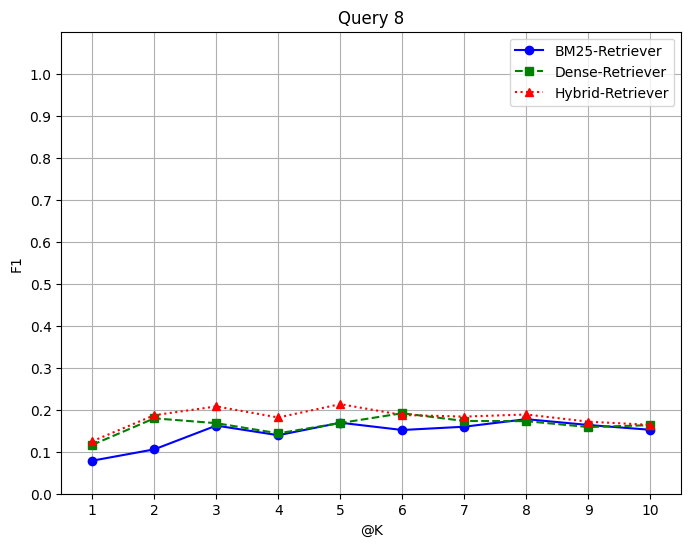

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.04962406 0.03975904 0.05544    0.04868637 0.06107004 0.08081313
 0.07240554 0.06540311 0.07755638 0.07237692], Dense - F1: [0.11629073 0.08975904 0.13495807 0.14868637 0.17535576 0.15581033
 0.1571905  0.14097417 0.14366796 0.15046788], Hybrid - F1: [0.12951807 0.09665559 0.13502286 0.13853437 0.16120087 0.15762284
 0.15102471 0.14085357 0.14368449 0.14296077]


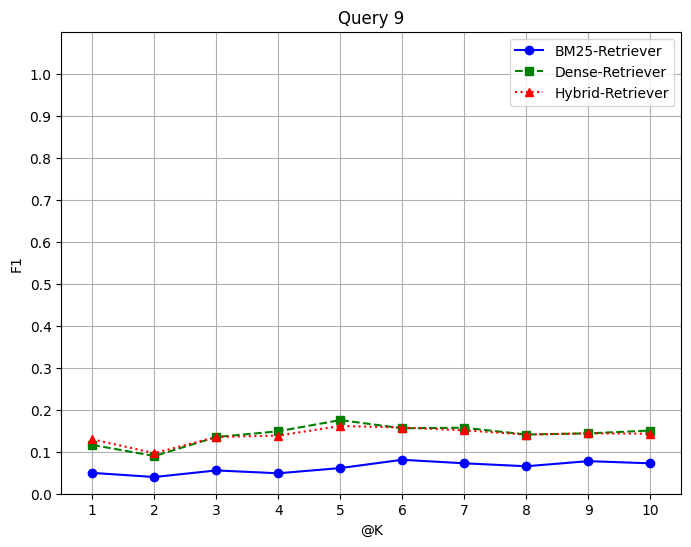

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.04962406 0.03975904 0.05544    0.04868637 0.06107004 0.08081313
 0.07240554 0.06540311 0.07755638 0.07237692], Dense - F1: [0.06666667 0.16513217 0.17471711 0.20154065 0.22614941 0.21842156
 0.19443109 0.18914569 0.17505883 0.16306134], Hybrid - F1: [0.08975904 0.15022702 0.16602604 0.16595581 0.18804948 0.18495198
 0.16639463 0.15997019 0.15918114 0.14448459]


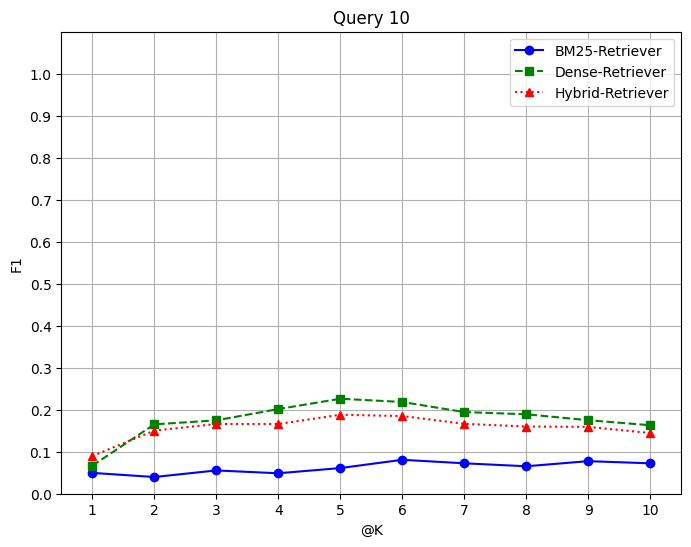

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.07868389 0.06513217 0.08388828 0.1070197  0.15122055 0.13467529
 0.11979937 0.12161933 0.12563517 0.14915006], Dense - F1: [0.13333333 0.13975904 0.17471711 0.16820731 0.22230826 0.19818346
 0.19956861 0.21330771 0.19623354 0.18248339], Hybrid - F1: [0.16513217 0.15885462 0.18379847 0.18557636 0.1905192  0.17071159
 0.16232763 0.17291115 0.16623055 0.16386682]


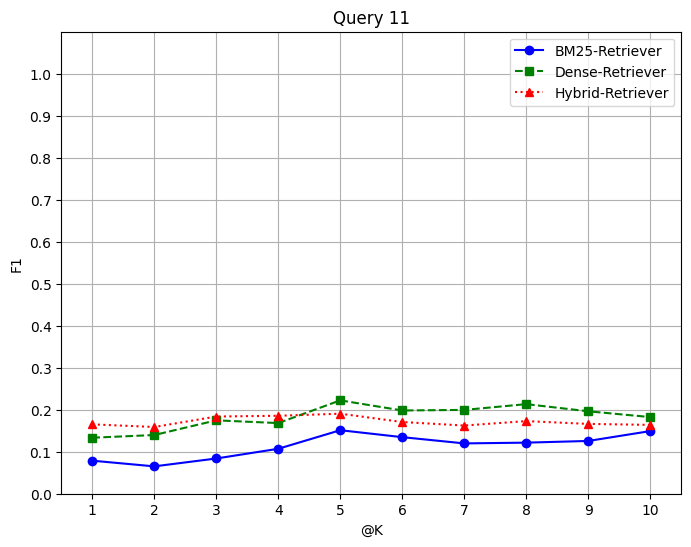

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.13333333 0.1        0.11999856 0.1202381  0.13266409 0.13760842
 0.13753093 0.12337417 0.16170075 0.15046788], Dense - F1: [0.06666667 0.18975904 0.17471711 0.16820731 0.1651654  0.19417063
 0.17134485 0.17153451 0.15894574 0.16626875], Hybrid - F1: [0.15       0.17463301 0.17974459 0.16538847 0.1581129  0.18515925
 0.17641523 0.17295528 0.17173921 0.17266645]


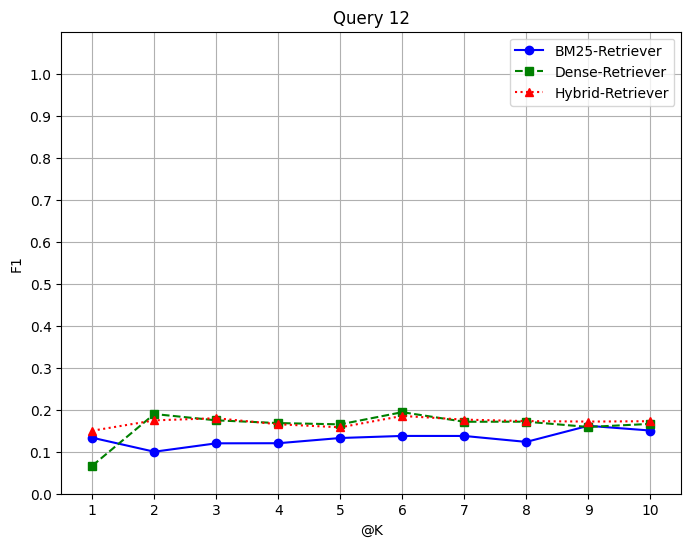

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.05       0.03975904 0.06178161 0.05347709 0.04781313
 0.04153457 0.03695484 0.03453279 0.0320155 ], Dense - F1: [0.         0.         0.03975904 0.06178161 0.08204852 0.12281033
 0.12631953 0.11252589 0.10390893 0.09630122], Hybrid - F1: [0.         0.03333333 0.05394456 0.08544984 0.08914528 0.11080721
 0.10796395 0.10248486 0.09215396 0.08480059]


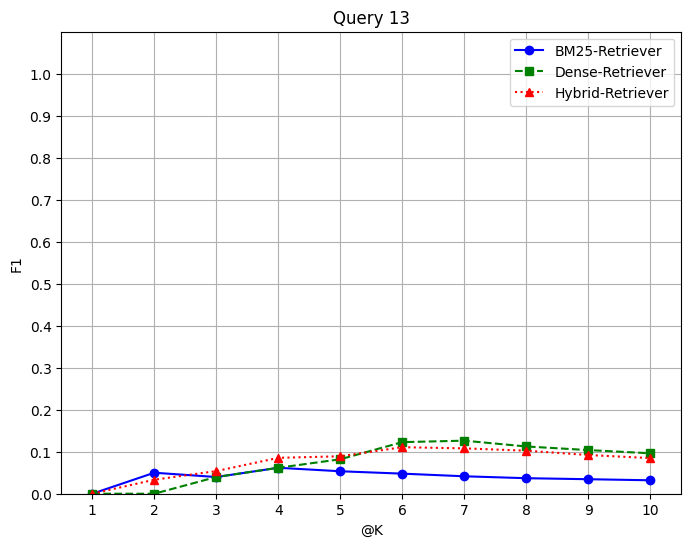

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.1        0.16666667 0.12914213 0.10666667 0.09047619 0.0798061
 0.0683114  0.06013825 0.05588539 0.05151515], Dense - F1: [0.23333333 0.16666667 0.2086602  0.20666667 0.24285714 0.21292295
 0.20614545 0.18170507 0.16765618 0.17121212], Hybrid - F1: [0.23333333 0.19285141 0.19025971 0.18002776 0.16986039 0.14663923
 0.14356205 0.13243825 0.11830675 0.1209701 ]


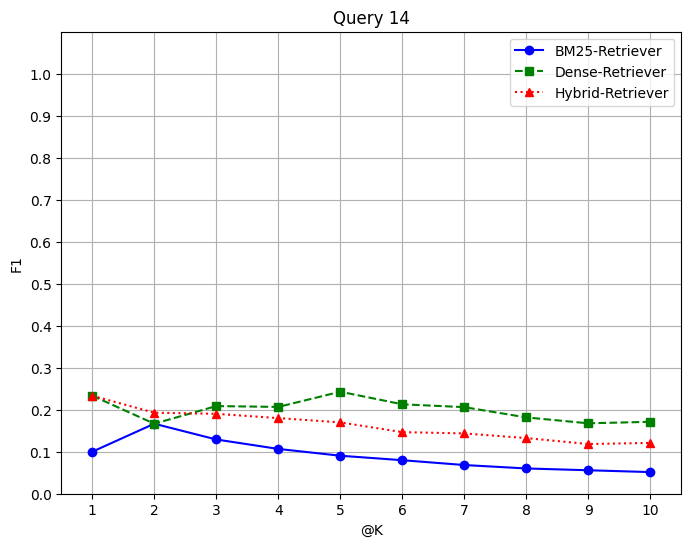

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.28295739 0.2564257  0.25224668 0.24178161 0.2630009  0.23055405
 0.20245486 0.17916682 0.18415618 0.16989429], Dense - F1: [0.23333333 0.16666667 0.2086602  0.17333333 0.18095238 0.18867202
 0.20614545 0.18170507 0.18415618 0.16989429], Hybrid - F1: [0.37309237 0.25990619 0.26569138 0.24888476 0.21519245 0.19425854
 0.19035048 0.1759445  0.16352101 0.14500491]


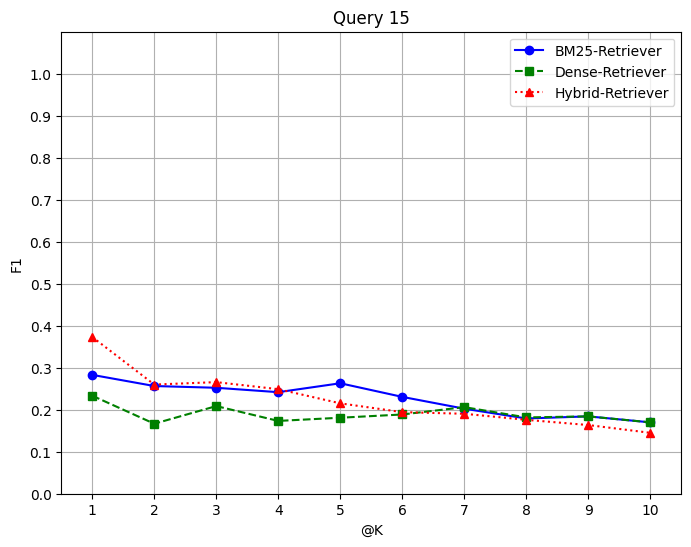

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.3        0.2        0.14887218 0.12       0.1        0.08717949
 0.09555921 0.08364055 0.09731207 0.10606061], Dense - F1: [0.         0.06666667 0.13900716 0.15333333 0.12857143 0.19123651
 0.18816809 0.16571429 0.15141043 0.13939394], Hybrid - F1: [0.2        0.14666667 0.16002442 0.13025814 0.1020244  0.12000774
 0.12581187 0.10817692 0.11134523 0.10788382]


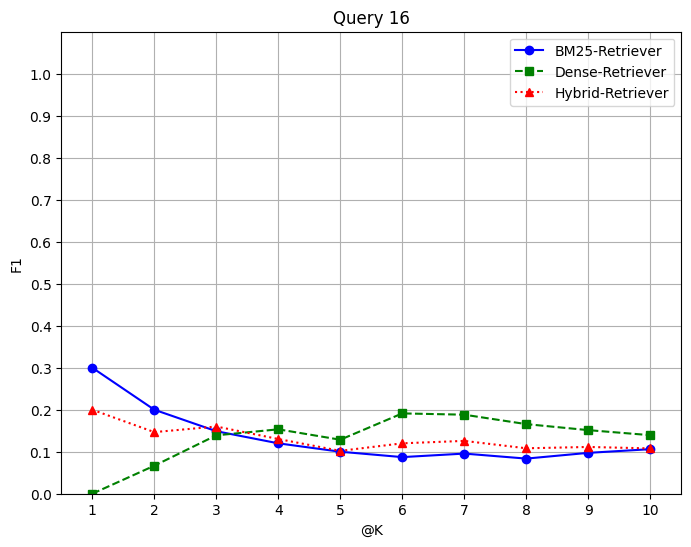

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.         0.         0.         0.         0.02905983
 0.0245614  0.02142857 0.01981982 0.01818182], Dense - F1: [0.         0.         0.         0.         0.         0.08717949
 0.07368421 0.08571429 0.07927928 0.08939394], Hybrid - F1: [0.         0.         0.         0.         0.         0.0643561
 0.0592275  0.06362455 0.05836713 0.06210079]


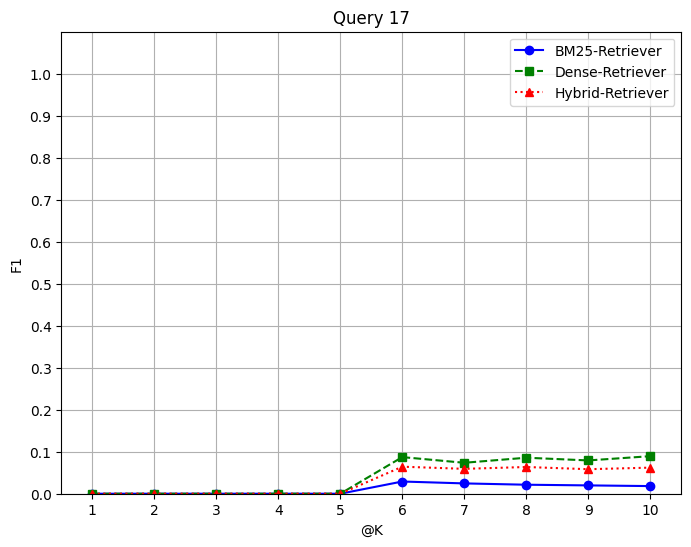

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.05       0.03975904 0.03333333 0.06190476 0.05443296
 0.0464364  0.04078341 0.05767243 0.0530303 ], Dense - F1: [0.         0.05       0.03975904 0.06666667 0.11904762 0.10405702
 0.11448388 0.10142857 0.09195097 0.08484848], Hybrid - F1: [0.         0.05       0.03333333 0.04792627 0.108984   0.09398063
 0.09756994 0.08350249 0.07564733 0.07075607]


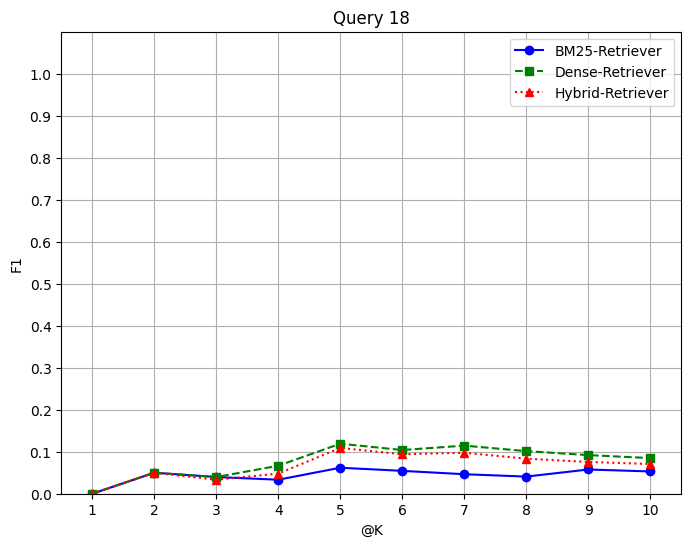

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.16666667 0.21666667 0.16962262 0.17333333 0.14761905 0.12943016
 0.13635888 0.12078341 0.10998375 0.10151515], Dense - F1: [0.         0.15       0.11927711 0.1        0.14285714 0.15368108
 0.13635888 0.12078341 0.12801654 0.11818182], Hybrid - F1: [0.11666667 0.20357285 0.15443296 0.13642577 0.13811439 0.12202363
 0.10771645 0.094523   0.08847202 0.08050266]


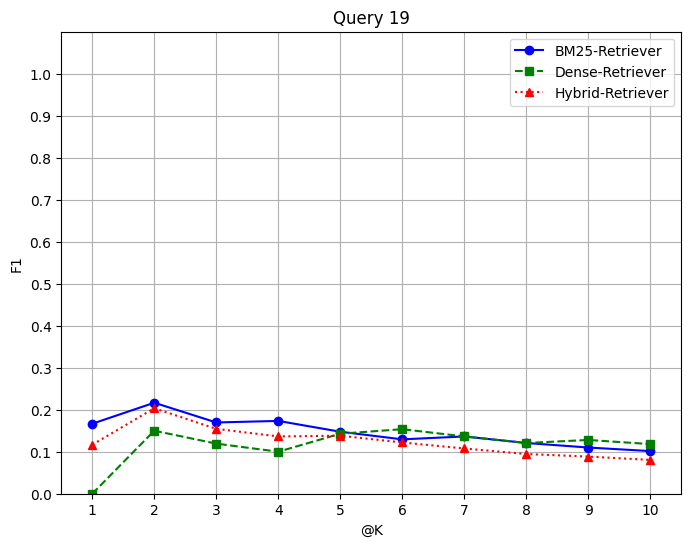

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.06666667 0.05       0.07951807 0.06666667 0.05714286 0.10517923
 0.0901864  0.07949309 0.093738   0.08636364], Dense - F1: [0.1        0.11666667 0.12914213 0.10666667 0.14761905 0.12830795
 0.13904529 0.12285714 0.14962339 0.13787879], Hybrid - F1: [0.11666667 0.10666667 0.10725532 0.08330357 0.09588539 0.10010272
 0.10299104 0.09235354 0.10806808 0.10001134]


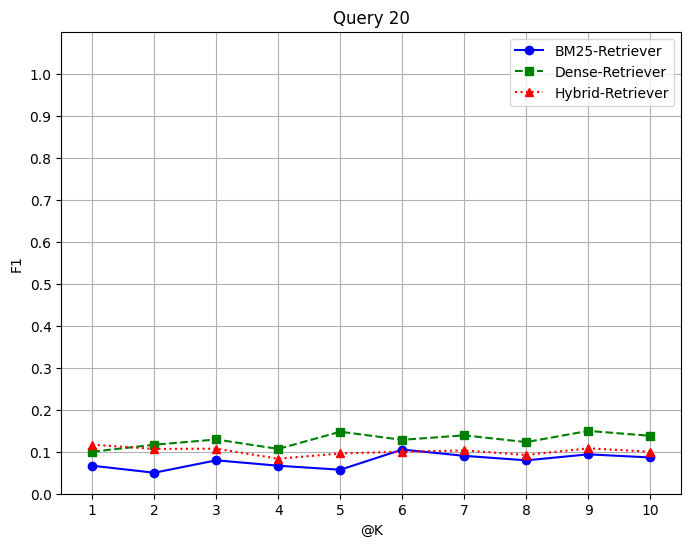

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.16666667 0.18333333 0.13900716 0.11333333 0.0952381  0.08349279
 0.07099781 0.06221198 0.07570521 0.06969697], Dense - F1: [0.         0.16666667 0.12914213 0.10666667 0.09047619 0.15736778
 0.13904529 0.12285714 0.11177079 0.1030303 ], Hybrid - F1: [0.11666667 0.18258145 0.12537313 0.09834921 0.08428901 0.10618444
 0.09571253 0.08647536 0.08927543 0.08110913]


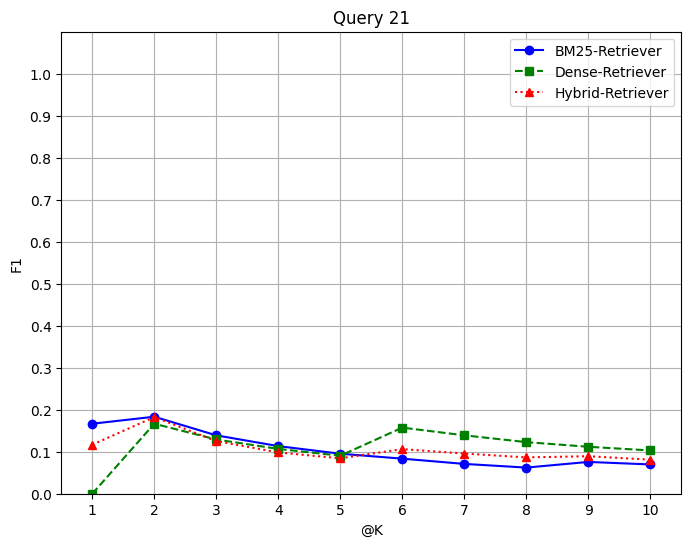

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.0245614  0.04724813 0.06291917 0.05694696 0.06619512 0.07960649
 0.09029803 0.11299866 0.14355094 0.13545744], Dense - F1: [0.         0.         0.01965957 0.05117521 0.04713472 0.04406682
 0.08826118 0.09702242 0.14126963 0.13341125], Hybrid - F1: [0.021875   0.04038872 0.05200157 0.07581113 0.06862945 0.07409727
 0.10333515 0.12691434 0.16279308 0.15423851]


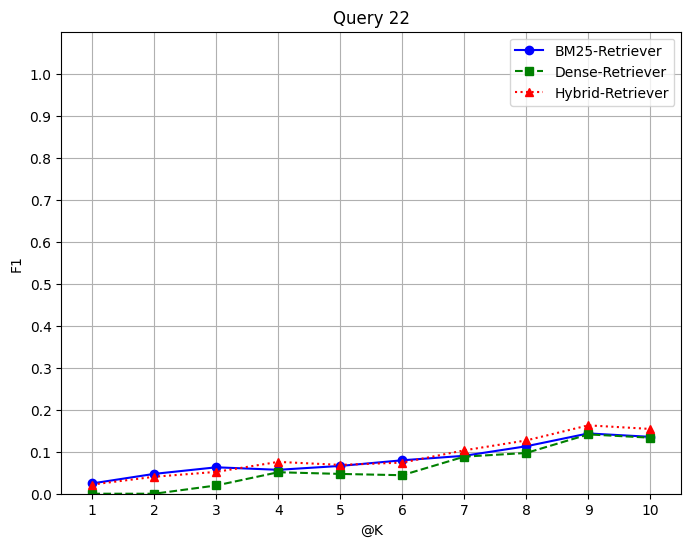

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.01981982 0.04340592 0.0780036  0.08630952 0.0793374  0.07375904
 0.08205178 0.10469304 0.1229703  0.12974315], Dense - F1: [0.         0.         0.01965957 0.04017094 0.03647059 0.06762772
 0.10676862 0.09816831 0.12265094 0.12709342], Hybrid - F1: [0.01803279 0.03771778 0.0797271  0.10088259 0.08785468 0.10709317
 0.11368774 0.12575668 0.15434079 0.16408691]


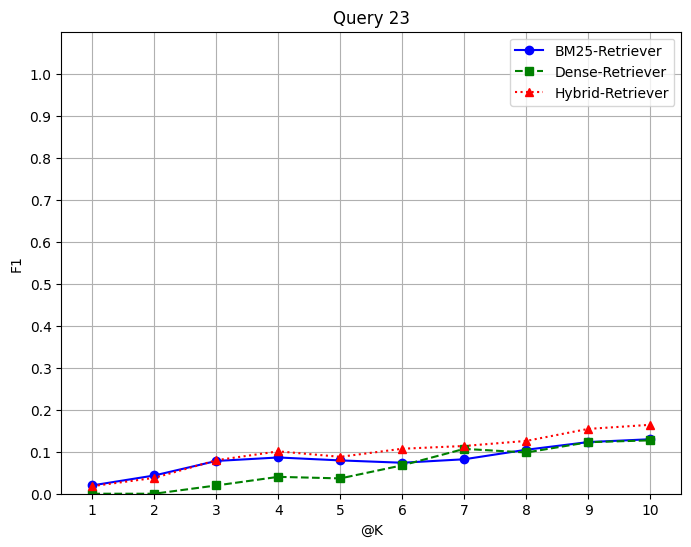

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.04887965 0.06528092 0.07522317 0.06874237 0.06323606 0.09413322
 0.10335247 0.13729487 0.14185134 0.15699735], Dense - F1: [0.05151515 0.11371731 0.10131973 0.11219475 0.151508   0.13962032
 0.15865782 0.17822645 0.20149745 0.20212936], Hybrid - F1: [0.08864402 0.15218114 0.14072009 0.13987077 0.15761328 0.16438495
 0.17995734 0.20583439 0.22229054 0.22684981]


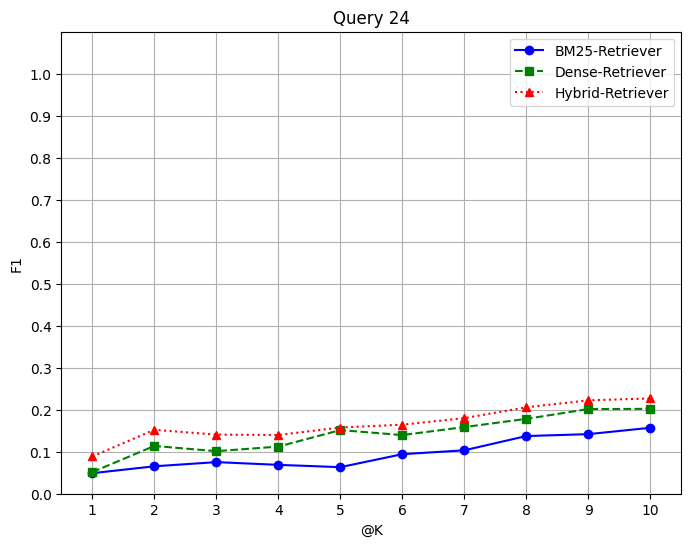

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.07771456 0.13514588 0.13559496 0.13989316 0.18728151 0.1831785
 0.18051794 0.16502445 0.16460449 0.16698129], Dense - F1: [0.18484848 0.20439099 0.21996735 0.21242315 0.19037995 0.24054195
 0.23120303 0.25057774 0.25977643 0.2964916 ], Hybrid - F1: [0.20895541 0.21708689 0.22717694 0.22402363 0.2262142  0.26302287
 0.26037562 0.26039134 0.25756238 0.26017274]


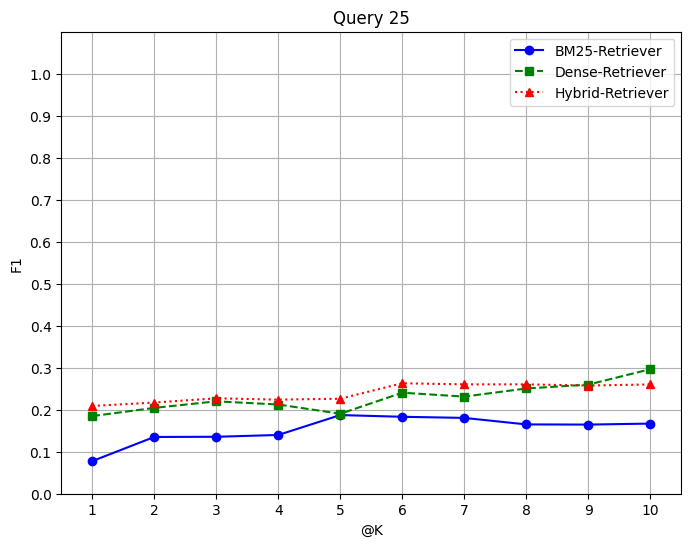

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.02857143 0.02490566 0.04444444 0.06       0.07292383
 0.08303993 0.07653846 0.07096774 0.06666667], Dense - F1: [0.08484848 0.11721545 0.12375973 0.16822363 0.17064779 0.16971939
 0.15865782 0.17268449 0.18410846 0.20295146], Hybrid - F1: [0.07380952 0.11646825 0.11396309 0.14199243 0.15302893 0.14832823
 0.14754227 0.15385002 0.15745049 0.16937716]


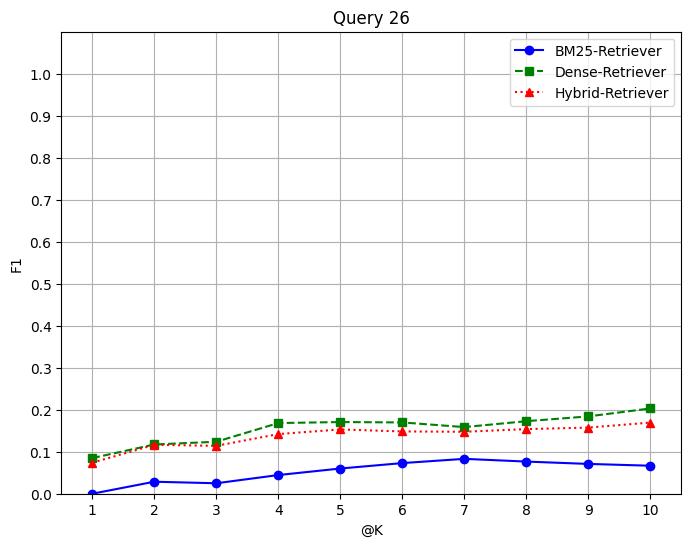

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.21629073 0.27309237 0.30114929 0.24844828 0.23580774 0.23289202
 0.22474962 0.19876327 0.18274699 0.16868339], Dense - F1: [0.06666667 0.1        0.16890117 0.28178161 0.23919137 0.21111202
 0.22622478 0.19954668 0.20103449 0.18554779], Hybrid - F1: [0.2064257  0.23092374 0.24016818 0.23580731 0.20047867 0.16961032
 0.18238391 0.16790394 0.15381939 0.13803391]


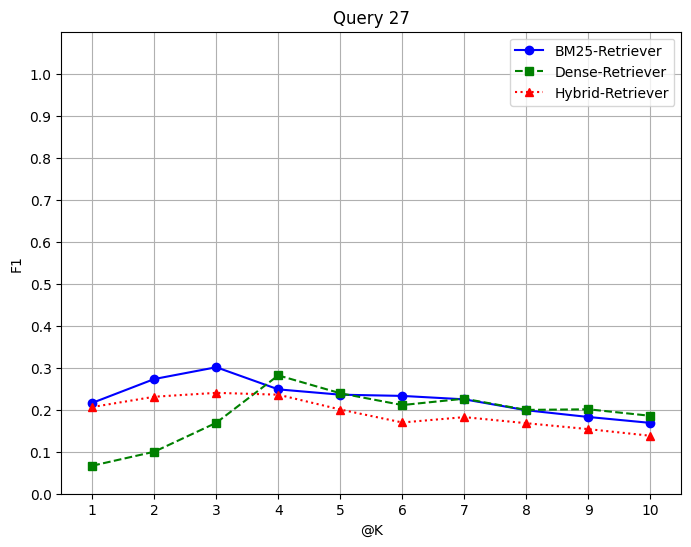

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.21629073 0.27309237 0.30114929 0.24844828 0.21061995 0.18573889
 0.18353019 0.1613788  0.14987764 0.15353187], Dense - F1: [0.14962406 0.22309237 0.17200716 0.17511494 0.18204852 0.18573889
 0.17978838 0.15876327 0.14668142 0.13535005], Hybrid - F1: [0.19962406 0.26262406 0.25992727 0.20536435 0.18926568 0.1787939
 0.16879467 0.15027298 0.14057005 0.14210798]


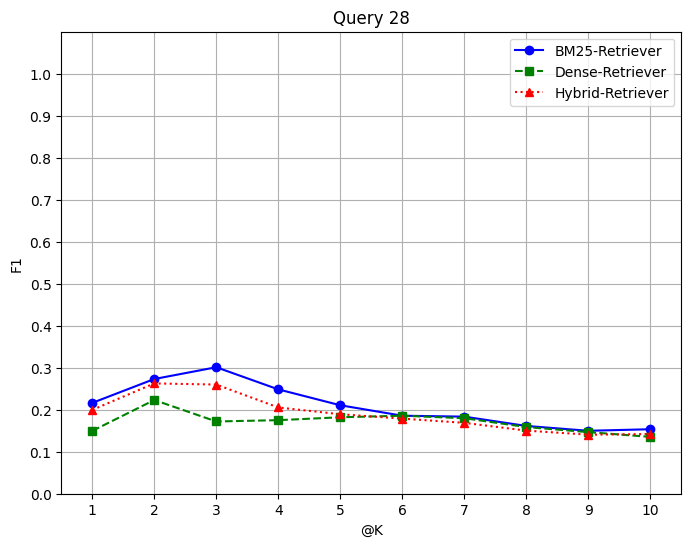

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.11629073 0.2064257  0.20190117 0.24178161 0.20585804 0.20998982
 0.18205503 0.16059539 0.1647142  0.15201672], Dense - F1: [0.16666667 0.16666667 0.17876619 0.17511494 0.20247441 0.20270999
 0.20287462 0.17940844 0.1647142  0.15201672], Hybrid - F1: [0.2064257  0.22449804 0.21211106 0.22939831 0.18976125 0.18038766
 0.15825931 0.14187426 0.13588035 0.13092934]


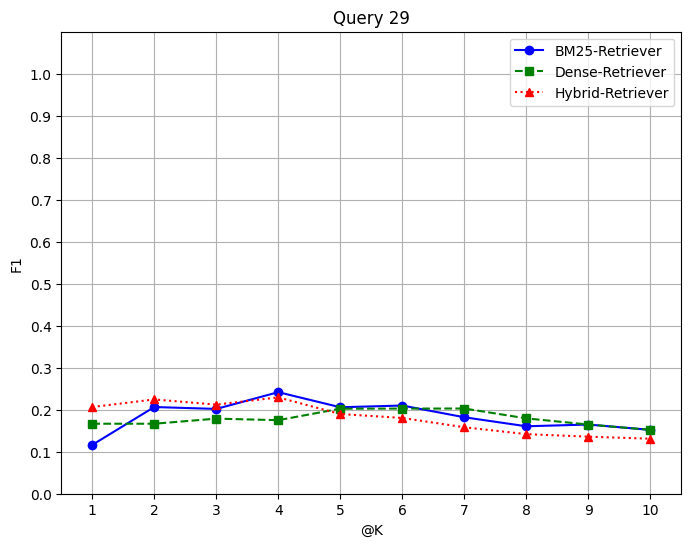

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.         0.         0.         0.         0.
 0.         0.02142857 0.01981982 0.03484848], Dense - F1: [0.         0.         0.04962406 0.04       0.06666667 0.05811966
 0.04912281 0.04285714 0.05767243 0.0530303 ], Hybrid - F1: [0.         0.         0.02905983 0.02142857 0.03800164 0.03299663
 0.02789893 0.02789893 0.03668557 0.03668557]


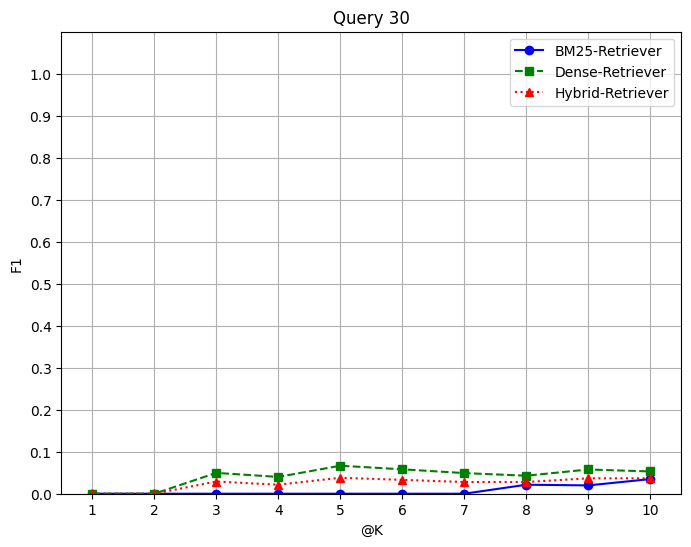

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.06666667 0.05       0.03975904 0.03333333 0.02857143 0.07318627
 0.08422917 0.07512272 0.06918917 0.06413793], Dense - F1: [0.06666667 0.05       0.03975904 0.09511494 0.08204852 0.07318627
 0.06340957 0.05630968 0.05256557 0.04868217], Hybrid - F1: [0.1        0.06666667 0.04962406 0.08649581 0.07192041 0.0638901
 0.07113009 0.063921   0.05822147 0.05230911]


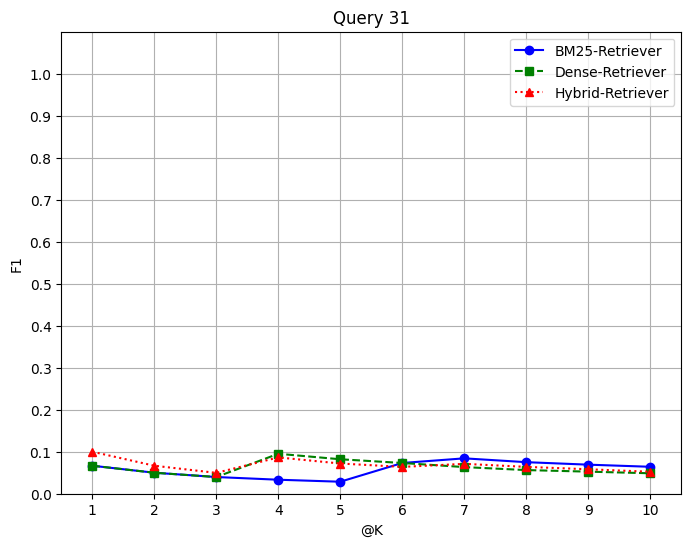

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.05       0.03975904 0.07333333 0.06190476 0.0798061
 0.0683114  0.06013825 0.05588539 0.06818182], Dense - F1: [0.         0.         0.         0.         0.02857143 0.05074627
 0.04375    0.03870968 0.03606557 0.03333333], Hybrid - F1: [0.         0.03333333 0.02857143 0.0464364  0.0588162  0.08338975
 0.07292198 0.06545002 0.0606405  0.06328343]


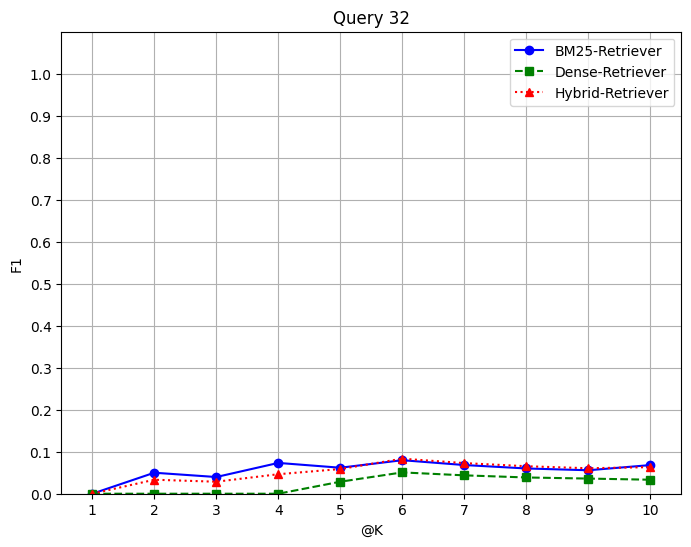

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.08975904 0.10675904 0.09059829 0.10723632 0.11921719
 0.13187681 0.11719645 0.12354224 0.11433566], Dense - F1: [0.11629073 0.33975904 0.31101431 0.28844828 0.27728661 0.26810947
 0.25199742 0.22226558 0.20435384 0.18838036], Hybrid - F1: [0.08975904 0.27726496 0.25389718 0.21490963 0.22318647 0.20016964
 0.17736288 0.15919219 0.15345699 0.14363206]


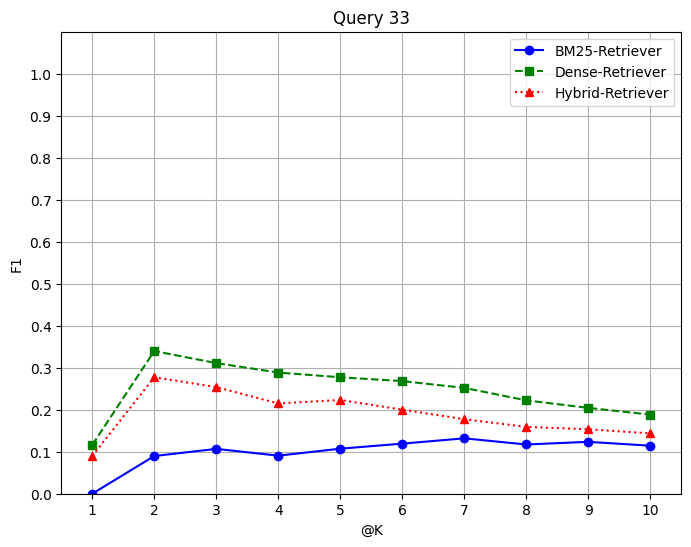

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.33333333 0.32309237 0.29200571 0.27511494 0.2677628  0.23424074
 0.25052226 0.22148217 0.20256681 0.1868652 ], Dense - F1: [0.1        0.06666667 0.04962406 0.08       0.06666667 0.05811966
 0.09824561 0.10506912 0.11534485 0.12140944], Hybrid - F1: [0.3        0.25807234 0.21853682 0.20352388 0.16947537 0.14744669
 0.19609934 0.17449487 0.17339906 0.16038794]


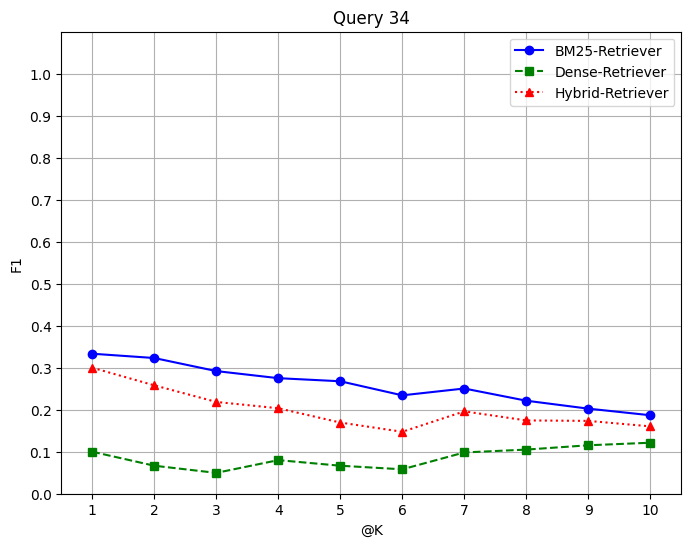

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.11629073 0.08975904 0.11251807 0.12844828 0.14395328 0.12761923
 0.10984598 0.11852166 0.110238   0.11989429], Dense - F1: [0.1        0.06666667 0.04962406 0.04       0.03333333 0.02905983
 0.04912281 0.06221198 0.09552503 0.10606061], Hybrid - F1: [0.1564257  0.10178161 0.11587025 0.11088941 0.11107609 0.09657676
 0.10161429 0.09535342 0.11726931 0.11943382]


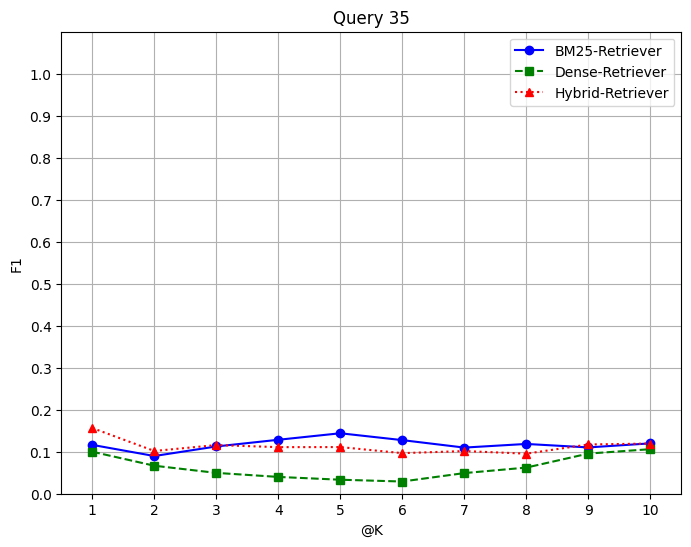

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.1        0.06666667 0.04962406 0.04       0.05555556 0.07173792
 0.0621697  0.07459963 0.08766317 0.11327213], Dense - F1: [0.         0.06666667 0.04962406 0.04       0.03333333 0.02905983
 0.0245614  0.05699963 0.08822798 0.09588745], Hybrid - F1: [0.06666667 0.08962406 0.06239316 0.04598997 0.05327942 0.05991271
 0.05289819 0.07959864 0.07357877 0.09945049]


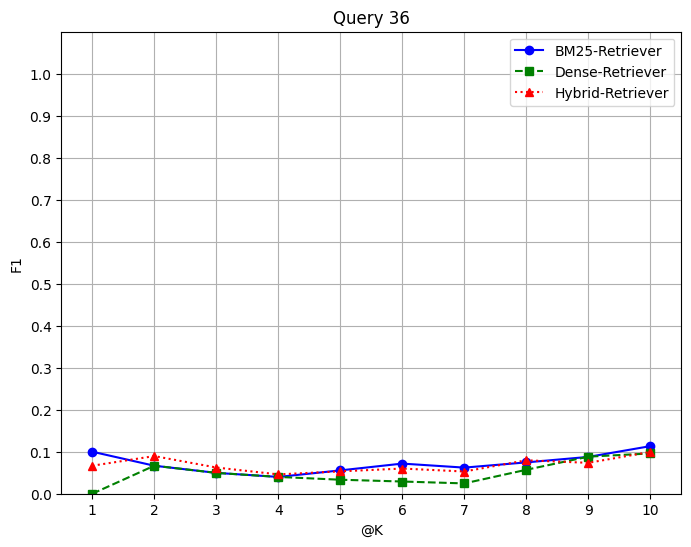

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.         0.04962406 0.10178161 0.08681042 0.07687296
 0.06609598 0.07719645 0.08625398 0.0799388 ], Dense - F1: [0.10666667 0.37309237 0.29055998 0.26893162 0.26279187 0.30427538
 0.26683129 0.25335322 0.25018718 0.24790416], Hybrid - F1: [0.08333333 0.24011494 0.18802865 0.19596254 0.18251387 0.20496008
 0.18446398 0.18353215 0.17716776 0.17116387]


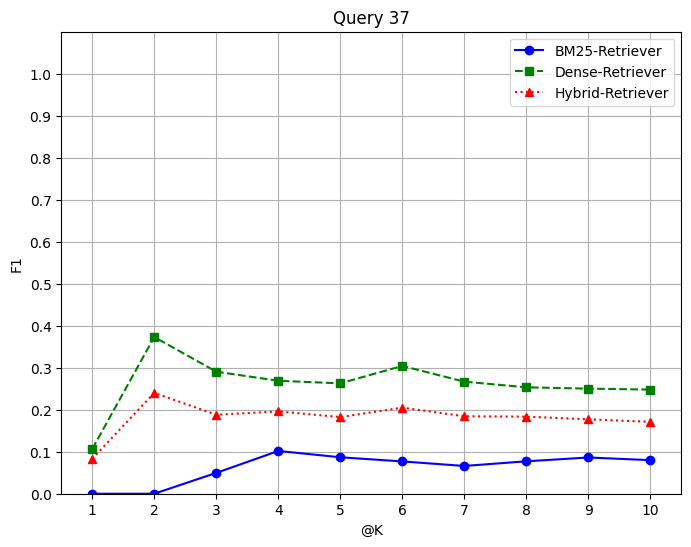

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.         0.         0.         0.         0.02244
 0.01965957 0.0176     0.0165     0.01534884], Dense - F1: [0.         0.         0.         0.04       0.03333333 0.02905983
 0.0245614  0.02142857 0.01981982 0.03484848], Hybrid - F1: [0.         0.         0.         0.02142857 0.01981982 0.03065662
 0.02769286 0.02463411 0.0214746  0.03071925]


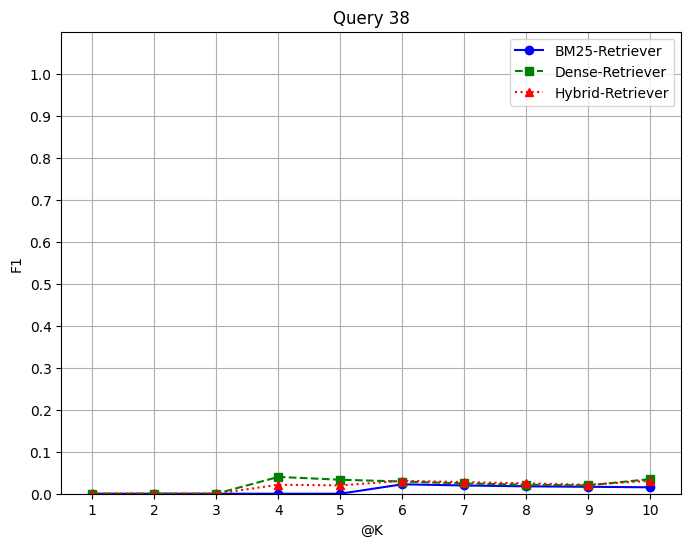

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.         0.         0.03333333 0.02857143 0.02537313
 0.021875   0.01935484 0.01803279 0.03333333], Dense - F1: [0.1        0.11666667 0.0893831  0.07333333 0.06190476 0.05443296
 0.0464364  0.04078341 0.03785261 0.05151515], Hybrid - F1: [0.06666667 0.07975904 0.05763126 0.06517857 0.05424739 0.04843467
 0.04240102 0.03764552 0.03274933 0.0507722 ]


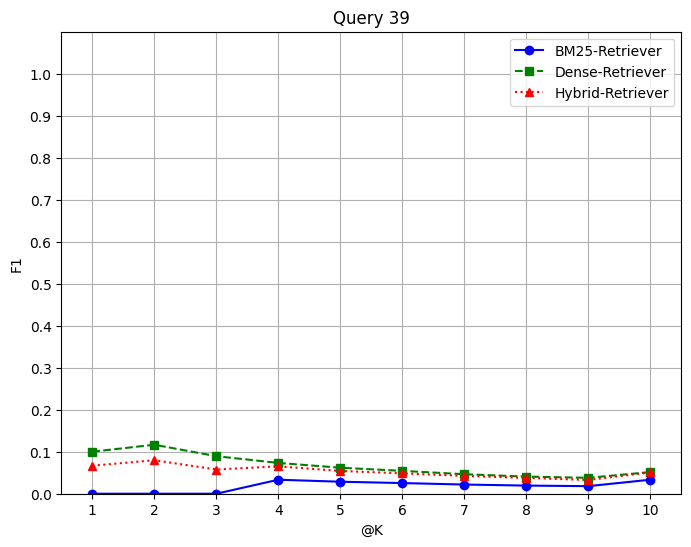

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.06666667 0.05       0.03975904 0.03333333 0.02857143 0.05074627
 0.04375    0.03870968 0.03606557 0.05      ], Dense - F1: [0.06666667 0.05       0.07951807 0.06666667 0.05714286 0.07499719
 0.09139764 0.08078341 0.07391818 0.08484848], Hybrid - F1: [0.1        0.06666667 0.08251599 0.06431608 0.05273224 0.07623497
 0.07925628 0.07131464 0.06484985 0.07235972]


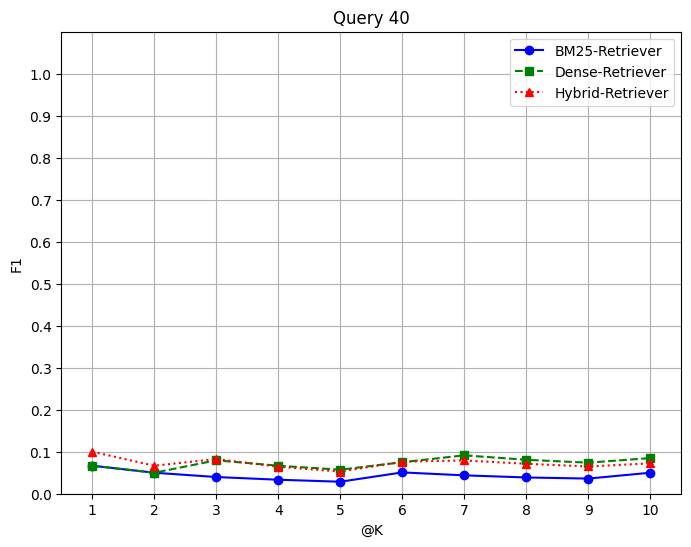

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.06666667 0.1        0.07951807 0.10666667 0.09047619 0.0798061
 0.0683114  0.06013825 0.07391818 0.08636364], Dense - F1: [0.         0.         0.         0.         0.02857143 0.02537313
 0.0683114  0.06013825 0.05588539 0.05151515], Hybrid - F1: [0.05       0.06666667 0.05394456 0.06928938 0.05972761 0.05112284
 0.0636402  0.05765526 0.05446342 0.05948361]


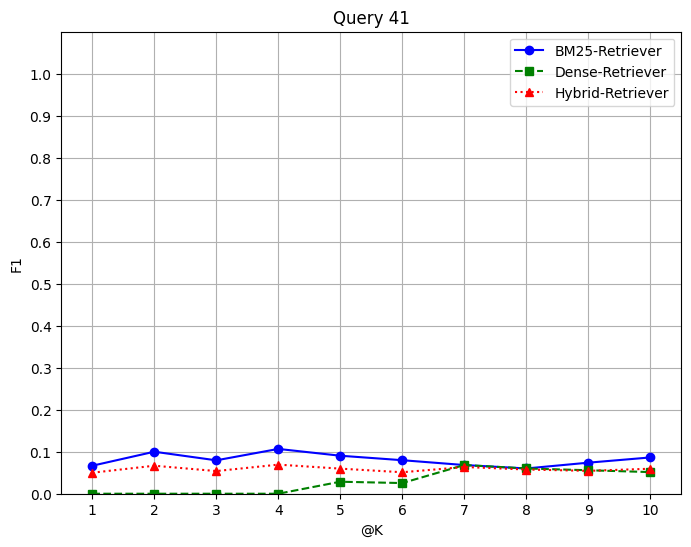

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.05       0.03975904 0.03333333 0.02857143 0.02537313
 0.04375    0.03870968 0.03606557 0.03333333], Dense - F1: [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.01666667], Hybrid - F1: [0.         0.03333333 0.02537313 0.01935484 0.01666667 0.0137931
 0.0245614  0.02142857 0.02142857 0.02891073]


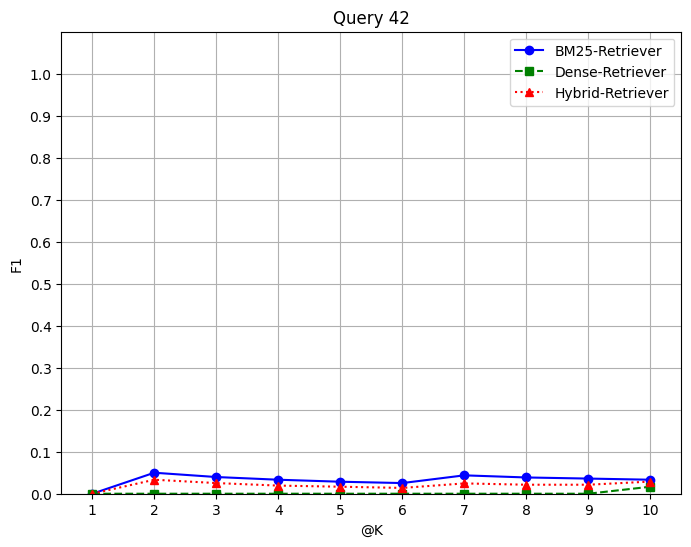

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.16666667 0.31666667 0.27852777 0.23178161 0.22014376 0.21742975
 0.21035553 0.18720315 0.19098196 0.17688937], Dense - F1: [0.14       0.38975904 0.33616113 0.28178161 0.24236598 0.23475166
 0.20658866 0.18501636 0.18688114 0.19000503], Hybrid - F1: [0.21666667 0.32970036 0.29337741 0.23604514 0.21490959 0.21349106
 0.19186859 0.17395813 0.1593271  0.1483531 ]


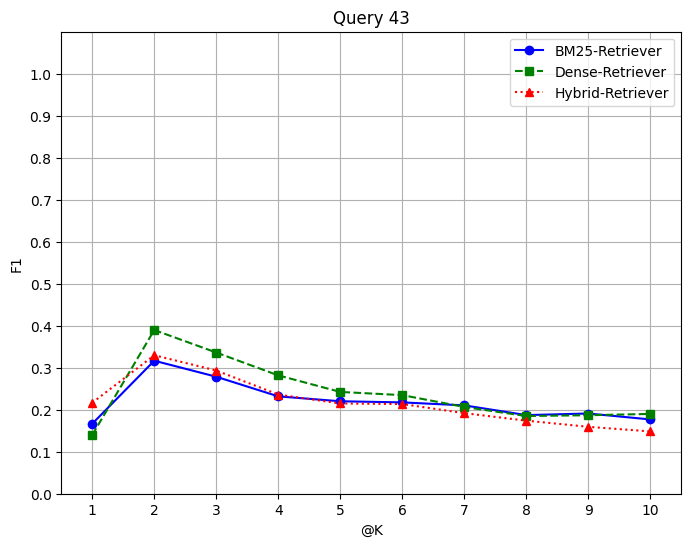

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.         0.         0.         0.         0.
 0.01794872 0.01621622 0.01527778 0.01428571], Dense - F1: [0.         0.05       0.03975904 0.05833333 0.07569931 0.06805123
 0.05948329 0.05317105 0.04981056 0.06058693], Hybrid - F1: [0.         0.03975904 0.02857143 0.03982372 0.05317105 0.04898939
 0.05625793 0.04854615 0.04444562 0.04990039]


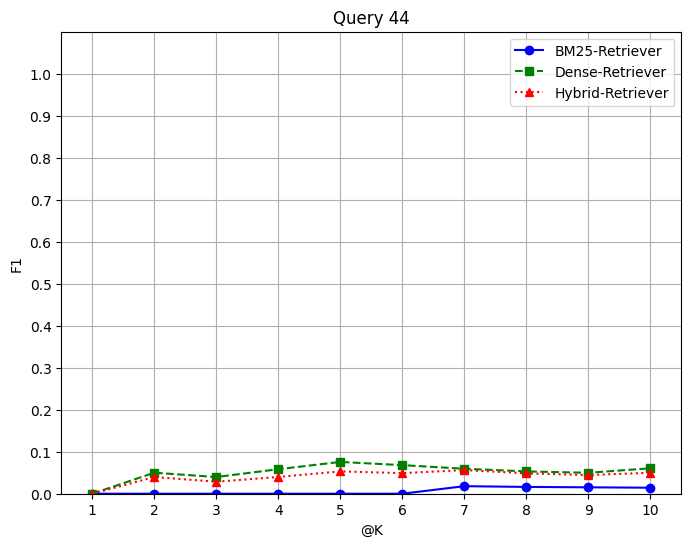

1
2
3
4
5
6
7
8
9
10
BM - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - F1: [0.         0.         0.         0.         0.         0.
 0.         0.01935484 0.01803279 0.01666667], Hybrid - F1: [0.         0.         0.         0.         0.         0.
 0.         0.0137931  0.0122807  0.01071429]


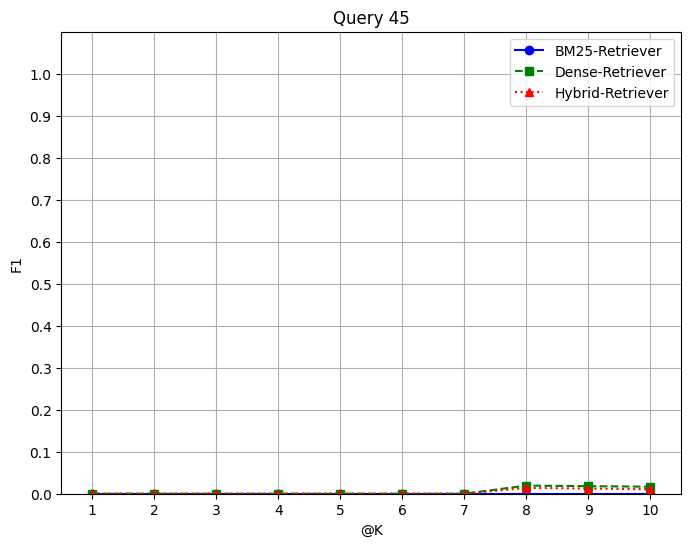

1
2
3
4
5
6
7
8
9
10
BM - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


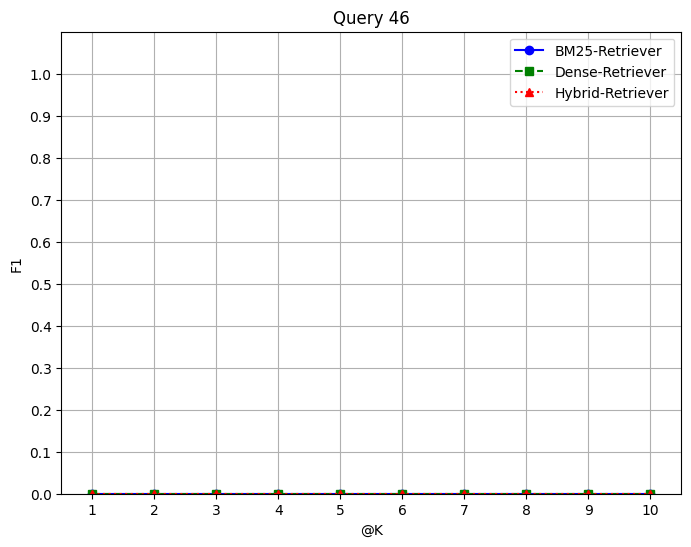

1
2
3
4
5
6
7
8
9
10
BM - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


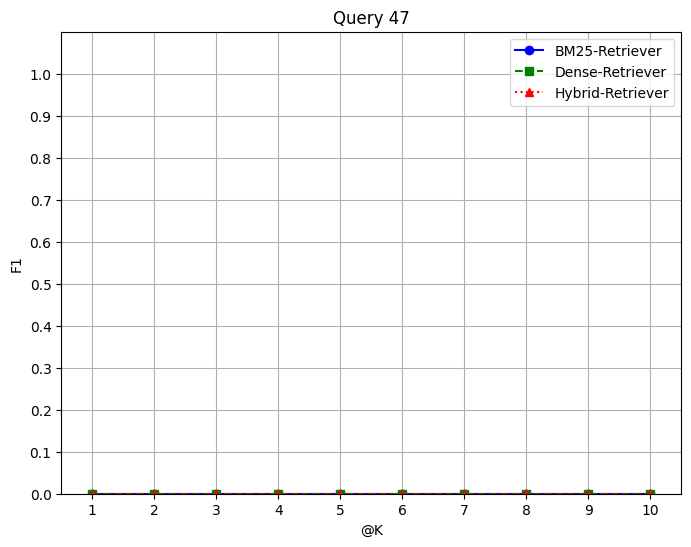

1
2
3
4
5
6
7
8
9
10
BM - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


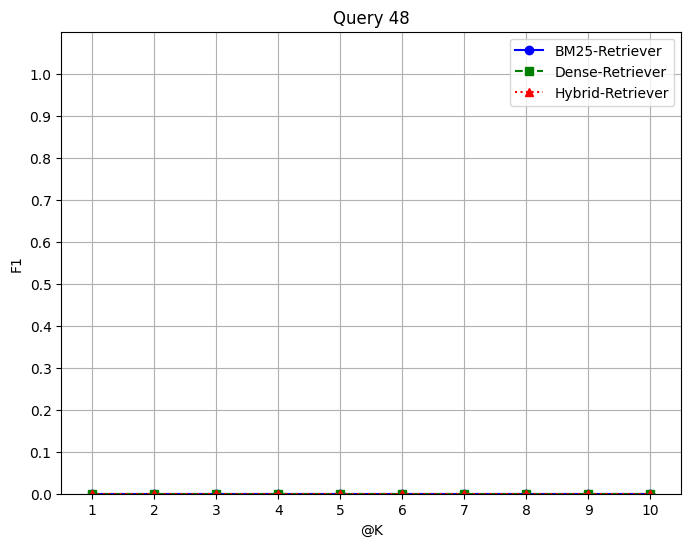

1
2
3
4
5
6
7
8
9
10
BM - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - F1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


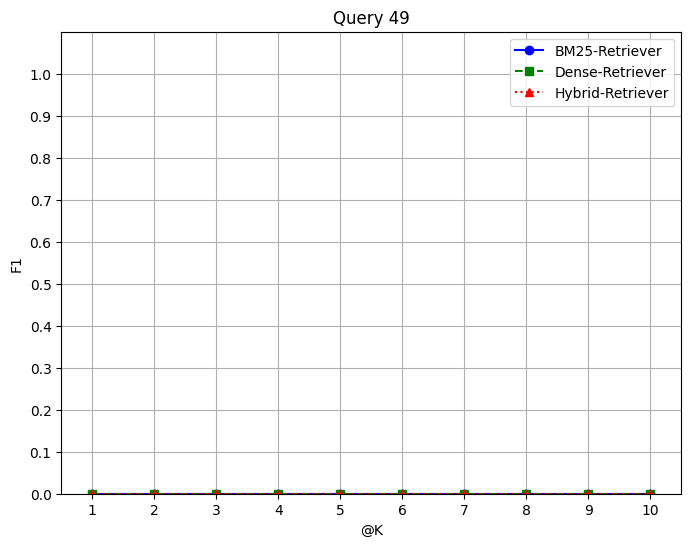

1
2
3
4
5
6
7
8
9
10
BM - F1: [0.         0.         0.         0.         0.         0.02244
 0.01965957 0.0176     0.0165     0.01534884], Dense - F1: [0.         0.         0.         0.         0.02490566 0.02244
 0.01965957 0.03641304 0.05115638 0.04747126], Hybrid - F1: [0.         0.         0.         0.         0.0165     0.01534884
 0.01414286 0.02711905 0.03939975 0.03387478]


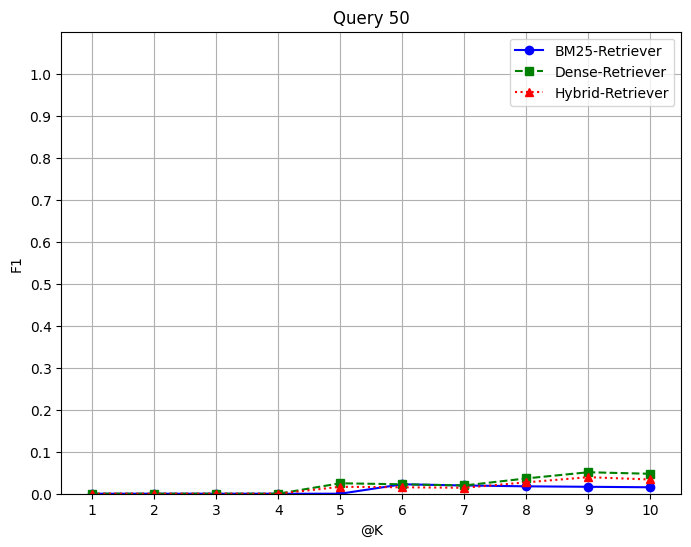

BM - Recall: [0.07496758 0.09641498 0.09522074 0.09551042 0.09476076 0.09810713
 0.10082288 0.10015956 0.10133588 0.10143   ], Dense - Recall: [0.06593299 0.10459421 0.10765215 0.11204174 0.11817869 0.1216805
 0.12132923 0.11703685 0.11859624 0.11859821], Hybrid - Recall: [0.09933657 0.12455828 0.12138096 0.11923107 0.11745403 0.11797055
 0.11936044 0.11776296 0.11586782 0.11452214]


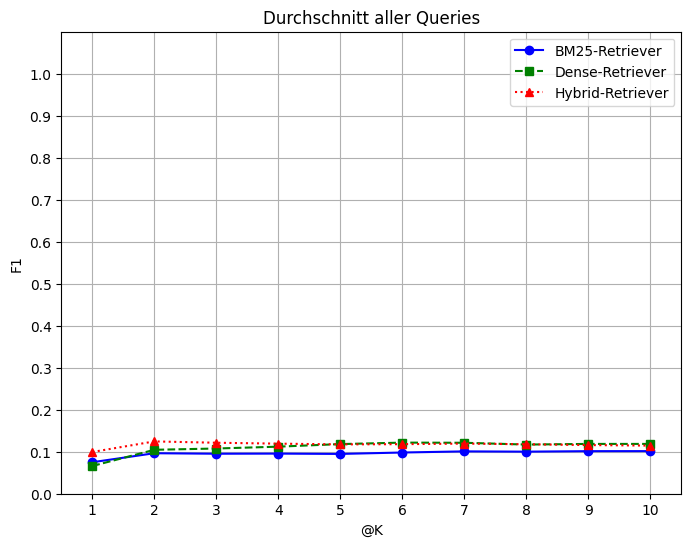

In [32]:
createF1Diagramms()

BM - Precision: [0.2   0.25  0.165 0.125 0.1   0.118 0.157 0.175 0.165 0.16 ], Dense - Precision: [0.    0.25  0.232 0.225 0.22  0.218 0.2   0.186 0.165 0.17 ], Hybrid - Precision: [0.1   0.25  0.2   0.181 0.158 0.166 0.17  0.177 0.163 0.154]


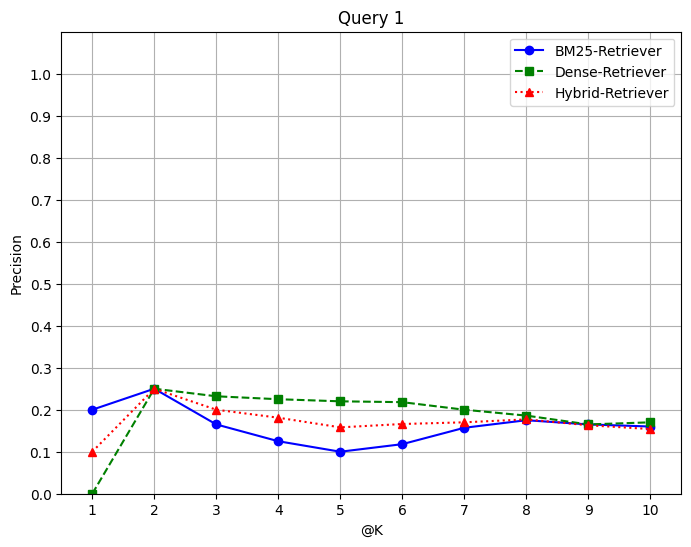

BM - Precision: [0.2   0.25  0.165 0.125 0.1   0.102 0.143 0.162 0.154 0.15 ], Dense - Precision: [0.3   0.3   0.267 0.2   0.18  0.15  0.129 0.111 0.099 0.1  ], Hybrid - Precision: [0.25  0.225 0.187 0.131 0.12  0.109 0.125 0.127 0.115 0.114]


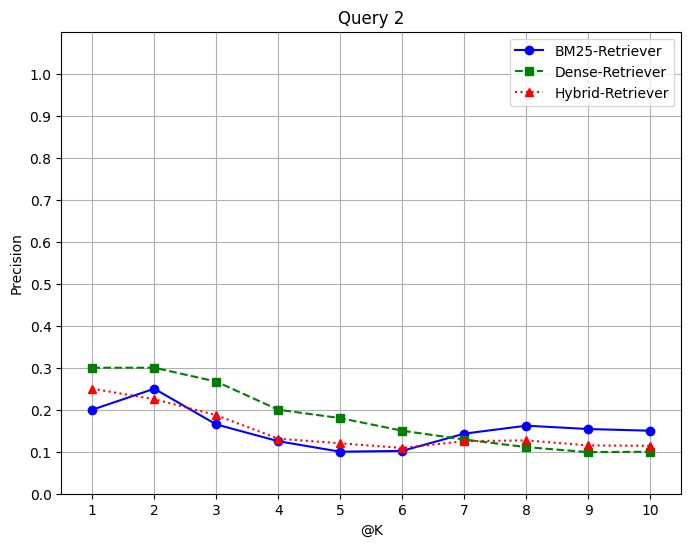

BM - Precision: [0.3   0.2   0.165 0.15  0.14  0.151 0.142 0.148 0.143 0.15 ], Dense - Precision: [0.3   0.3   0.2   0.175 0.14  0.116 0.129 0.111 0.11  0.1  ], Hybrid - Precision: [0.3   0.242 0.17  0.162 0.137 0.131 0.127 0.123 0.117 0.116]


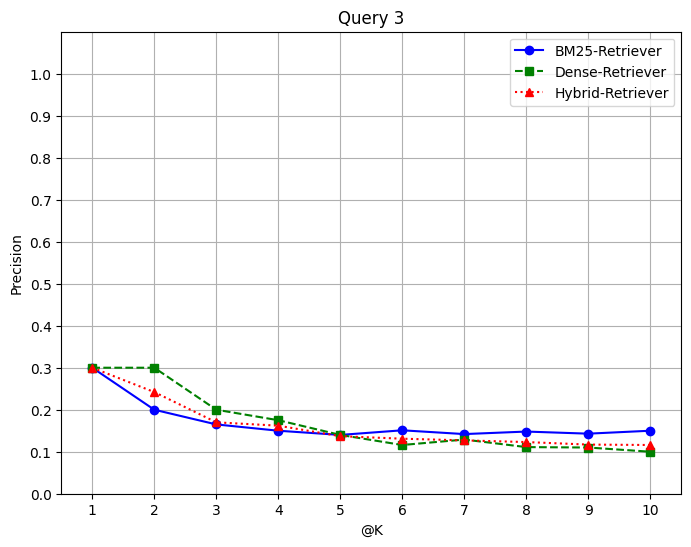

BM - Precision: [0.3   0.35  0.233 0.175 0.14  0.15  0.187 0.201 0.187 0.18 ], Dense - Precision: [0.4   0.2   0.132 0.125 0.1   0.084 0.086 0.098 0.099 0.09 ], Hybrid - Precision: [0.35  0.259 0.164 0.14  0.114 0.114 0.137 0.15  0.145 0.131]


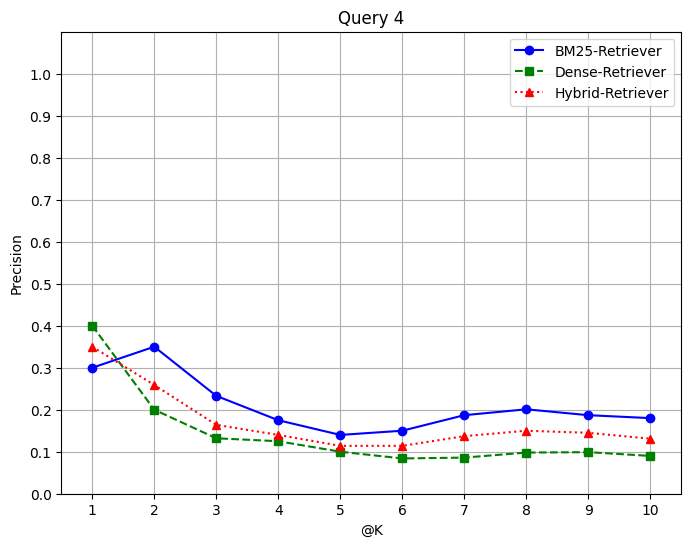

BM - Precision: [0.2   0.1   0.132 0.2   0.18  0.168 0.142 0.135 0.121 0.13 ], Dense - Precision: [0.3   0.15  0.167 0.175 0.2   0.167 0.158 0.137 0.143 0.14 ], Hybrid - Precision: [0.25  0.124 0.152 0.179 0.186 0.163 0.142 0.134 0.131 0.134]


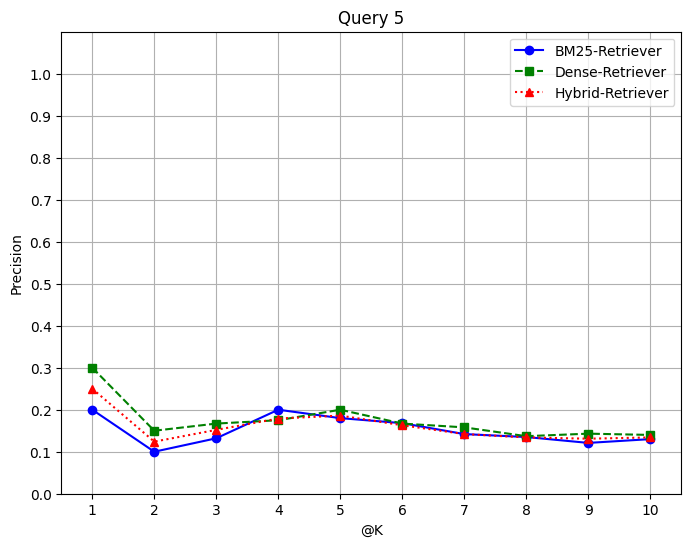

BM - Precision: [0.1   0.15  0.099 0.1   0.1   0.101 0.143 0.162 0.143 0.14 ], Dense - Precision: [0.2   0.25  0.234 0.2   0.16  0.133 0.115 0.111 0.099 0.09 ], Hybrid - Precision: [0.15  0.166 0.15  0.125 0.111 0.102 0.125 0.128 0.115 0.114]


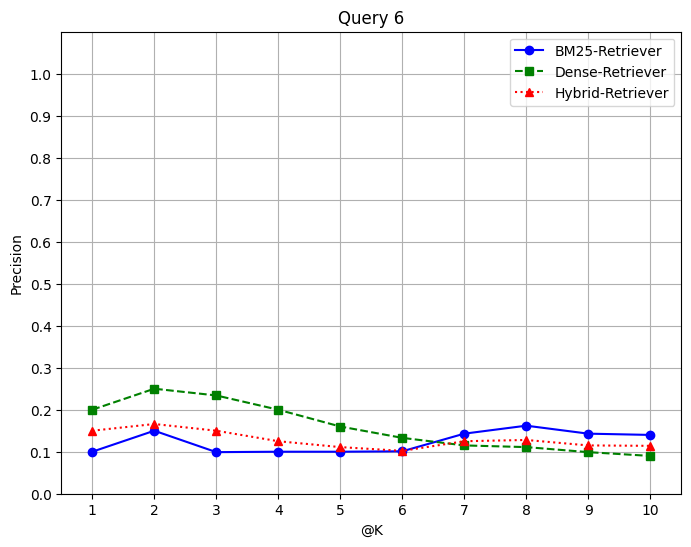

BM - Precision: [0.2   0.1   0.1   0.125 0.12  0.1   0.114 0.098 0.088 0.08 ], Dense - Precision: [0.2   0.1   0.066 0.075 0.06  0.051 0.042 0.049 0.066 0.07 ], Hybrid - Precision: [0.2   0.1   0.087 0.094 0.093 0.082 0.092 0.089 0.08  0.076]


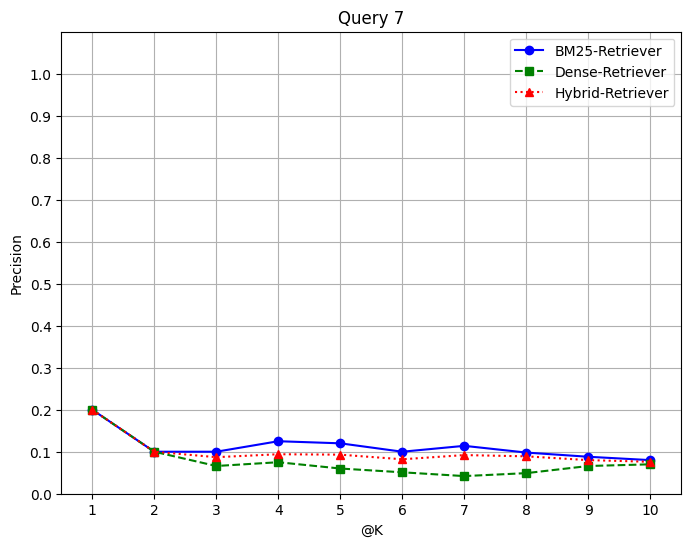

BM - Precision: [0.2   0.15  0.166 0.125 0.14  0.118 0.113 0.123 0.11  0.1  ], Dense - Precision: [0.2   0.2   0.165 0.125 0.14  0.15  0.129 0.124 0.11  0.11 ], Hybrid - Precision: [0.2   0.175 0.163 0.134 0.155 0.129 0.121 0.12  0.106 0.1  ]


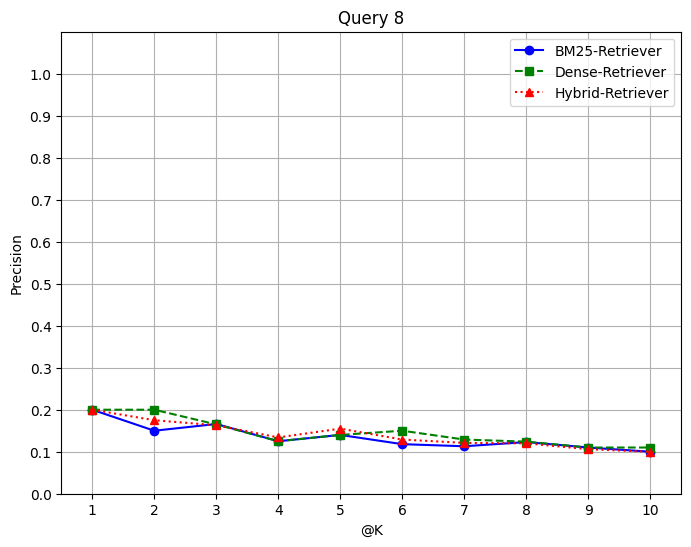

BM - Precision: [0.1   0.05  0.066 0.05  0.06  0.067 0.057 0.049 0.055 0.05 ], Dense - Precision: [0.2   0.1   0.132 0.125 0.14  0.117 0.114 0.098 0.099 0.1  ], Hybrid - Precision: [0.15  0.083 0.107 0.103 0.115 0.105 0.097 0.089 0.09  0.087]


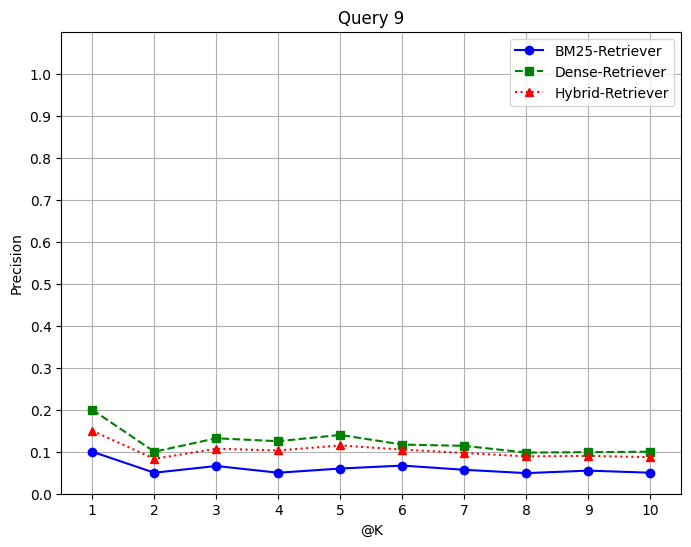

BM - Precision: [0.1   0.05  0.066 0.05  0.06  0.067 0.057 0.049 0.055 0.05 ], Dense - Precision: [0.1   0.2   0.165 0.175 0.18  0.168 0.142 0.135 0.121 0.11 ], Hybrid - Precision: [0.1   0.133 0.134 0.121 0.129 0.122 0.107 0.101 0.098 0.087]


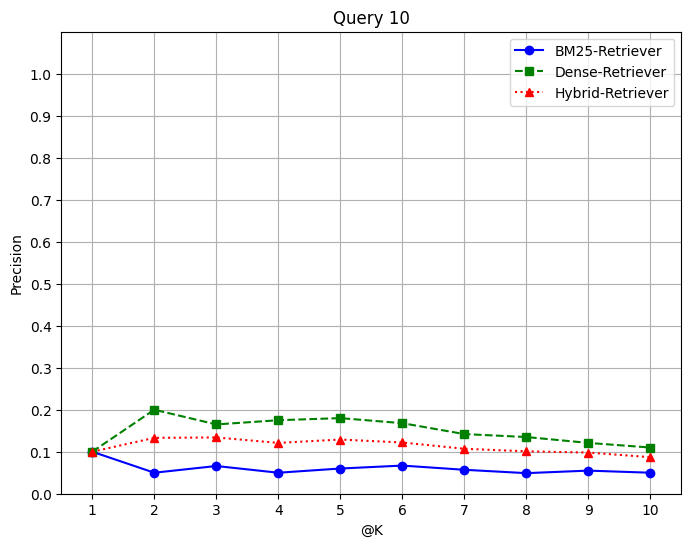

BM - Precision: [0.2   0.1   0.099 0.1   0.12  0.101 0.085 0.086 0.088 0.1  ], Dense - Precision: [0.2   0.15  0.165 0.15  0.18  0.151 0.143 0.148 0.132 0.12 ], Hybrid - Precision: [0.2   0.149 0.148 0.136 0.133 0.115 0.104 0.109 0.103 0.099]


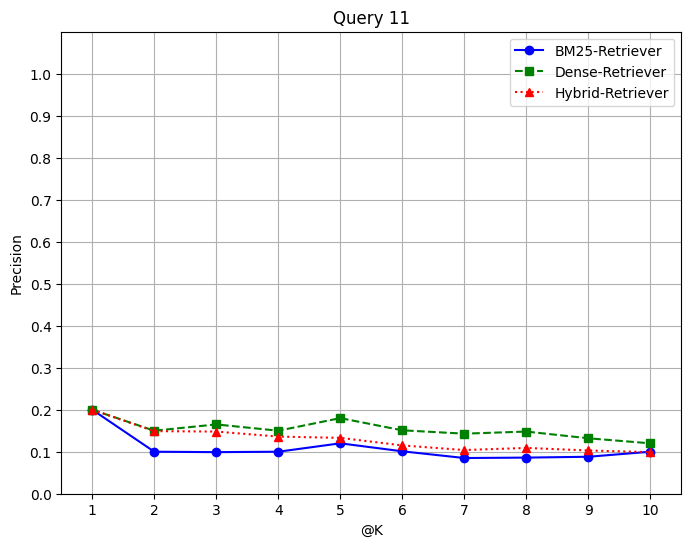

BM - Precision: [0.2   0.1   0.1   0.1   0.1   0.101 0.1   0.086 0.11  0.1  ], Dense - Precision: [0.1   0.2   0.165 0.15  0.14  0.152 0.127 0.123 0.11  0.11 ], Hybrid - Precision: [0.15  0.141 0.134 0.12  0.113 0.124 0.115 0.11  0.107 0.105]


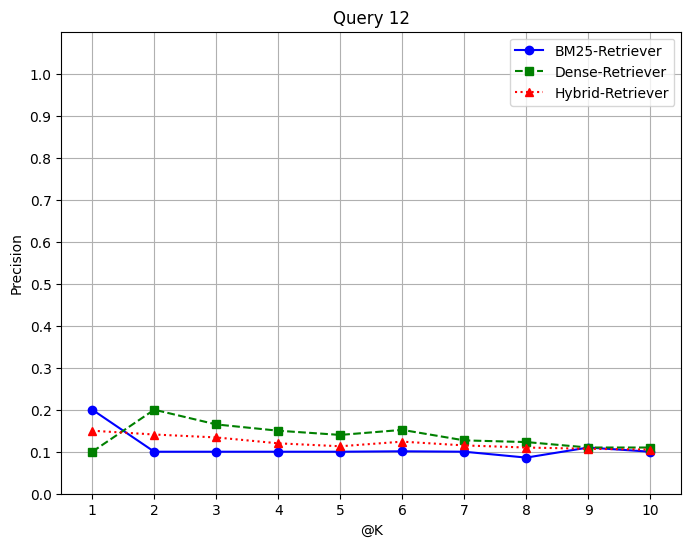

BM - Precision: [0.    0.05  0.033 0.05  0.04  0.034 0.028 0.024 0.022 0.02 ], Dense - Precision: [0.    0.    0.033 0.05  0.06  0.084 0.085 0.073 0.066 0.06 ], Hybrid - Precision: [0.    0.025 0.037 0.059 0.057 0.068 0.065 0.061 0.054 0.049]


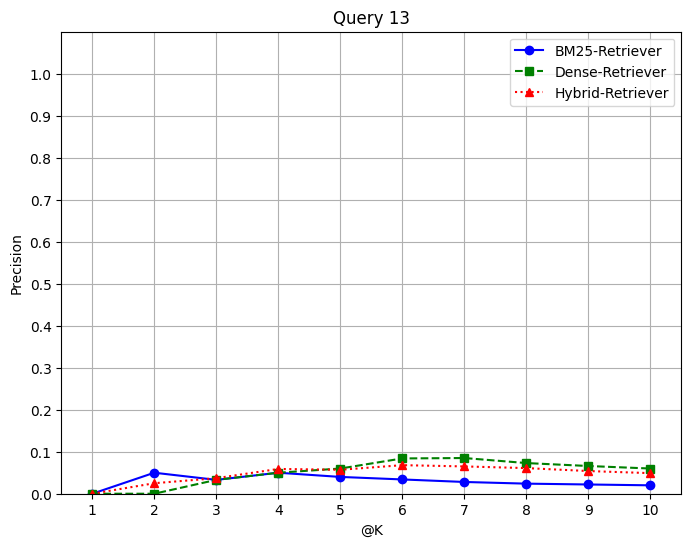

BM - Precision: [0.1   0.15  0.099 0.075 0.06  0.051 0.042 0.036 0.033 0.03 ], Dense - Precision: [0.3   0.15  0.165 0.15  0.16  0.135 0.127 0.109 0.099 0.1  ], Hybrid - Precision: [0.2   0.141 0.124 0.113 0.101 0.085 0.082 0.075 0.066 0.067]


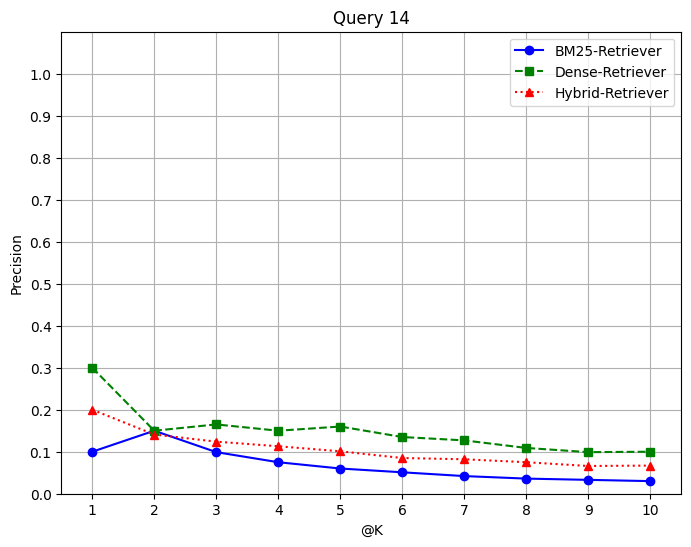

BM - Precision: [0.4   0.25  0.199 0.175 0.18  0.151 0.128 0.11  0.11  0.1  ], Dense - Precision: [0.3   0.15  0.165 0.125 0.12  0.119 0.127 0.109 0.11  0.1  ], Hybrid - Precision: [0.35  0.2   0.183 0.163 0.135 0.116 0.112 0.102 0.094 0.082]


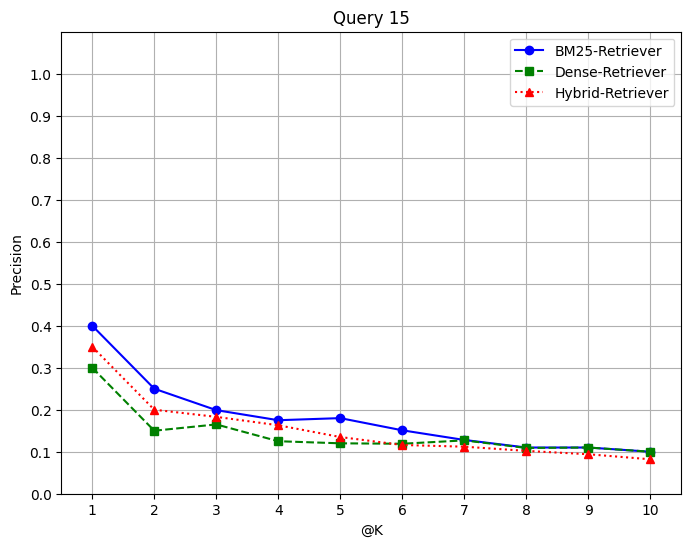

BM - Precision: [0.3   0.15  0.099 0.075 0.06  0.051 0.056 0.048 0.055 0.06 ], Dense - Precision: [0.    0.05  0.099 0.1   0.08  0.118 0.114 0.098 0.088 0.08 ], Hybrid - Precision: [0.15  0.1   0.099 0.077 0.058 0.068 0.071 0.06  0.061 0.059]


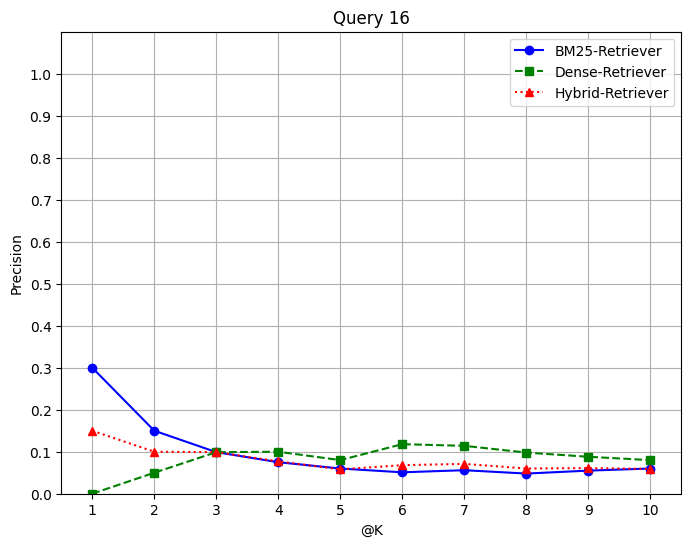

BM - Precision: [0.    0.    0.    0.    0.    0.017 0.014 0.012 0.011 0.01 ], Dense - Precision: [0.    0.    0.    0.    0.    0.051 0.042 0.048 0.044 0.05 ], Hybrid - Precision: [0.    0.    0.    0.    0.    0.035 0.032 0.034 0.031 0.033]


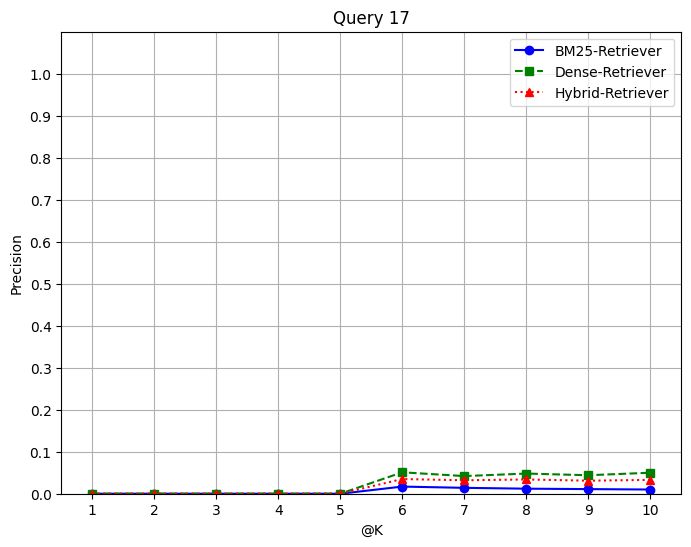

BM - Precision: [0.    0.05  0.033 0.025 0.04  0.034 0.028 0.024 0.033 0.03 ], Dense - Precision: [0.    0.05  0.033 0.05  0.08  0.067 0.072 0.062 0.055 0.05 ], Hybrid - Precision: [0.    0.05  0.025 0.032 0.066 0.055 0.056 0.047 0.042 0.039]


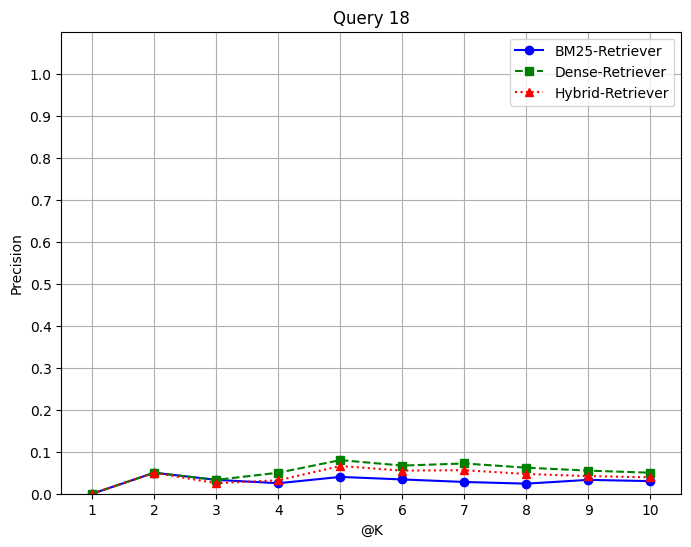

BM - Precision: [0.2   0.2   0.133 0.125 0.1   0.084 0.086 0.074 0.066 0.06 ], Dense - Precision: [0.    0.15  0.099 0.075 0.1   0.1   0.086 0.074 0.077 0.07 ], Hybrid - Precision: [0.1   0.167 0.109 0.087 0.085 0.073 0.063 0.054 0.05  0.045]


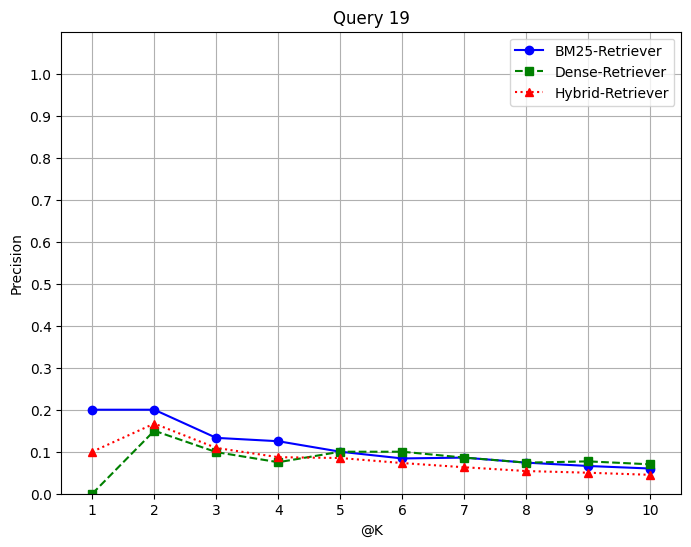

BM - Precision: [0.1   0.05  0.066 0.05  0.04  0.068 0.056 0.048 0.055 0.05 ], Dense - Precision: [0.1   0.1   0.099 0.075 0.1   0.083 0.086 0.074 0.088 0.08 ], Hybrid - Precision: [0.1   0.075 0.07  0.051 0.058 0.059 0.059 0.052 0.06  0.055]


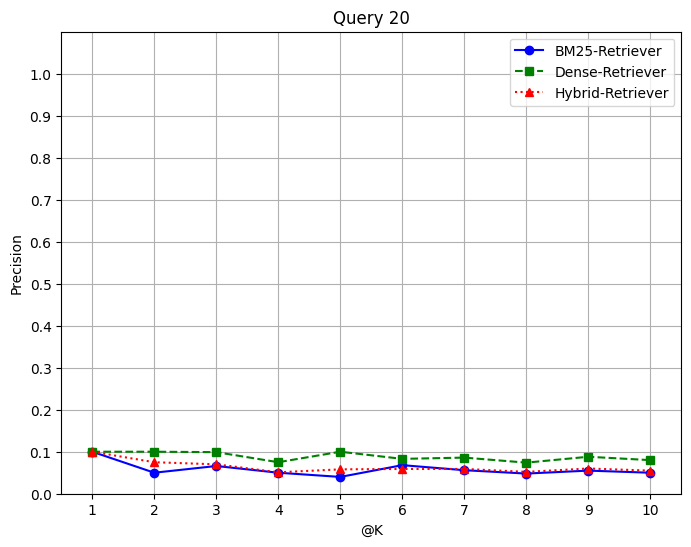

BM - Precision: [0.2   0.15  0.099 0.075 0.06  0.051 0.042 0.036 0.044 0.04 ], Dense - Precision: [0.    0.15  0.099 0.075 0.06  0.1   0.086 0.074 0.066 0.06 ], Hybrid - Precision: [0.1   0.141 0.082 0.06  0.05  0.062 0.055 0.049 0.05  0.045]


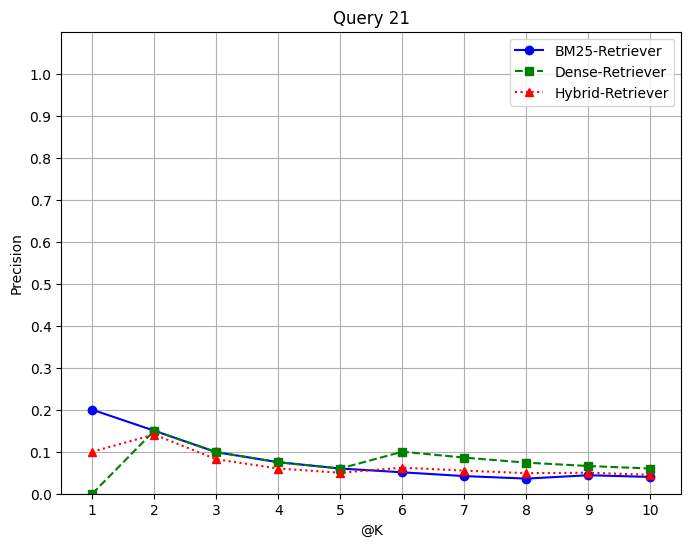

BM - Precision: [0.1   0.1   0.1   0.075 0.08  0.084 0.086 0.099 0.121 0.11 ], Dense - Precision: [0.    0.    0.033 0.075 0.06  0.051 0.085 0.086 0.121 0.11 ], Hybrid - Precision: [0.05  0.058 0.06  0.083 0.068 0.064 0.082 0.094 0.118 0.109]


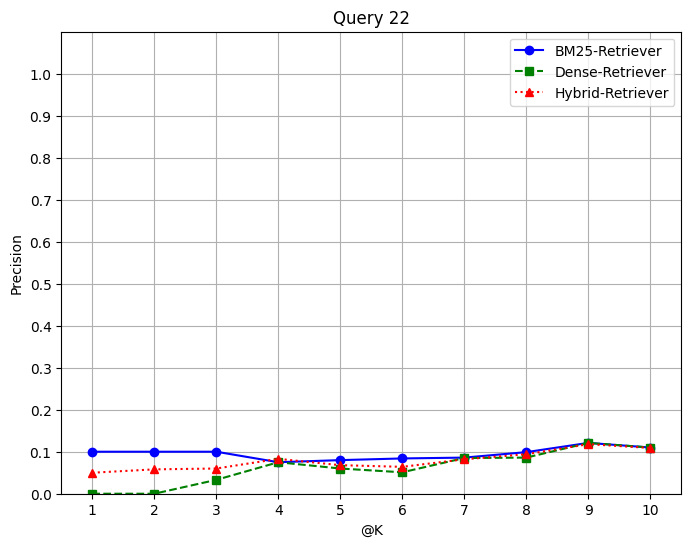

BM - Precision: [0.1   0.1   0.133 0.125 0.1   0.084 0.085 0.1   0.11  0.11 ], Dense - Precision: [0.    0.    0.033 0.05  0.04  0.067 0.1   0.086 0.099 0.1  ], Hybrid - Precision: [0.05  0.058 0.095 0.103 0.079 0.09  0.092 0.097 0.111 0.115]


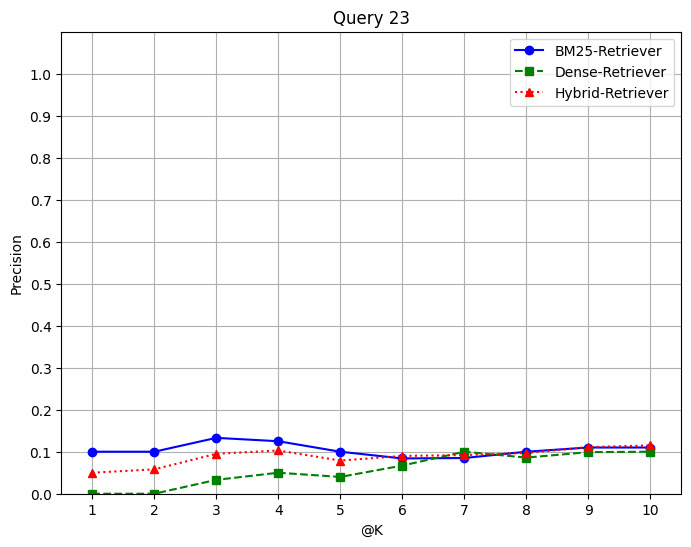

BM - Precision: [0.2   0.15  0.133 0.1   0.08  0.101 0.1   0.125 0.121 0.13 ], Dense - Precision: [0.2   0.25  0.165 0.15  0.18  0.15  0.159 0.163 0.176 0.17 ], Hybrid - Precision: [0.2   0.224 0.16  0.139 0.14  0.133 0.138 0.15  0.159 0.159]


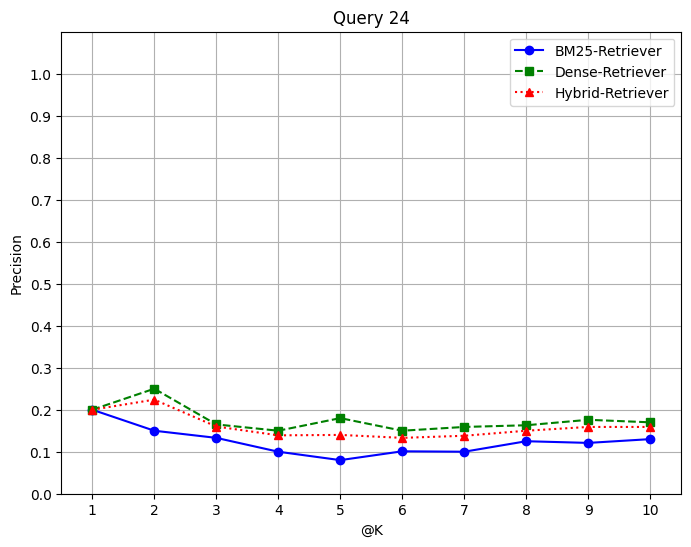

BM - Precision: [0.3   0.2   0.165 0.15  0.18  0.168 0.156 0.135 0.132 0.13 ], Dense - Precision: [0.4   0.35  0.299 0.25  0.2   0.234 0.214 0.222 0.22  0.24 ], Hybrid - Precision: [0.35  0.258 0.22  0.196 0.18  0.201 0.192 0.187 0.181 0.179]


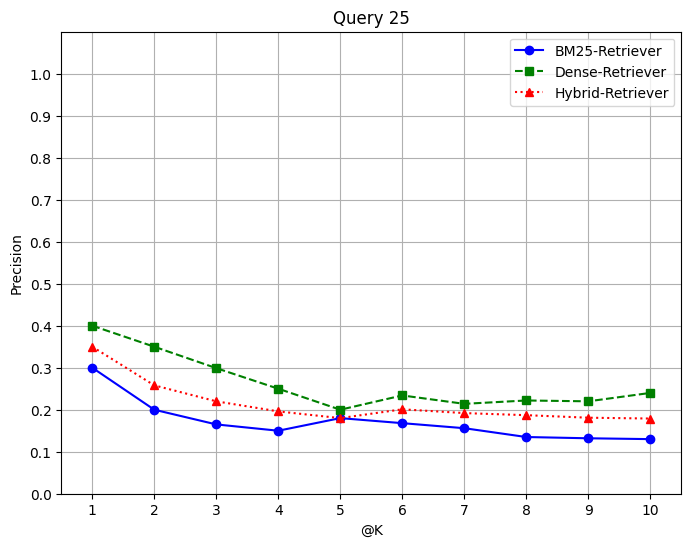

BM - Precision: [0.    0.05  0.033 0.05  0.06  0.067 0.071 0.062 0.055 0.05 ], Dense - Precision: [0.3   0.25  0.198 0.225 0.2   0.182 0.159 0.162 0.165 0.17 ], Hybrid - Precision: [0.15  0.15  0.121 0.134 0.132 0.121 0.113 0.113 0.113 0.117]


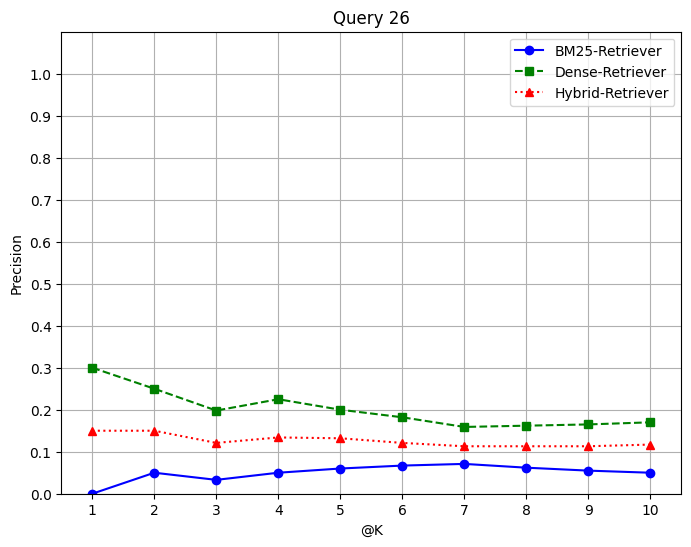

BM - Precision: [0.3   0.25  0.231 0.175 0.16  0.152 0.142 0.122 0.11  0.1  ], Dense - Precision: [0.1   0.1   0.132 0.2   0.16  0.136 0.141 0.121 0.121 0.11 ], Hybrid - Precision: [0.2   0.174 0.159 0.15  0.124 0.101 0.107 0.097 0.088 0.078]


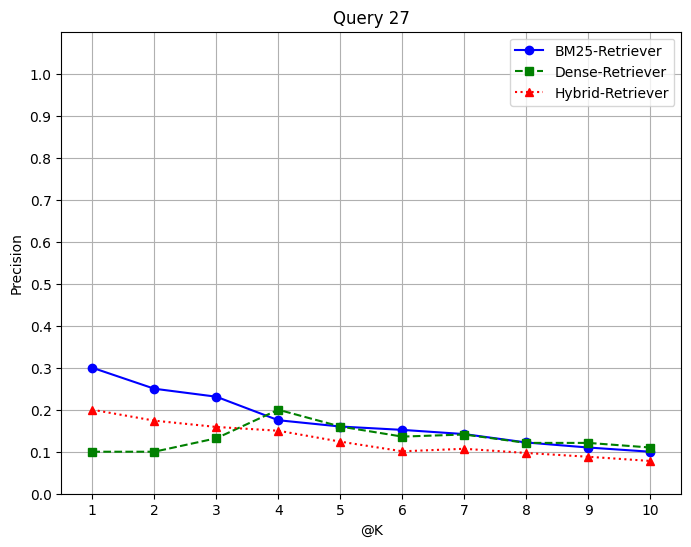

BM - Precision: [0.3   0.25  0.231 0.175 0.14  0.119 0.112 0.096 0.088 0.09 ], Dense - Precision: [0.2   0.2   0.132 0.125 0.12  0.119 0.113 0.097 0.088 0.08 ], Hybrid - Precision: [0.25  0.191 0.169 0.126 0.111 0.103 0.096 0.084 0.078 0.079]


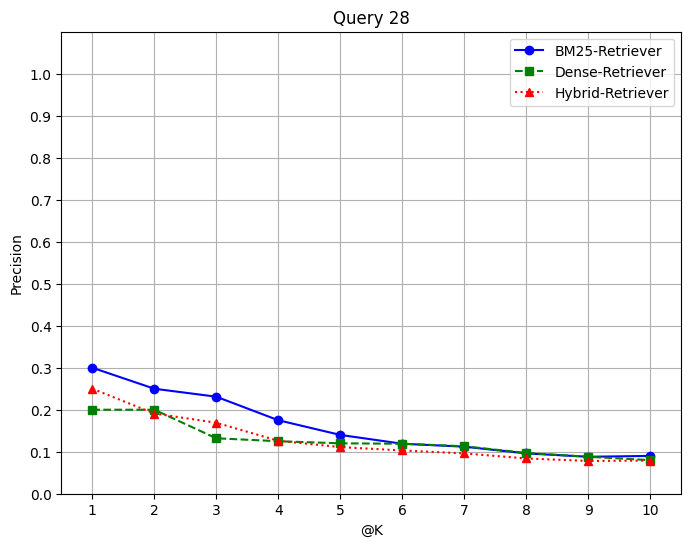

BM - Precision: [0.2   0.2   0.165 0.175 0.14  0.135 0.113 0.097 0.099 0.09 ], Dense - Precision: [0.2   0.15  0.132 0.125 0.14  0.134 0.128 0.11  0.099 0.09 ], Hybrid - Precision: [0.2   0.166 0.141 0.143 0.114 0.106 0.091 0.08  0.076 0.073]


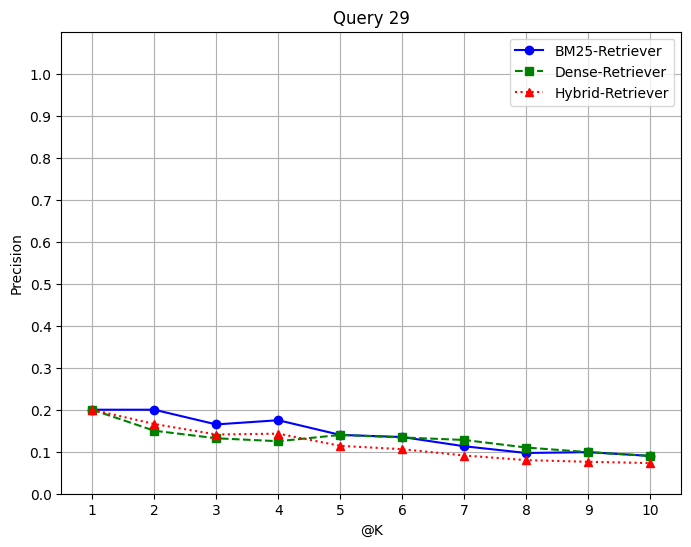

BM - Precision: [0.    0.    0.    0.    0.    0.    0.    0.012 0.011 0.02 ], Dense - Precision: [0.    0.    0.033 0.025 0.04  0.034 0.028 0.024 0.033 0.03 ], Hybrid - Precision: [0.    0.    0.017 0.012 0.021 0.018 0.015 0.015 0.02  0.02 ]


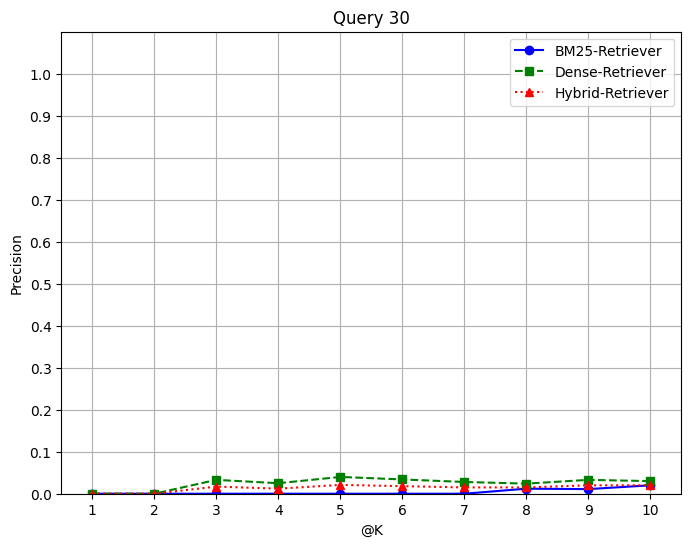

BM - Precision: [0.1   0.05  0.033 0.025 0.02  0.051 0.057 0.049 0.044 0.04 ], Dense - Precision: [0.1   0.05  0.033 0.075 0.06  0.051 0.042 0.036 0.033 0.03 ], Hybrid - Precision: [0.1   0.05  0.033 0.057 0.045 0.039 0.043 0.038 0.034 0.03 ]


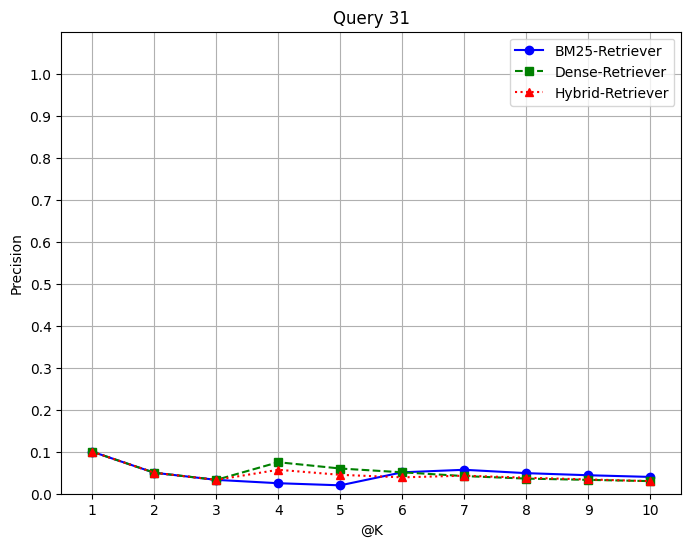

BM - Precision: [0.    0.05  0.033 0.05  0.04  0.051 0.042 0.036 0.033 0.04 ], Dense - Precision: [0.    0.    0.    0.    0.02  0.034 0.028 0.024 0.022 0.02 ], Hybrid - Precision: [0.    0.025 0.02  0.028 0.035 0.049 0.042 0.037 0.034 0.035]


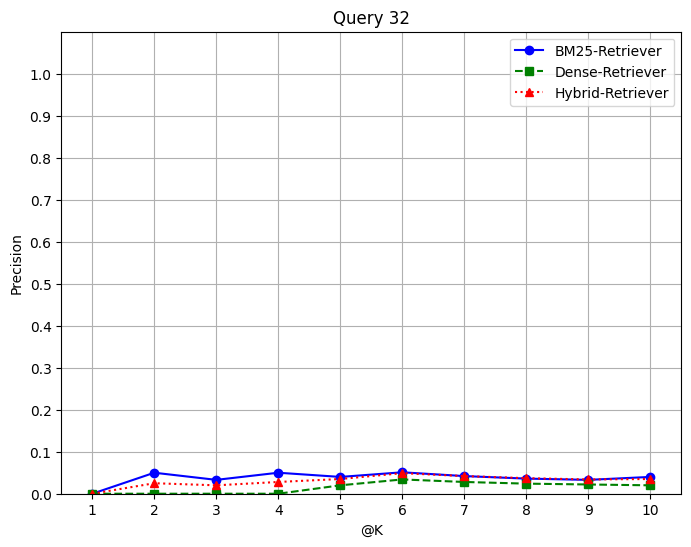

BM - Precision: [0.    0.1   0.1   0.075 0.08  0.083 0.086 0.074 0.077 0.07 ], Dense - Precision: [0.2   0.3   0.231 0.2   0.18  0.169 0.156 0.134 0.121 0.11 ], Hybrid - Precision: [0.1   0.2   0.172 0.134 0.133 0.117 0.102 0.09  0.086 0.08 ]


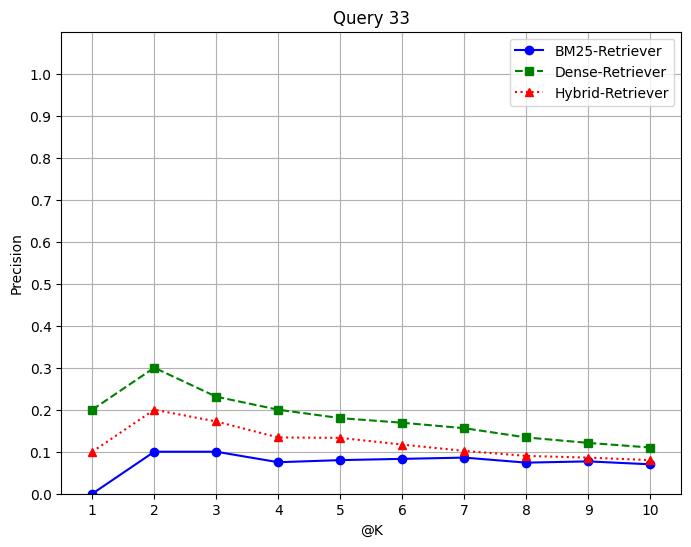

BM - Precision: [0.4   0.3   0.232 0.2   0.18  0.151 0.157 0.135 0.121 0.11 ], Dense - Precision: [0.1   0.05  0.033 0.05  0.04  0.034 0.056 0.06  0.066 0.07 ], Hybrid - Precision: [0.25  0.183 0.141 0.126 0.101 0.086 0.112 0.098 0.097 0.089]


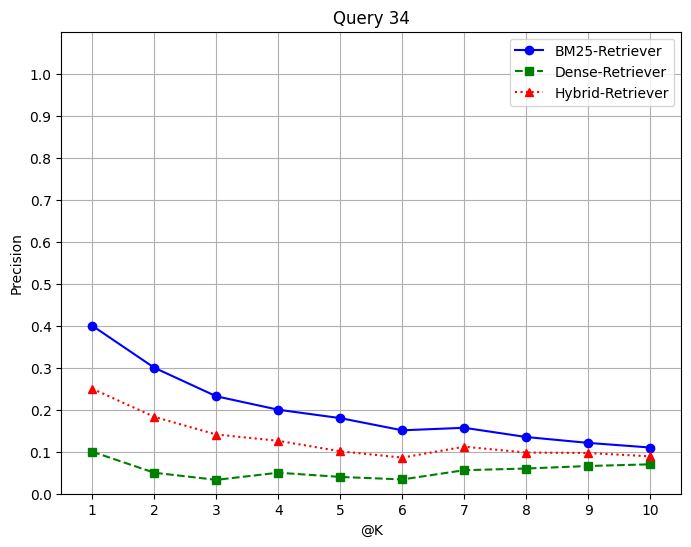

BM - Precision: [0.2   0.1   0.099 0.1   0.1   0.085 0.07  0.072 0.066 0.07 ], Dense - Precision: [0.1   0.05  0.033 0.025 0.02  0.017 0.028 0.036 0.055 0.06 ], Hybrid - Precision: [0.15  0.075 0.082 0.072 0.067 0.057 0.058 0.054 0.066 0.066]


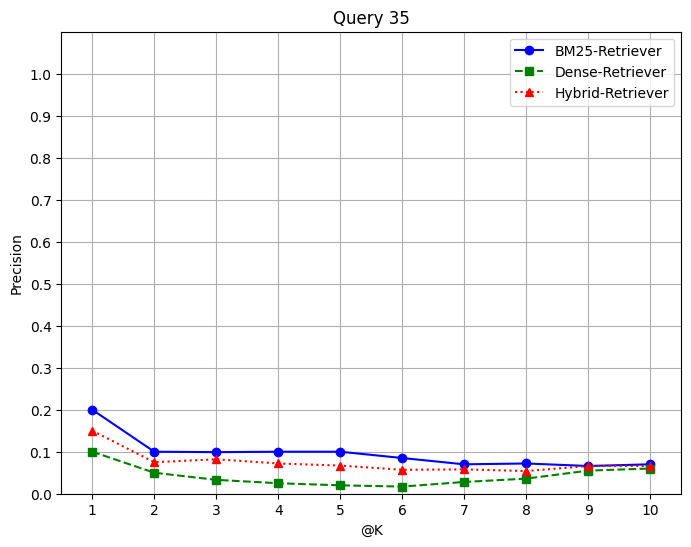

BM - Precision: [0.1   0.05  0.033 0.025 0.04  0.051 0.042 0.048 0.055 0.07 ], Dense - Precision: [0.    0.05  0.033 0.025 0.02  0.017 0.014 0.036 0.055 0.06 ], Hybrid - Precision: [0.05  0.058 0.037 0.026 0.032 0.036 0.031 0.046 0.042 0.057]


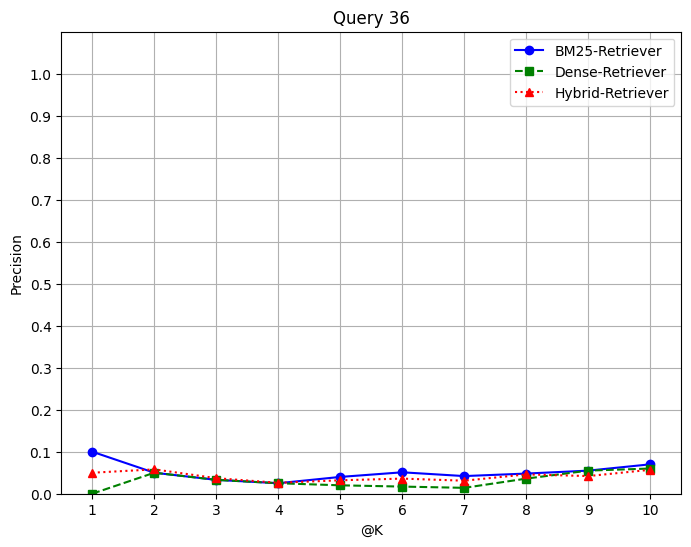

BM - Precision: [0.    0.    0.033 0.075 0.06  0.051 0.042 0.049 0.055 0.05 ], Dense - Precision: [0.2   0.35  0.232 0.2   0.18  0.201 0.171 0.16  0.154 0.15 ], Hybrid - Precision: [0.1   0.175 0.124 0.126 0.112 0.123 0.108 0.107 0.102 0.097]


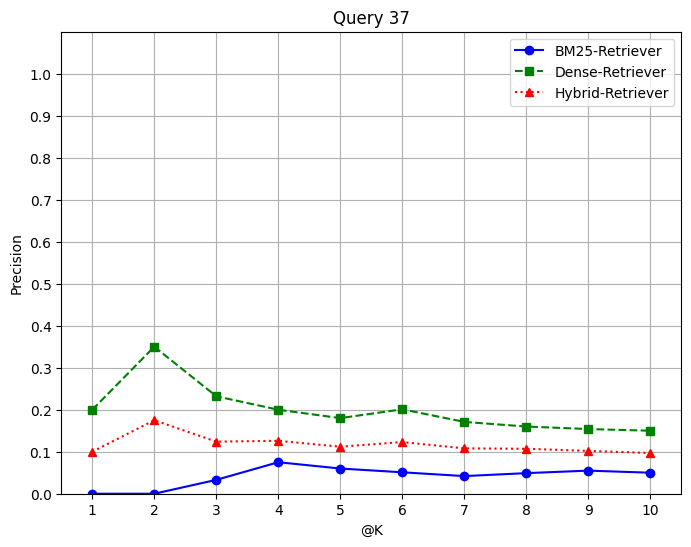

BM - Precision: [0.    0.    0.    0.    0.    0.017 0.014 0.012 0.011 0.01 ], Dense - Precision: [0.    0.    0.    0.025 0.02  0.017 0.014 0.012 0.011 0.02 ], Hybrid - Precision: [0.    0.    0.    0.012 0.011 0.018 0.016 0.014 0.012 0.017]


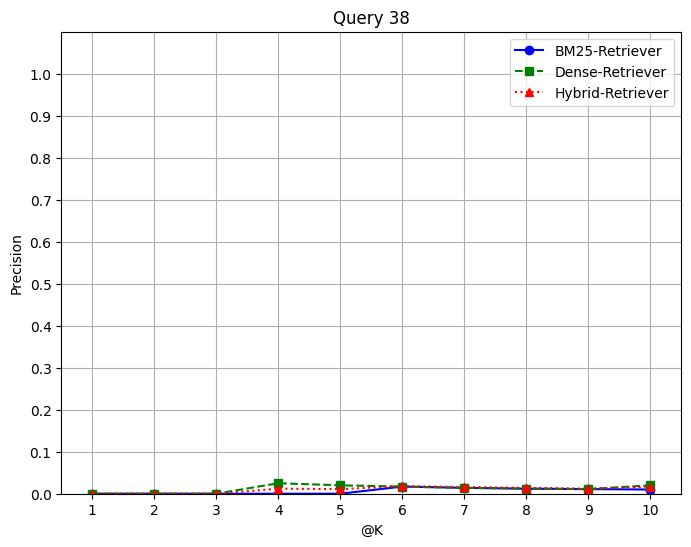

BM - Precision: [0.    0.    0.    0.025 0.02  0.017 0.014 0.012 0.011 0.02 ], Dense - Precision: [0.1   0.1   0.066 0.05  0.04  0.034 0.028 0.024 0.022 0.03 ], Hybrid - Precision: [0.05  0.058 0.037 0.04  0.032 0.028 0.024 0.021 0.018 0.028]


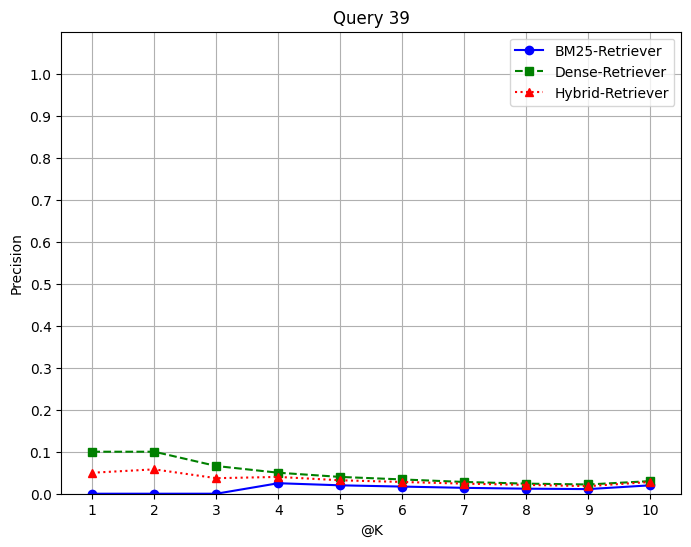

BM - Precision: [0.1   0.05  0.033 0.025 0.02  0.034 0.028 0.024 0.022 0.03 ], Dense - Precision: [0.1   0.05  0.066 0.05  0.04  0.05  0.057 0.049 0.044 0.05 ], Hybrid - Precision: [0.1   0.05  0.057 0.041 0.032 0.045 0.045 0.04  0.036 0.04 ]


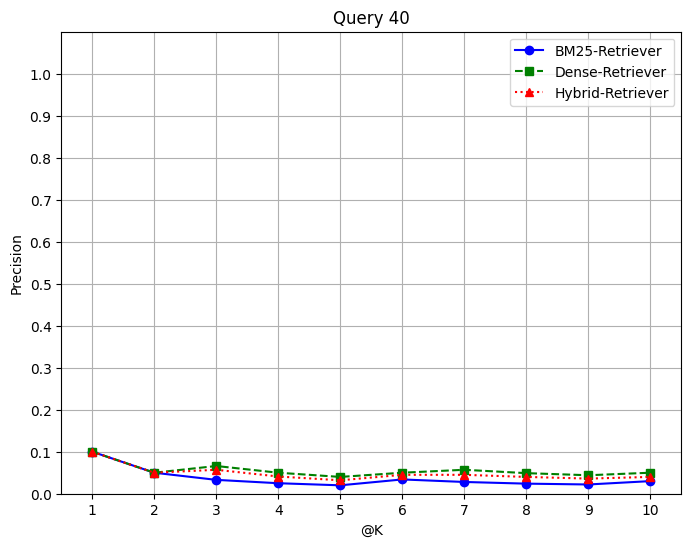

BM - Precision: [0.1   0.1   0.066 0.075 0.06  0.051 0.042 0.036 0.044 0.05 ], Dense - Precision: [0.    0.    0.    0.    0.02  0.017 0.042 0.036 0.033 0.03 ], Hybrid - Precision: [0.05  0.05  0.037 0.043 0.036 0.03  0.037 0.033 0.031 0.033]


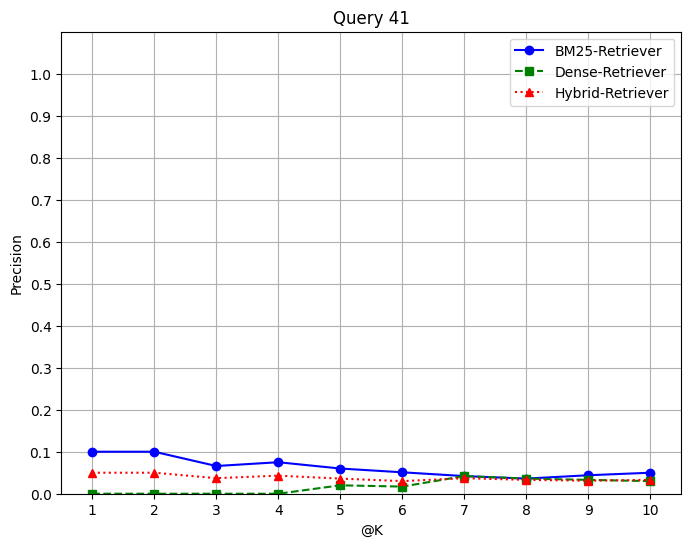

BM - Precision: [0.    0.05  0.033 0.025 0.02  0.017 0.028 0.024 0.022 0.02 ], Dense - Precision: [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.01], Hybrid - Precision: [0.    0.025 0.017 0.012 0.01  0.008 0.014 0.012 0.012 0.016]


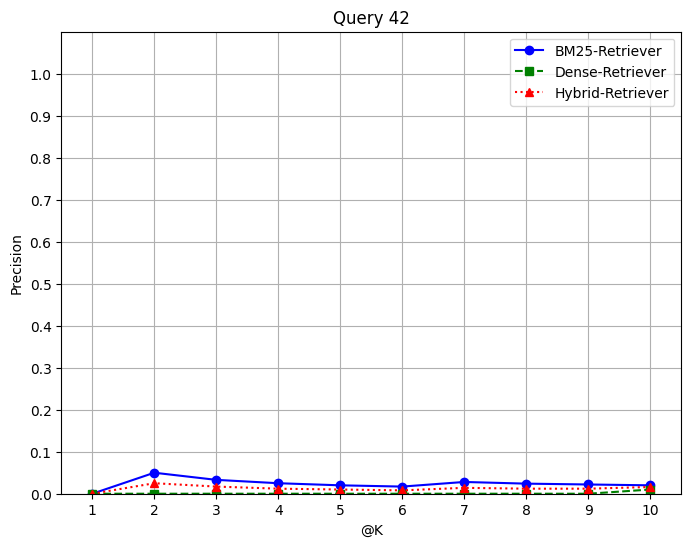

BM - Precision: [0.2   0.3   0.231 0.175 0.16  0.152 0.142 0.122 0.121 0.11 ], Dense - Precision: [0.2   0.4   0.299 0.225 0.18  0.168 0.142 0.123 0.121 0.12 ], Hybrid - Precision: [0.2   0.274 0.217 0.161 0.14  0.135 0.118 0.105 0.095 0.087]


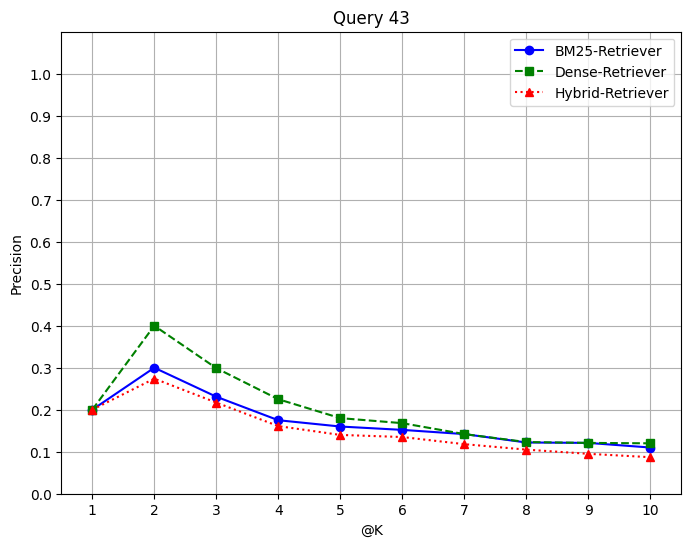

BM - Precision: [0.    0.    0.    0.    0.    0.    0.014 0.012 0.011 0.01 ], Dense - Precision: [0.    0.05  0.033 0.05  0.06  0.051 0.042 0.036 0.033 0.04 ], Hybrid - Precision: [0.    0.033 0.02  0.028 0.036 0.032 0.036 0.03  0.027 0.03 ]


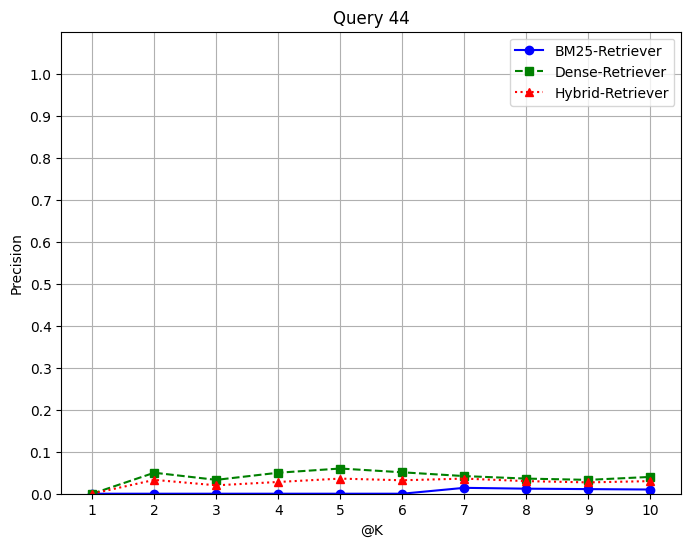

BM - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - Precision: [0.    0.    0.    0.    0.    0.    0.    0.012 0.011 0.01 ], Hybrid - Precision: [0.    0.    0.    0.    0.    0.    0.    0.008 0.007 0.006]


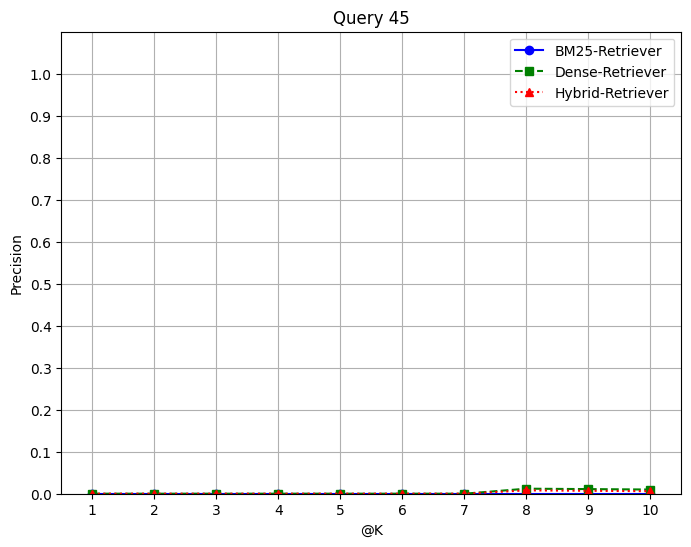

BM - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


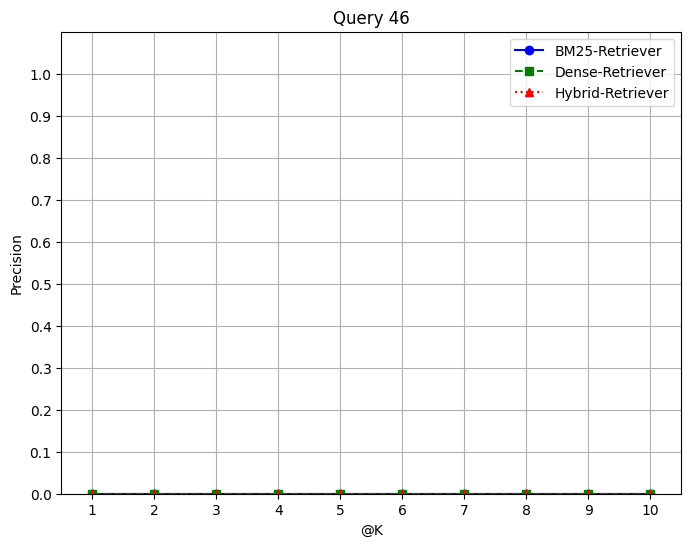

BM - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


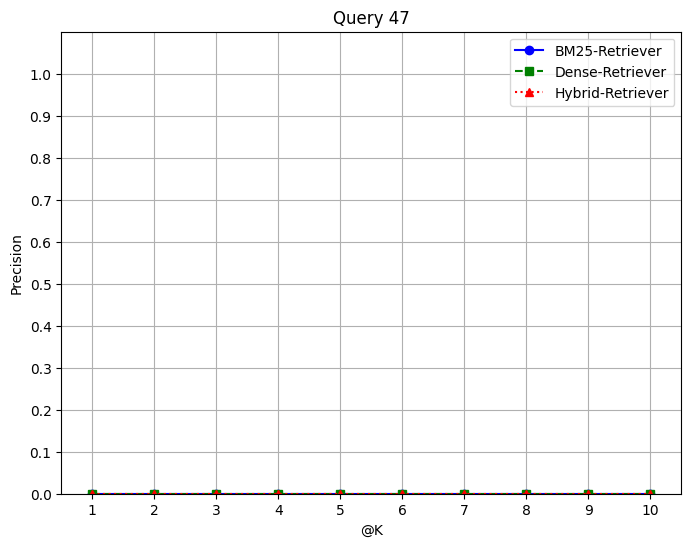

BM - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


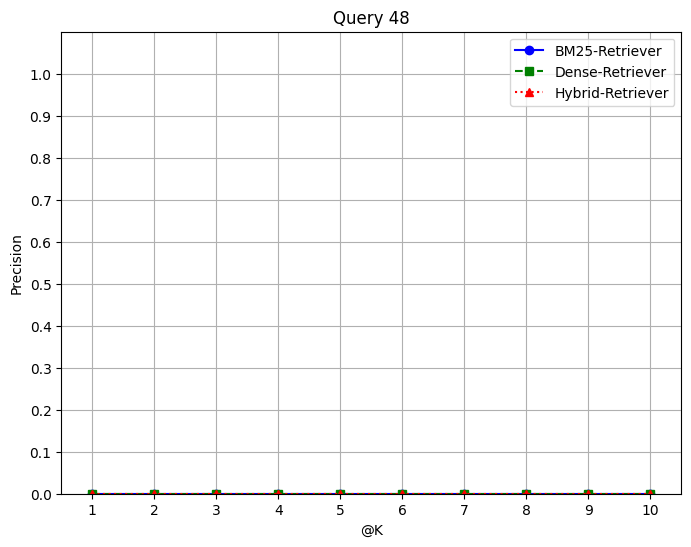

BM - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - Precision: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


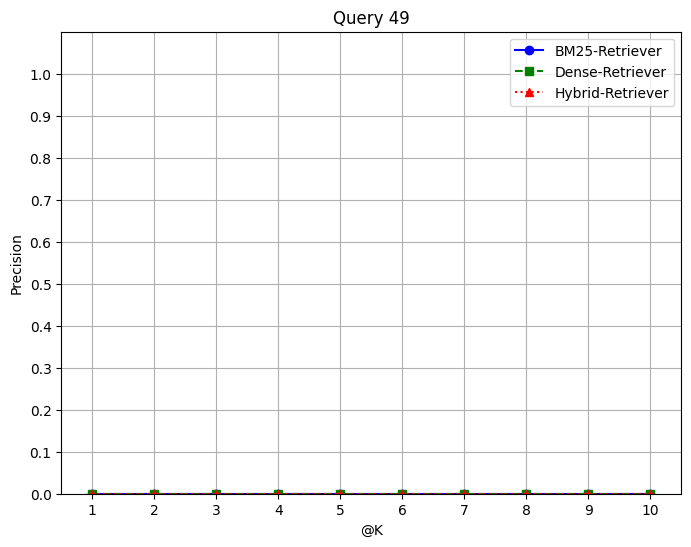

BM - Precision: [0.    0.    0.    0.    0.    0.017 0.014 0.012 0.011 0.01 ], Dense - Precision: [0.    0.    0.    0.    0.02  0.017 0.014 0.025 0.033 0.03 ], Hybrid - Precision: [0.    0.    0.    0.    0.011 0.01  0.009 0.017 0.024 0.02 ]


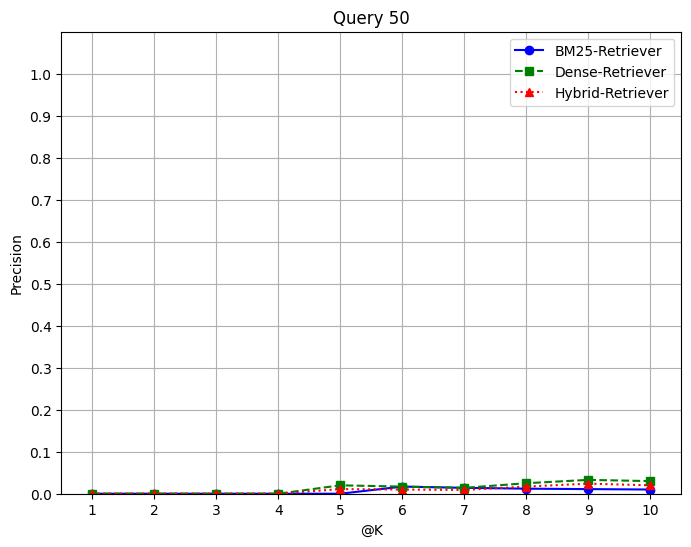

BM - Recall: [0.126   0.107   0.08868 0.0795  0.0736  0.07246 0.07154 0.06902 0.06798
 0.0666 ], Dense - Recall: [0.114   0.119   0.10196 0.096   0.0928  0.08996 0.086   0.08052 0.07964
 0.078  ], Hybrid - Recall: [0.12    0.10962 0.09322 0.0852  0.07952 0.07666 0.07556 0.07316 0.0709
 0.06902]


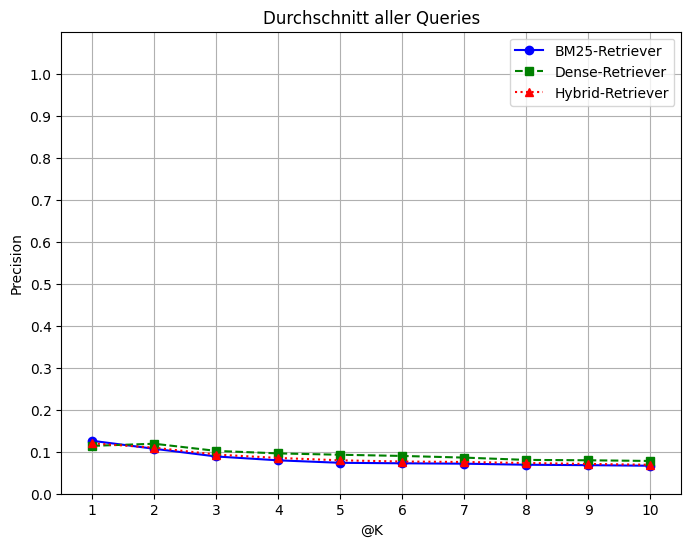

In [39]:
createPrecisionDiagramms()

BM - Recall: [0.05  0.158 0.158 0.158 0.158 0.208 0.317 0.4   0.425 0.45 ], Dense - Recall: [0.    0.175 0.242 0.3   0.375 0.433 0.467 0.483 0.483 0.525], Hybrid - Recall: [0.05  0.332 0.4   0.458 0.483 0.592 0.675 0.775 0.775 0.792]


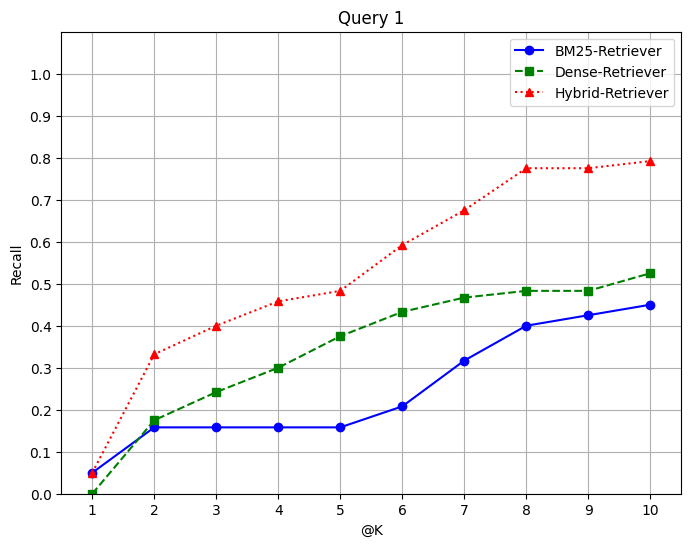

BM - Recall: [0.05  0.158 0.158 0.158 0.158 0.183 0.292 0.375 0.4   0.425], Dense - Recall: [0.075 0.149 0.208 0.208 0.258 0.258 0.258 0.258 0.258 0.283], Hybrid - Recall: [0.075 0.199 0.258 0.258 0.308 0.333 0.441 0.491 0.491 0.516]


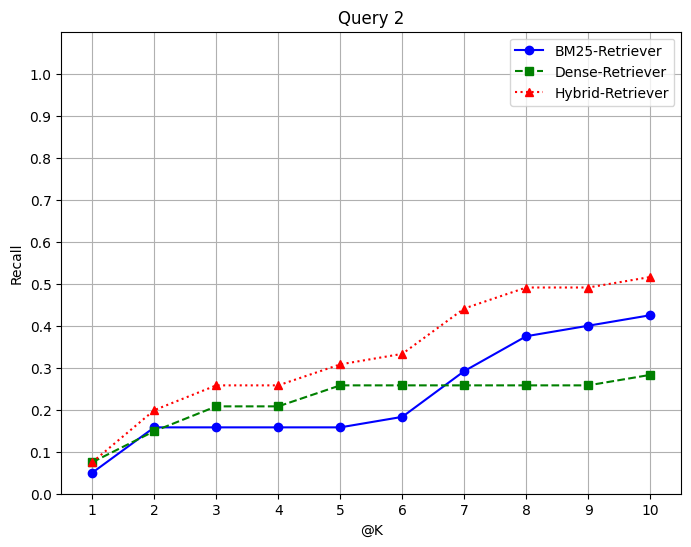

BM - Recall: [0.075 0.1   0.133 0.183 0.199 0.274 0.299 0.358 0.391 0.441], Dense - Recall: [0.075 0.149 0.149 0.183 0.183 0.183 0.258 0.258 0.283 0.283], Hybrid - Recall: [0.091 0.174 0.208 0.292 0.309 0.384 0.409 0.467 0.492 0.517]


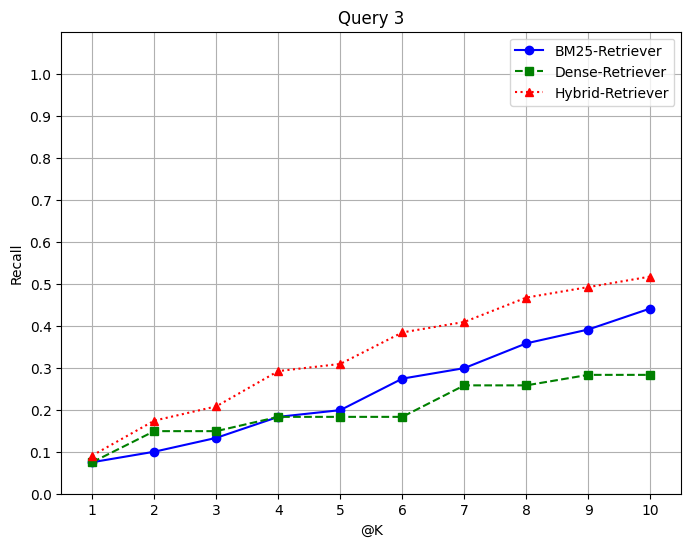

BM - Recall: [0.083 0.208 0.208 0.208 0.208 0.258 0.367 0.45  0.475 0.5  ], Dense - Recall: [0.108 0.108 0.108 0.142 0.142 0.142 0.158 0.216 0.266 0.266], Hybrid - Recall: [0.141 0.266 0.266 0.3   0.3   0.35  0.476 0.584 0.659 0.659]


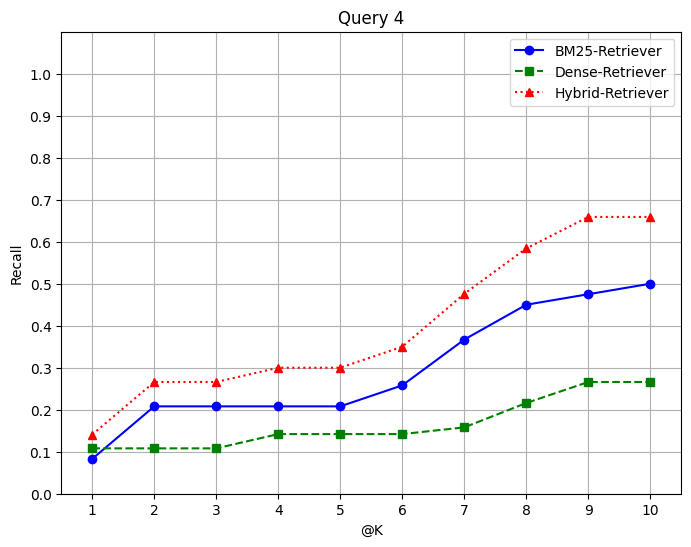

BM - Recall: [0.058 0.058 0.108 0.232 0.266 0.283 0.283 0.333 0.333 0.383], Dense - Recall: [0.075 0.075 0.116 0.167 0.275 0.275 0.309 0.309 0.384 0.409], Hybrid - Recall: [0.1   0.1   0.174 0.308 0.45  0.467 0.467 0.517 0.592 0.642]


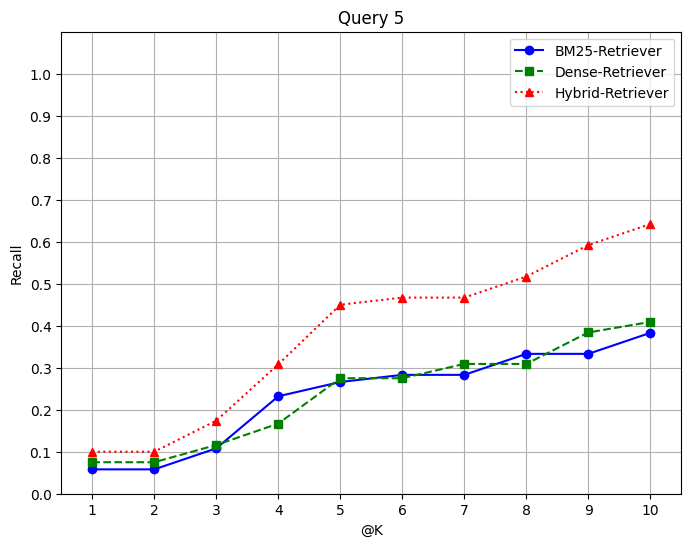

BM - Recall: [0.033 0.116 0.116 0.141 0.166 0.191 0.3   0.383 0.383 0.408], Dense - Recall: [0.058 0.133 0.183 0.208 0.208 0.208 0.208 0.258 0.258 0.258], Hybrid - Recall: [0.058 0.183 0.233 0.258 0.283 0.308 0.416 0.491 0.491 0.516]


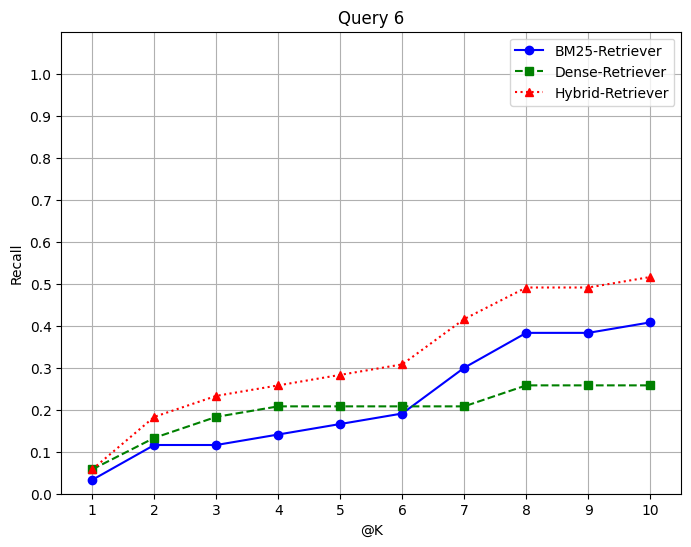

BM - Recall: [0.067 0.067 0.083 0.183 0.216 0.216 0.274 0.274 0.274 0.274], Dense - Recall: [0.083 0.083 0.083 0.1   0.1   0.1   0.1   0.116 0.191 0.225], Hybrid - Recall: [0.15  0.15  0.166 0.266 0.299 0.299 0.357 0.374 0.374 0.408]


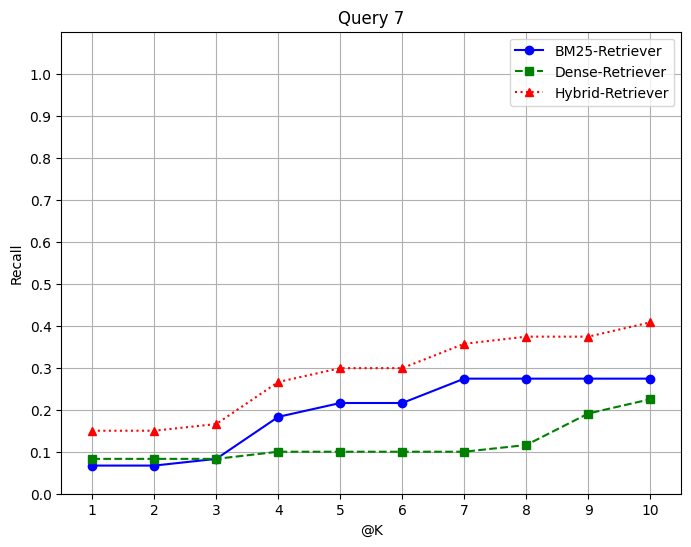

BM - Recall: [0.05  0.084 0.167 0.167 0.225 0.225 0.325 0.391 0.391 0.391], Dense - Recall: [0.083 0.166 0.183 0.183 0.233 0.3   0.3   0.325 0.325 0.358], Hybrid - Recall: [0.1   0.217 0.316 0.316 0.392 0.392 0.492 0.567 0.567 0.567]


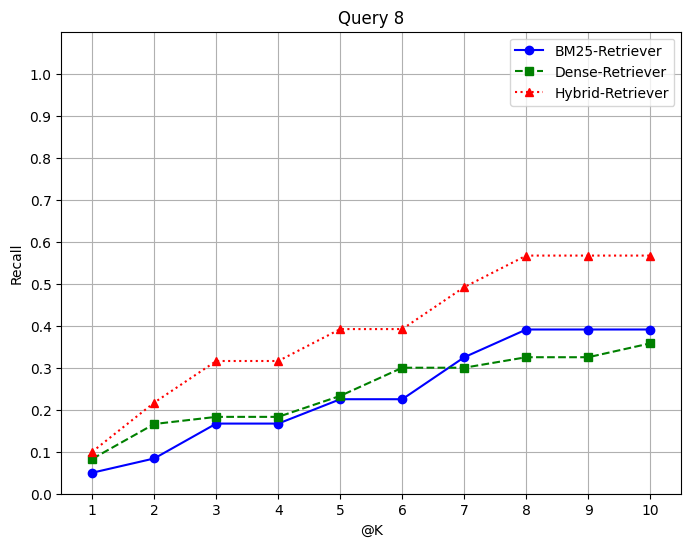

BM - Recall: [0.033 0.033 0.05  0.05  0.066 0.116 0.116 0.116 0.15  0.15 ], Dense - Recall: [0.083 0.083 0.15  0.2   0.266 0.266 0.291 0.291 0.308 0.358], Hybrid - Recall: [0.116 0.116 0.199 0.249 0.333 0.383 0.408 0.408 0.442 0.492]


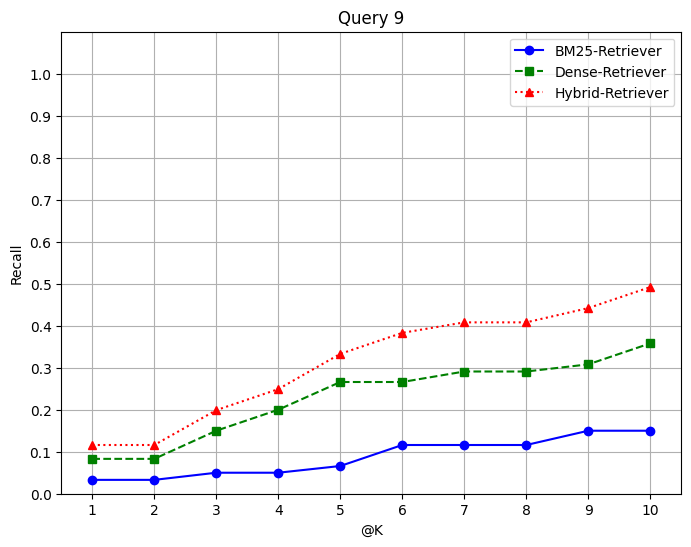

BM - Recall: [0.033 0.033 0.05  0.05  0.066 0.116 0.116 0.116 0.15  0.15 ], Dense - Recall: [0.05  0.15  0.2   0.266 0.341 0.358 0.358 0.375 0.375 0.375], Hybrid - Recall: [0.083 0.183 0.249 0.316 0.408 0.458 0.458 0.474 0.508 0.508]


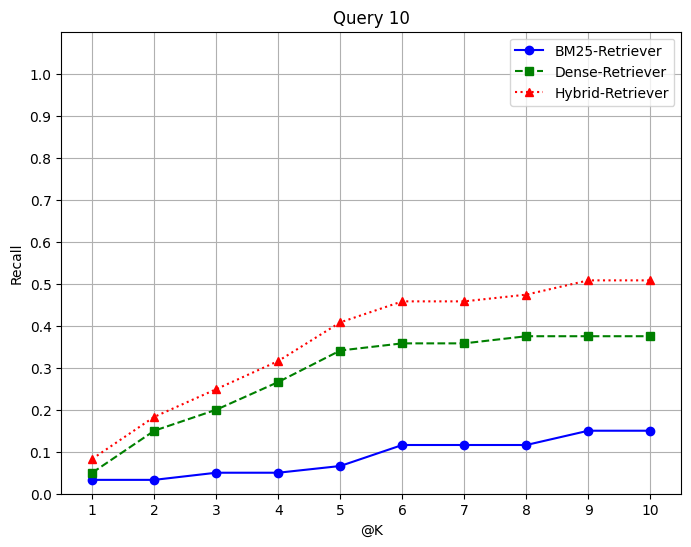

BM - Recall: [0.05  0.05  0.075 0.125 0.225 0.225 0.225 0.241 0.258 0.341], Dense - Recall: [0.1   0.133 0.2   0.216 0.333 0.333 0.383 0.441 0.441 0.441], Hybrid - Recall: [0.15  0.183 0.274 0.341 0.391 0.391 0.441 0.5   0.517 0.551]


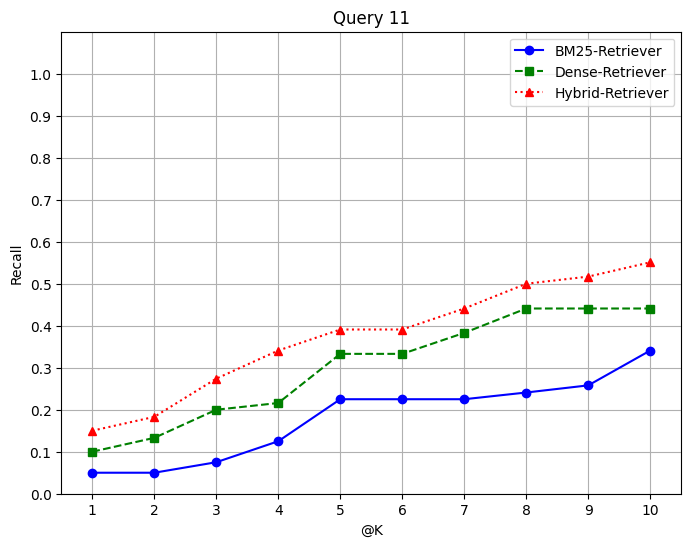

BM - Recall: [0.1   0.1   0.15  0.167 0.217 0.242 0.258 0.258 0.358 0.358], Dense - Recall: [0.05  0.183 0.2   0.216 0.233 0.308 0.308 0.333 0.333 0.433], Hybrid - Recall: [0.15  0.233 0.3   0.316 0.333 0.433 0.45  0.475 0.509 0.609]


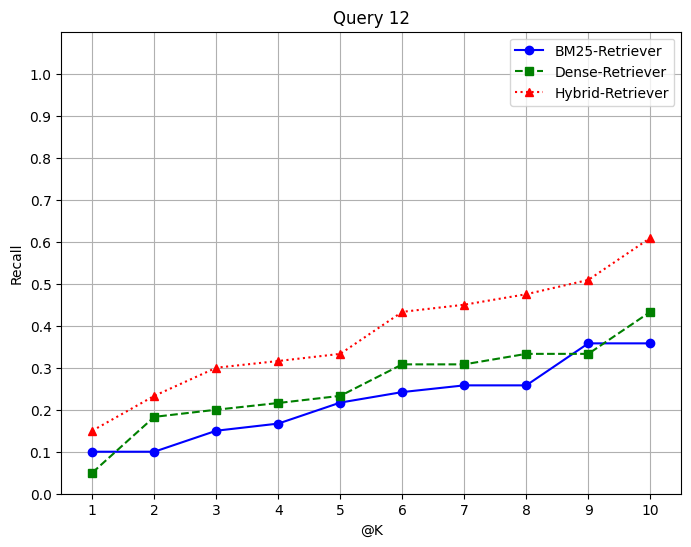

BM - Recall: [0.    0.05  0.05  0.083 0.083 0.083 0.083 0.083 0.083 0.083], Dense - Recall: [0.    0.    0.05  0.083 0.133 0.233 0.258 0.258 0.258 0.258], Hybrid - Recall: [0.    0.05  0.1   0.167 0.217 0.317 0.342 0.342 0.342 0.342]


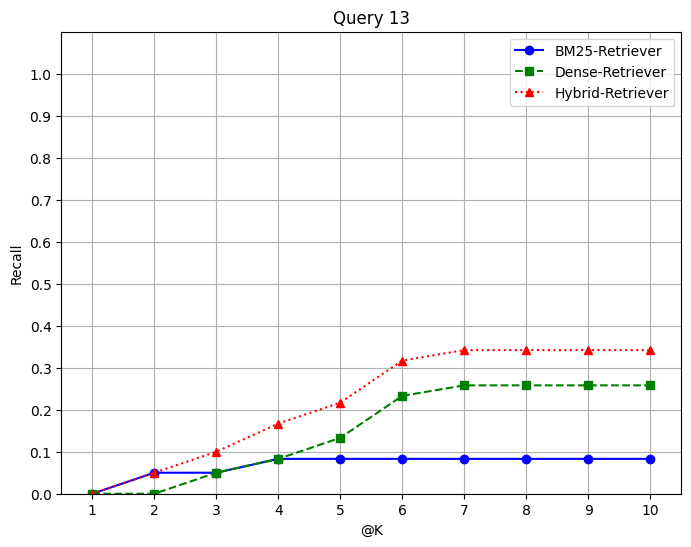

BM - Recall: [0.1 0.2 0.2 0.2 0.2 0.2 0.2 0.2 0.2 0.2], Dense - Recall: [0.2  0.2  0.3  0.35 0.55 0.55 0.6  0.6  0.6  0.65], Hybrid - Recall: [0.3  0.35 0.45 0.5  0.6  0.6  0.65 0.65 0.65 0.7 ]


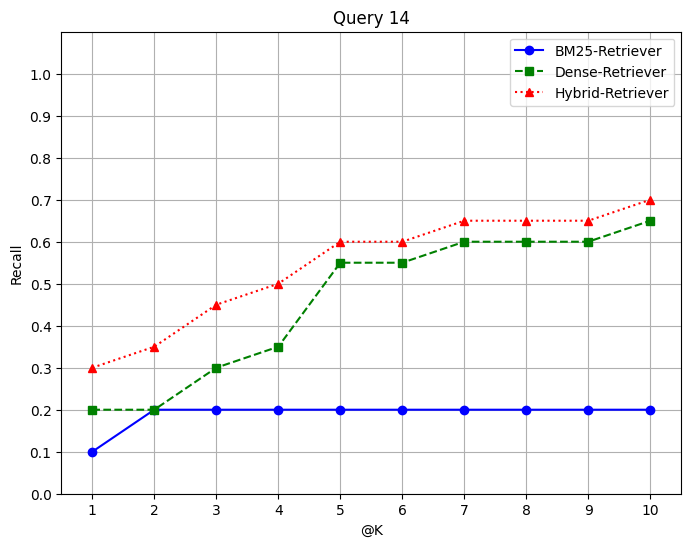

BM - Recall: [0.233 0.283 0.383 0.433 0.533 0.533 0.533 0.533 0.633 0.633], Dense - Recall: [0.2   0.2   0.3   0.3   0.4   0.5   0.6   0.6   0.633 0.633], Hybrid - Recall: [0.433 0.433 0.533 0.583 0.583 0.683 0.733 0.733 0.733 0.733]


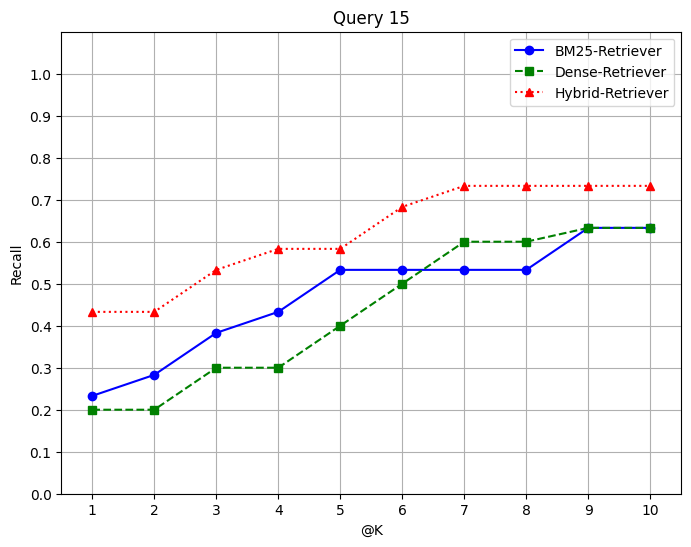

BM - Recall: [0.3  0.3  0.3  0.3  0.3  0.3  0.35 0.35 0.45 0.5 ], Dense - Recall: [0.   0.1  0.25 0.35 0.35 0.55 0.6  0.6  0.6  0.6 ], Hybrid - Recall: [0.3  0.3  0.45 0.45 0.45 0.55 0.6  0.6  0.7  0.7 ]


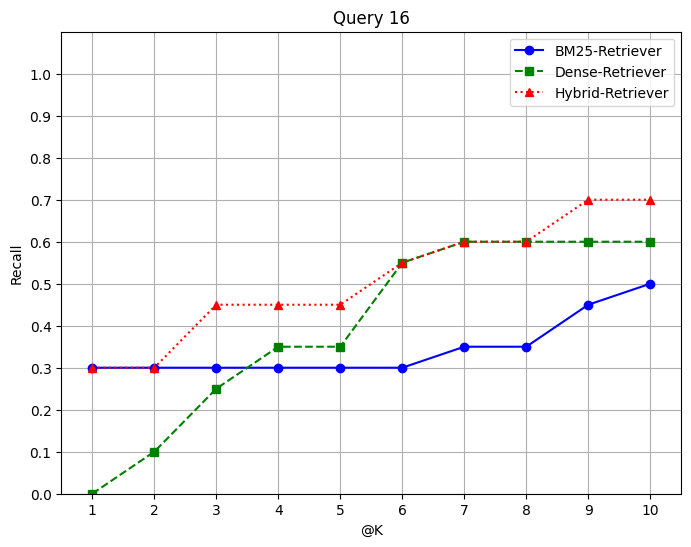

BM - Recall: [0.  0.  0.  0.  0.  0.1 0.1 0.1 0.1 0.1], Dense - Recall: [0.   0.   0.   0.   0.   0.3  0.3  0.4  0.4  0.45], Hybrid - Recall: [0.   0.   0.   0.   0.   0.4  0.4  0.5  0.5  0.55]


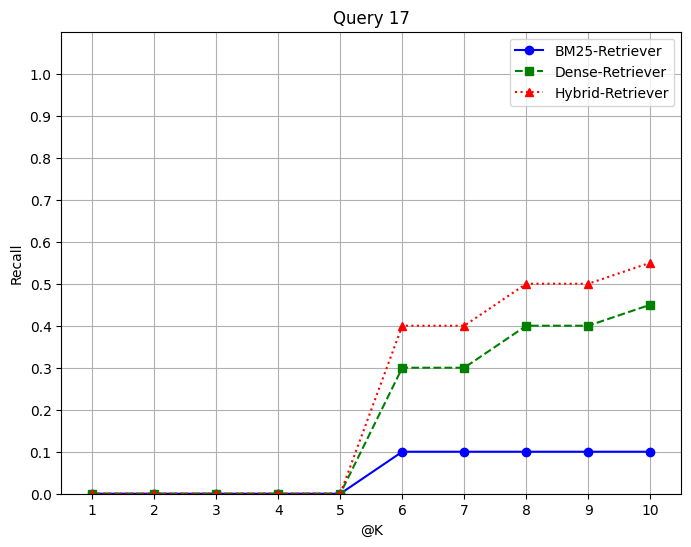

BM - Recall: [0.   0.05 0.05 0.05 0.15 0.15 0.15 0.15 0.25 0.25], Dense - Recall: [0.   0.05 0.05 0.1  0.25 0.25 0.3  0.3  0.3  0.3 ], Hybrid - Recall: [0.   0.05 0.05 0.1  0.35 0.35 0.4  0.4  0.4  0.4 ]


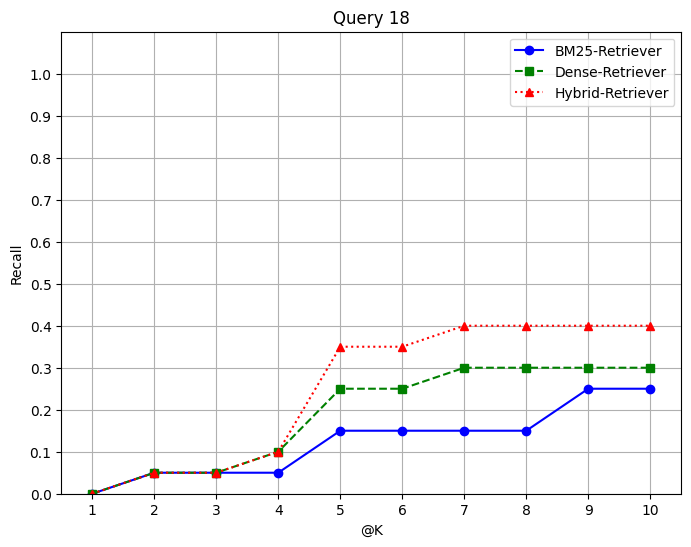

BM - Recall: [0.15 0.25 0.25 0.3  0.3  0.3  0.35 0.35 0.35 0.35], Dense - Recall: [0.   0.15 0.15 0.15 0.25 0.35 0.35 0.35 0.4  0.4 ], Hybrid - Recall: [0.15 0.3  0.3  0.35 0.4  0.4  0.4  0.4  0.4  0.4 ]


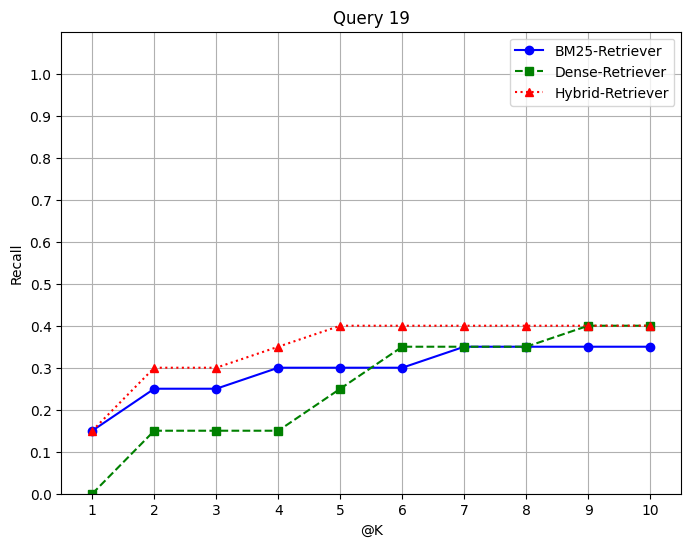

BM - Recall: [0.05 0.05 0.1  0.1  0.1  0.25 0.25 0.25 0.35 0.35], Dense - Recall: [0.1  0.15 0.2  0.2  0.3  0.3  0.4  0.4  0.55 0.55], Hybrid - Recall: [0.15 0.2  0.25 0.25 0.3  0.35 0.45 0.45 0.6  0.6 ]


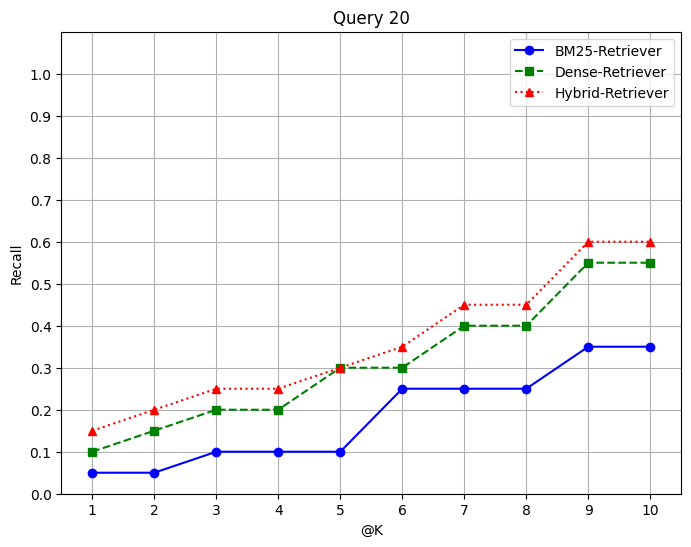

BM - Recall: [0.15 0.25 0.25 0.25 0.25 0.25 0.25 0.25 0.3  0.3 ], Dense - Recall: [0.  0.2 0.2 0.2 0.2 0.4 0.4 0.4 0.4 0.4], Hybrid - Recall: [0.15 0.3  0.3  0.3  0.3  0.4  0.4  0.4  0.45 0.45]


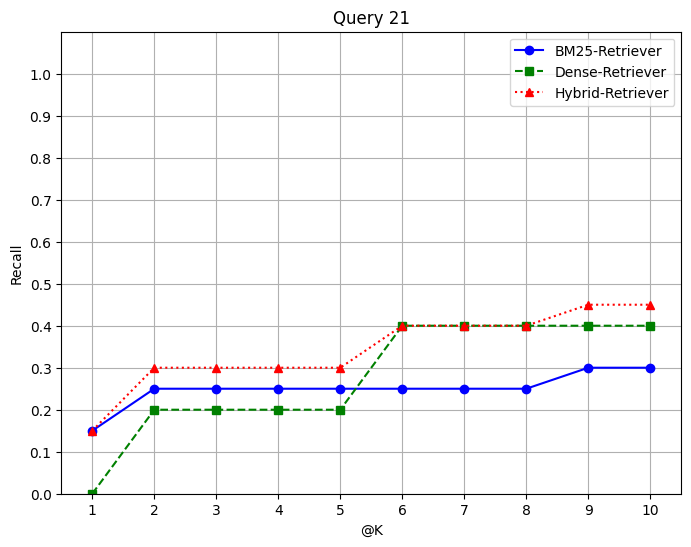

BM - Recall: [0.014 0.031 0.046 0.046 0.057 0.077 0.097 0.134 0.181 0.181], Dense - Recall: [0.    0.    0.014 0.039 0.039 0.039 0.094 0.114 0.175 0.175], Hybrid - Recall: [0.014 0.031 0.046 0.071 0.071 0.091 0.145 0.202 0.269 0.269]


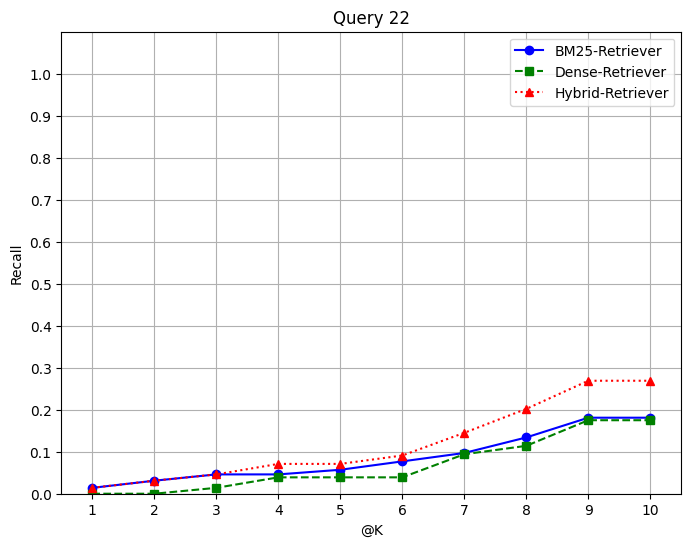

BM - Recall: [0.011 0.028 0.056 0.067 0.067 0.067 0.081 0.112 0.143 0.163], Dense - Recall: [0.    0.    0.014 0.034 0.034 0.069 0.117 0.117 0.17  0.184], Hybrid - Recall: [0.011 0.028 0.07  0.101 0.101 0.136 0.156 0.186 0.27  0.304]


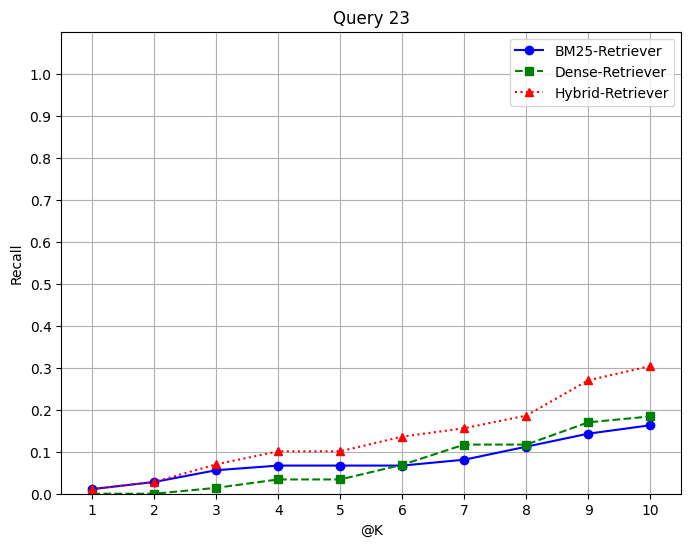

BM - Recall: [0.028 0.042 0.053 0.053 0.053 0.09  0.11  0.157 0.177 0.205], Dense - Recall: [0.03  0.075 0.075 0.092 0.134 0.134 0.164 0.204 0.245 0.259], Hybrid - Recall: [0.058 0.118 0.129 0.146 0.187 0.224 0.274 0.343 0.383 0.408]


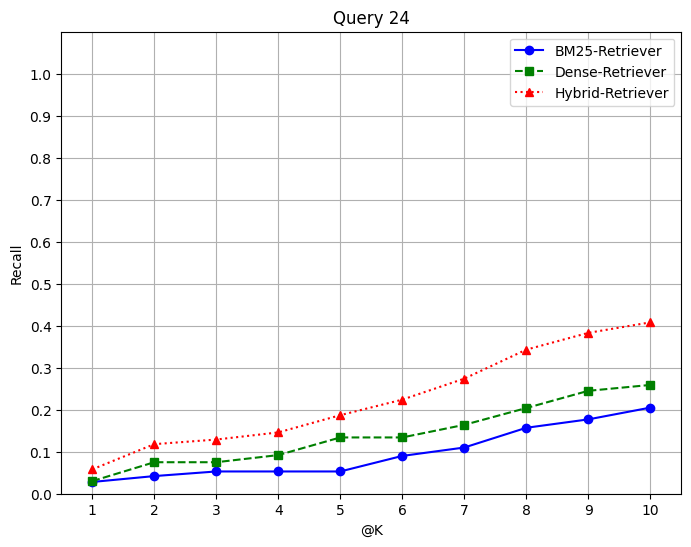

BM - Recall: [0.045 0.145 0.165 0.185 0.255 0.266 0.283 0.283 0.293 0.309], Dense - Recall: [0.15  0.191 0.228 0.243 0.243 0.317 0.327 0.368 0.399 0.472], Hybrid - Recall: [0.195 0.237 0.294 0.328 0.378 0.464 0.49  0.514 0.535 0.568]


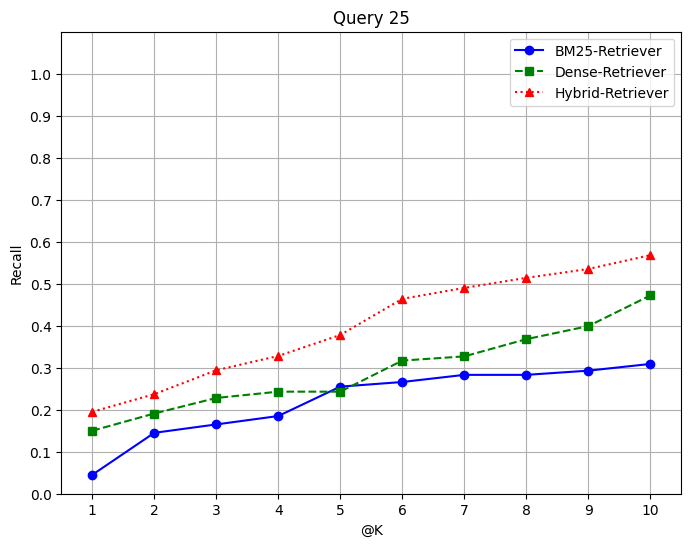

BM - Recall: [0.   0.02 0.02 0.04 0.06 0.08 0.1  0.1  0.1  0.1 ], Dense - Recall: [0.05  0.078 0.092 0.138 0.153 0.164 0.164 0.192 0.216 0.269], Hybrid - Recall: [0.05  0.098 0.112 0.158 0.193 0.204 0.224 0.252 0.276 0.329]


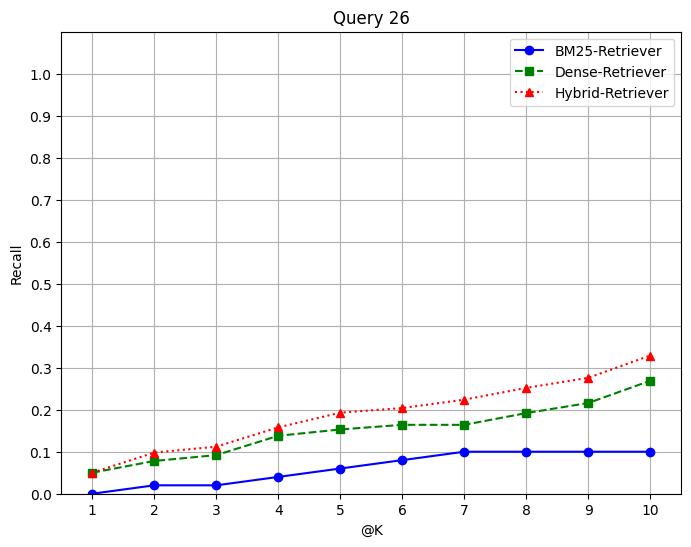

BM - Recall: [0.183 0.333 0.483 0.483 0.517 0.567 0.617 0.617 0.617 0.617], Dense - Recall: [0.05  0.1   0.25  0.533 0.533 0.533 0.667 0.667 0.7   0.7  ], Hybrid - Recall: [0.233 0.383 0.583 0.667 0.667 0.667 0.75  0.75  0.75  0.75 ]


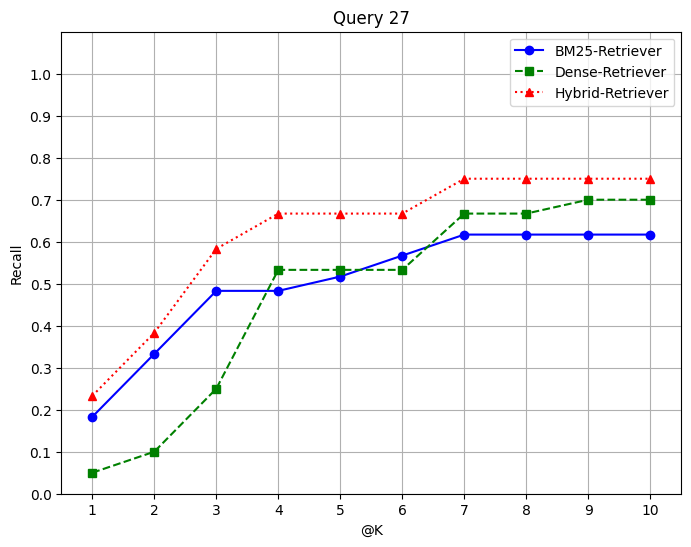

BM - Recall: [0.183 0.333 0.483 0.483 0.483 0.483 0.583 0.583 0.583 0.617], Dense - Recall: [0.133 0.283 0.283 0.333 0.433 0.483 0.517 0.517 0.517 0.517], Hybrid - Recall: [0.183 0.483 0.633 0.633 0.733 0.783 0.817 0.817 0.817 0.85 ]


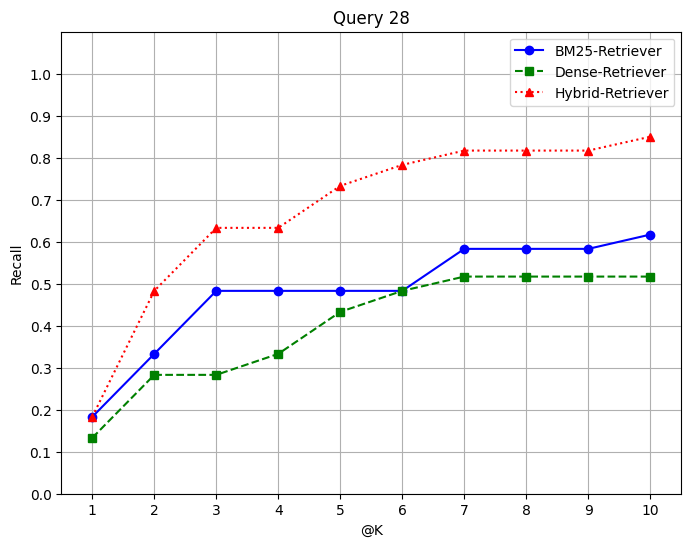

BM - Recall: [0.083 0.233 0.283 0.433 0.433 0.533 0.533 0.533 0.567 0.567], Dense - Recall: [0.15  0.2   0.3   0.333 0.417 0.467 0.567 0.567 0.567 0.567], Hybrid - Recall: [0.233 0.383 0.483 0.667 0.667 0.717 0.717 0.717 0.75  0.75 ]


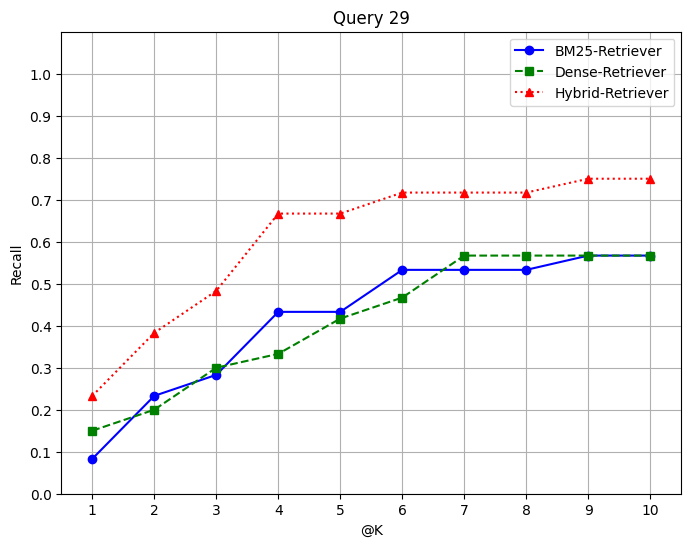

BM - Recall: [0.   0.   0.   0.   0.   0.   0.   0.1  0.1  0.15], Dense - Recall: [0.   0.   0.1  0.1  0.2  0.2  0.2  0.2  0.25 0.25], Hybrid - Recall: [0.   0.   0.1  0.1  0.2  0.2  0.2  0.2  0.25 0.25]


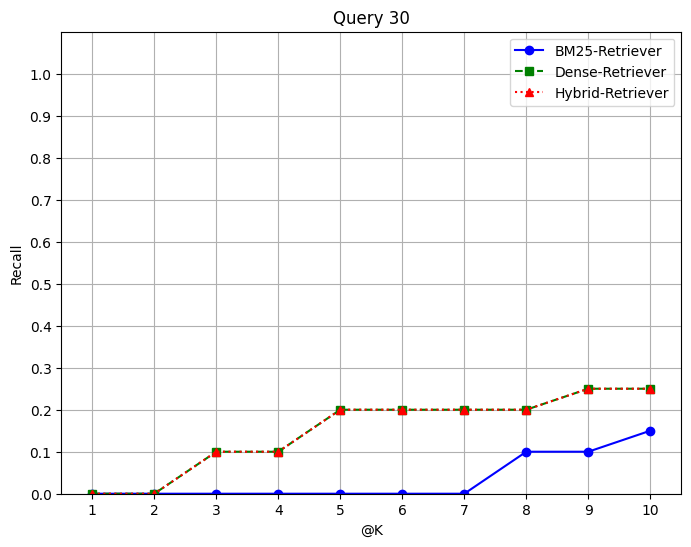

BM - Recall: [0.05  0.05  0.05  0.05  0.05  0.133 0.167 0.167 0.167 0.167], Dense - Recall: [0.05  0.05  0.05  0.133 0.133 0.133 0.133 0.133 0.133 0.133], Hybrid - Recall: [0.1   0.1   0.1   0.183 0.183 0.183 0.217 0.217 0.217 0.217]


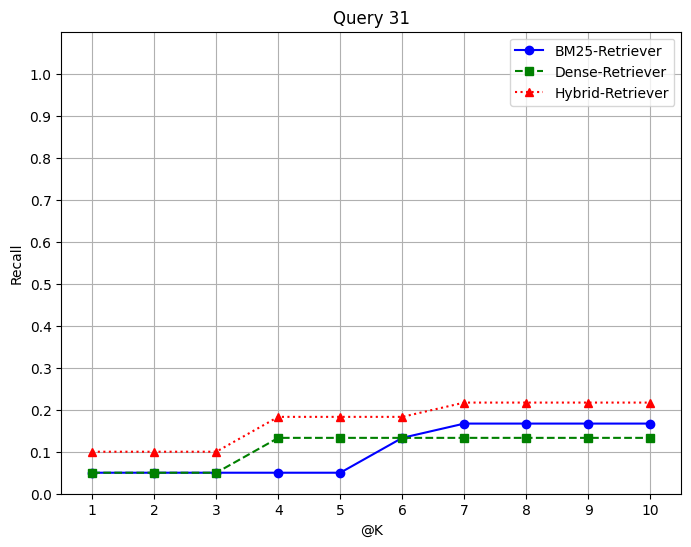

BM - Recall: [0.   0.05 0.05 0.15 0.15 0.2  0.2  0.2  0.2  0.25], Dense - Recall: [0.   0.   0.   0.   0.05 0.1  0.1  0.1  0.1  0.1 ], Hybrid - Recall: [0.   0.05 0.05 0.15 0.2  0.3  0.3  0.3  0.3  0.35]


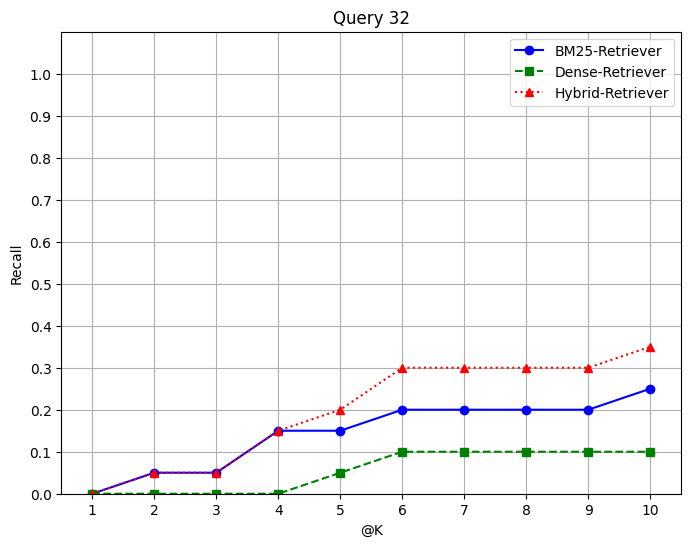

BM - Recall: [0.    0.083 0.117 0.117 0.167 0.217 0.317 0.317 0.35  0.35 ], Dense - Recall: [0.083 0.433 0.533 0.583 0.683 0.733 0.767 0.767 0.767 0.767], Hybrid - Recall: [0.083 0.517 0.617 0.667 0.817 0.817 0.817 0.817 0.85  0.85 ]


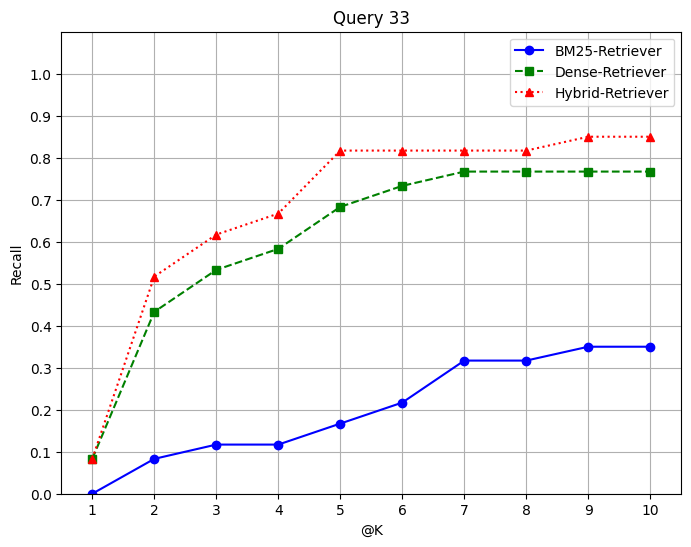

BM - Recall: [0.3   0.383 0.433 0.483 0.583 0.583 0.717 0.717 0.717 0.717], Dense - Recall: [0.1   0.1   0.1   0.2   0.2   0.2   0.4   0.45  0.5   0.533], Hybrid - Recall: [0.4   0.483 0.533 0.583 0.583 0.583 0.917 0.917 0.967 0.967]


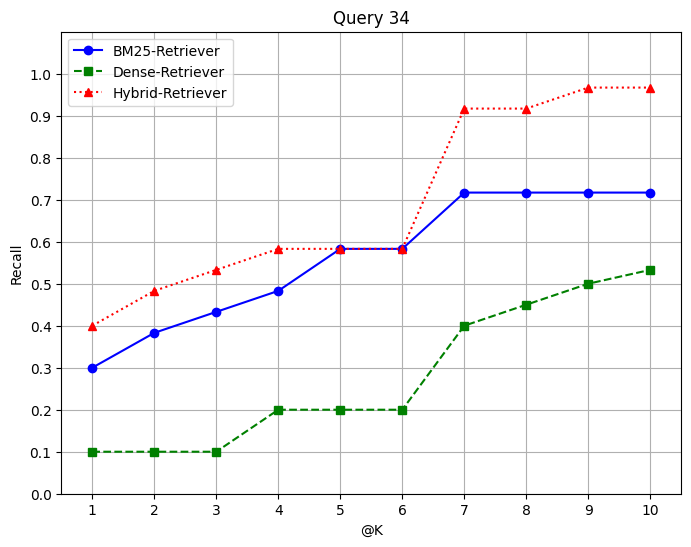

BM - Recall: [0.083 0.083 0.133 0.183 0.283 0.283 0.283 0.383 0.383 0.483], Dense - Recall: [0.1  0.1  0.1  0.1  0.1  0.1  0.2  0.25 0.4  0.5 ], Hybrid - Recall: [0.183 0.183 0.233 0.283 0.383 0.383 0.483 0.483 0.633 0.733]


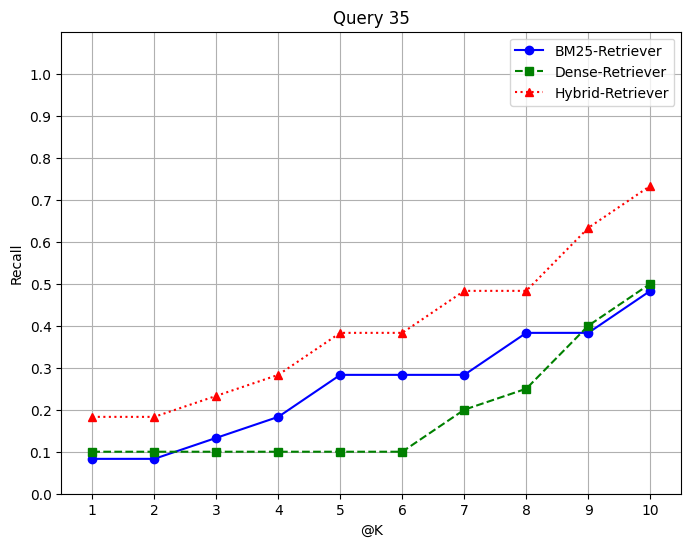

BM - Recall: [0.1   0.1   0.1   0.1   0.125 0.158 0.158 0.208 0.258 0.342], Dense - Recall: [0.    0.1   0.1   0.1   0.1   0.1   0.1   0.175 0.3   0.325], Hybrid - Recall: [0.1   0.2   0.2   0.2   0.225 0.258 0.258 0.383 0.383 0.492]


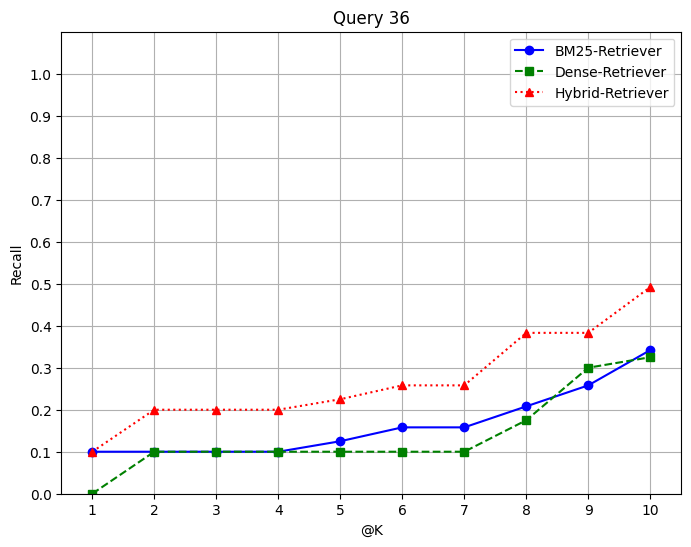

BM - Recall: [0.    0.    0.1   0.183 0.183 0.183 0.183 0.217 0.242 0.242], Dense - Recall: [0.075 0.458 0.458 0.492 0.592 0.767 0.767 0.792 0.842 0.892], Hybrid - Recall: [0.075 0.458 0.458 0.525 0.625 0.8   0.8   0.825 0.875 0.925]


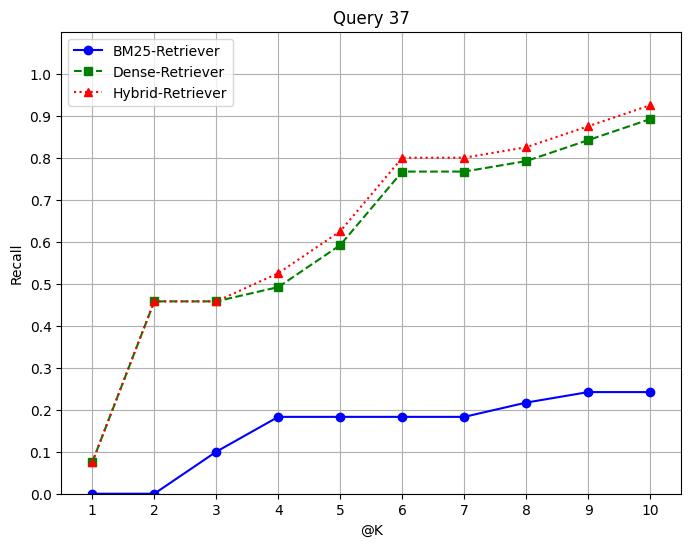

BM - Recall: [0.    0.    0.    0.    0.    0.033 0.033 0.033 0.033 0.033], Dense - Recall: [0.   0.   0.   0.1  0.1  0.1  0.1  0.1  0.1  0.15], Hybrid - Recall: [0.    0.    0.    0.1   0.1   0.133 0.133 0.133 0.133 0.183]


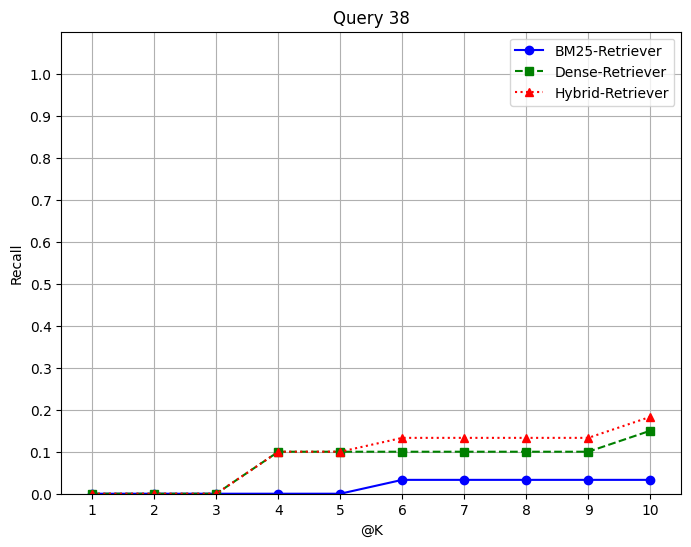

BM - Recall: [0.   0.   0.   0.05 0.05 0.05 0.05 0.05 0.05 0.1 ], Dense - Recall: [0.1  0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.2 ], Hybrid - Recall: [0.1  0.15 0.15 0.2  0.2  0.2  0.2  0.2  0.2  0.3 ]


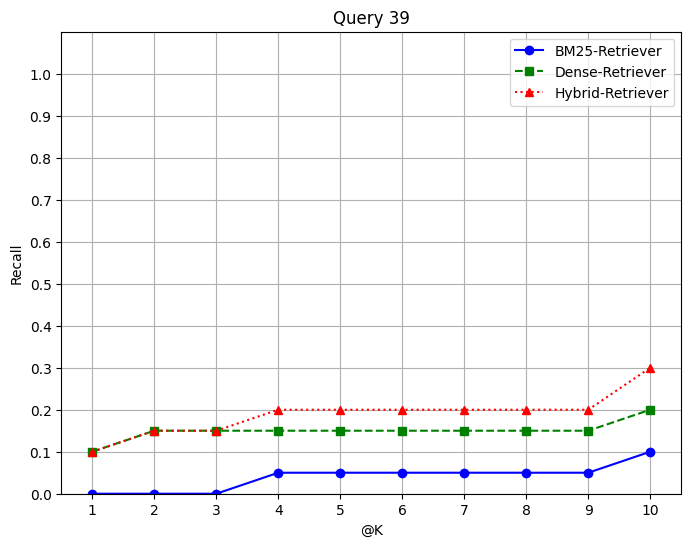

BM - Recall: [0.05 0.05 0.05 0.05 0.05 0.1  0.1  0.1  0.1  0.15], Dense - Recall: [0.05 0.05 0.1  0.1  0.1  0.15 0.25 0.25 0.25 0.3 ], Hybrid - Recall: [0.1  0.1  0.15 0.15 0.15 0.25 0.35 0.35 0.35 0.4 ]


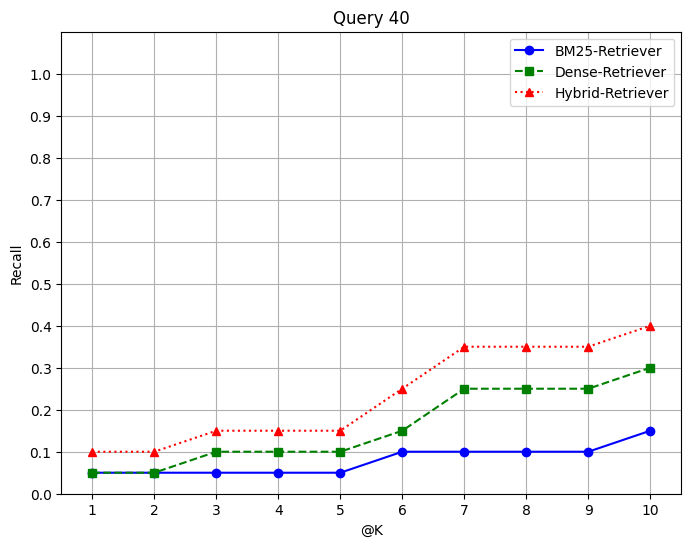

BM - Recall: [0.05 0.1  0.1  0.2  0.2  0.2  0.2  0.2  0.25 0.35], Dense - Recall: [0.   0.   0.   0.   0.05 0.05 0.2  0.2  0.2  0.2 ], Hybrid - Recall: [0.05 0.1  0.1  0.2  0.2  0.2  0.25 0.25 0.25 0.35]


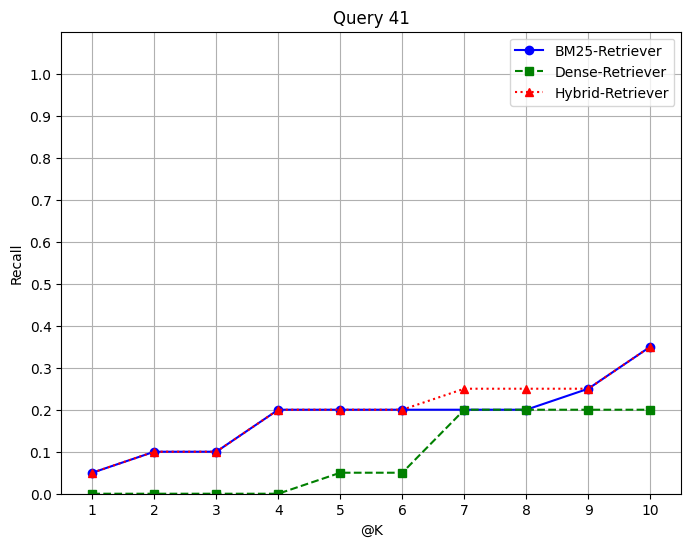

BM - Recall: [0.   0.05 0.05 0.05 0.05 0.05 0.1  0.1  0.1  0.1 ], Dense - Recall: [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.05], Hybrid - Recall: [0.   0.05 0.05 0.05 0.05 0.05 0.1  0.1  0.1  0.15]


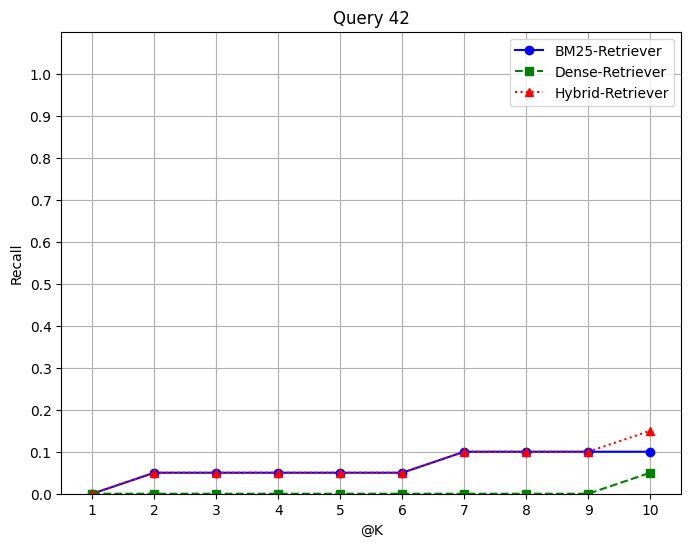

BM - Recall: [0.15  0.4   0.433 0.433 0.458 0.491 0.525 0.525 0.575 0.575], Dense - Recall: [0.125 0.458 0.483 0.483 0.483 0.508 0.508 0.508 0.541 0.591], Hybrid - Recall: [0.275 0.508 0.566 0.566 0.591 0.65  0.65  0.65  0.65  0.65 ]


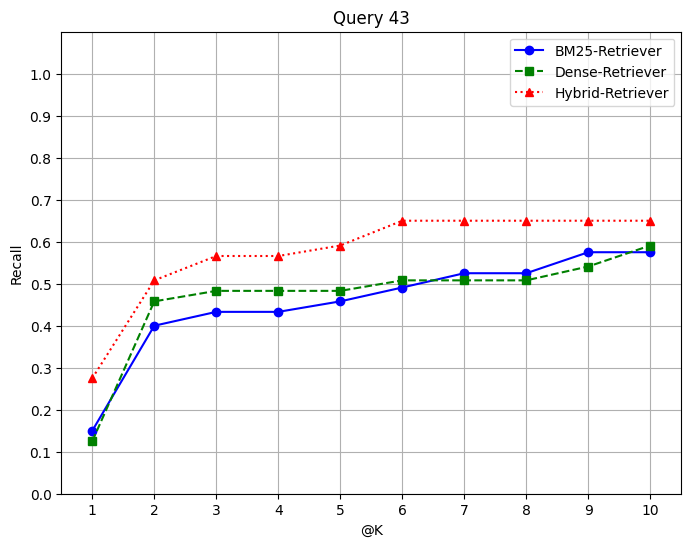

BM - Recall: [0.    0.    0.    0.    0.    0.    0.025 0.025 0.025 0.025], Dense - Recall: [0.    0.05  0.05  0.075 0.108 0.108 0.108 0.108 0.108 0.133], Hybrid - Recall: [0.    0.05  0.05  0.075 0.108 0.108 0.133 0.133 0.133 0.158]


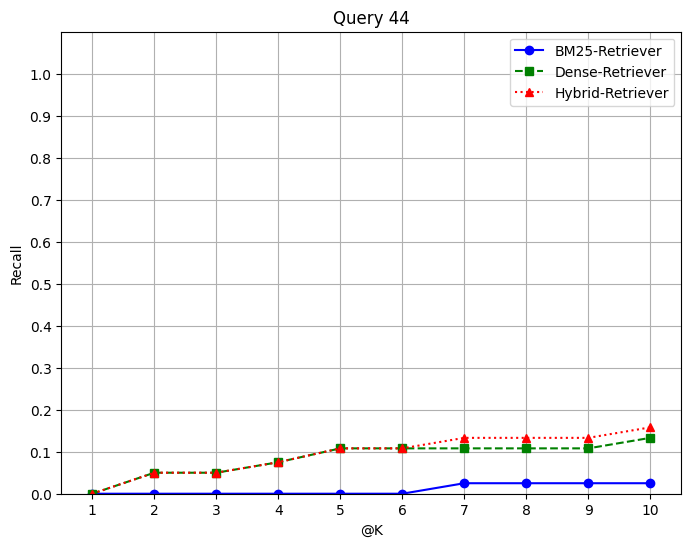

BM - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - Recall: [0.   0.   0.   0.   0.   0.   0.   0.05 0.05 0.05], Hybrid - Recall: [0.   0.   0.   0.   0.   0.   0.   0.05 0.05 0.05]


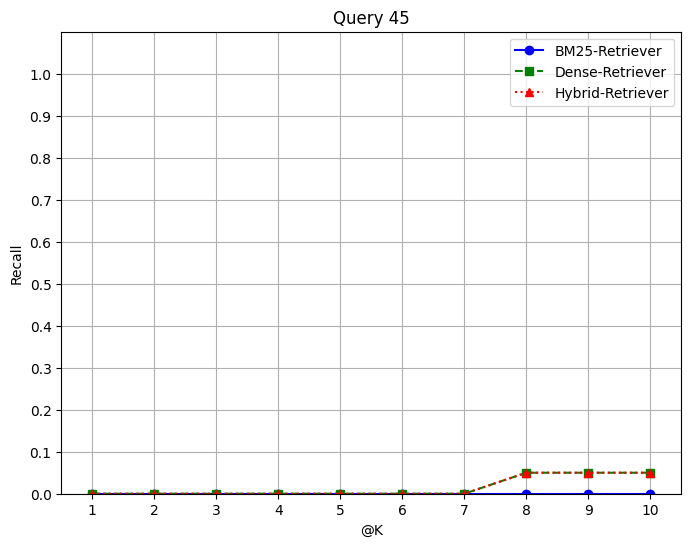

BM - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


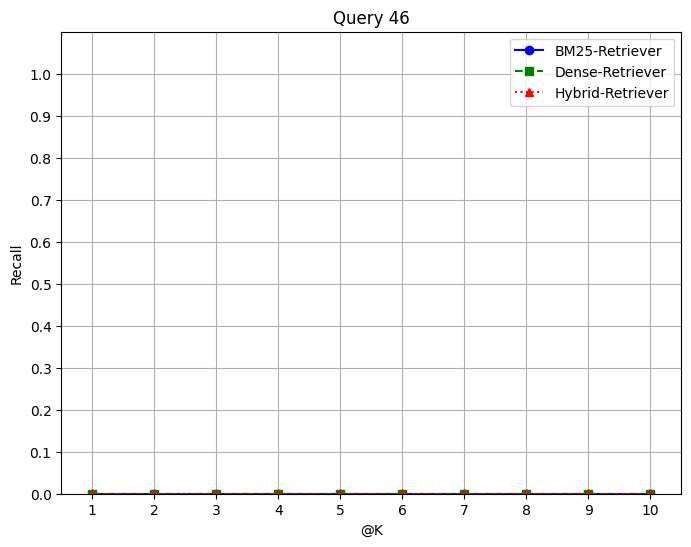

BM - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


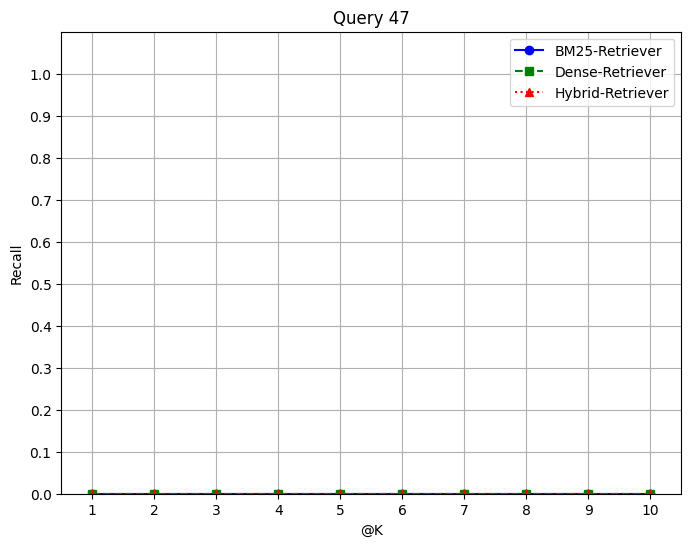

BM - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


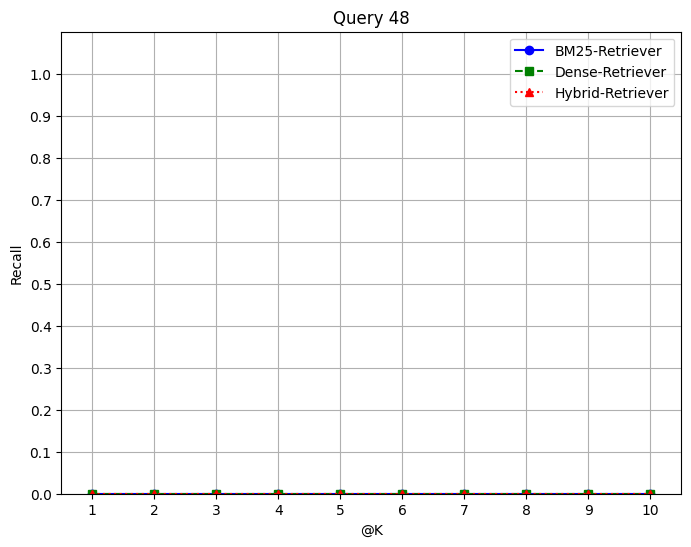

BM - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Dense - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], Hybrid - Recall: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


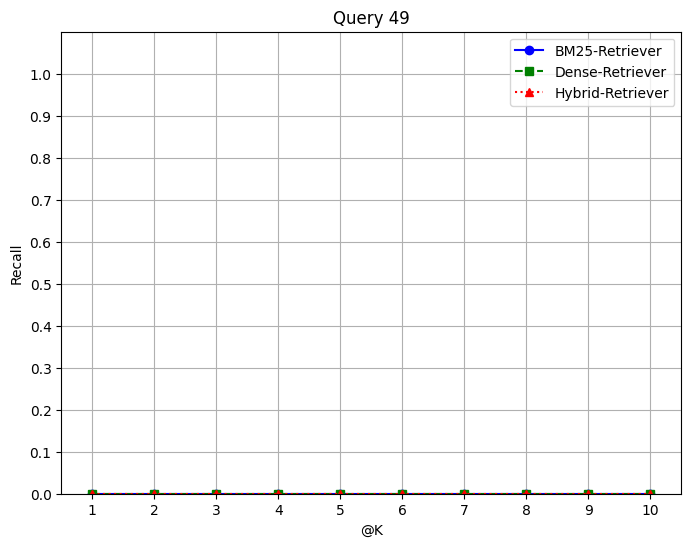

BM - Recall: [0.    0.    0.    0.    0.    0.033 0.033 0.033 0.033 0.033], Dense - Recall: [0.    0.    0.    0.    0.033 0.033 0.033 0.067 0.117 0.117], Hybrid - Recall: [0.    0.    0.    0.    0.033 0.033 0.033 0.067 0.117 0.117]


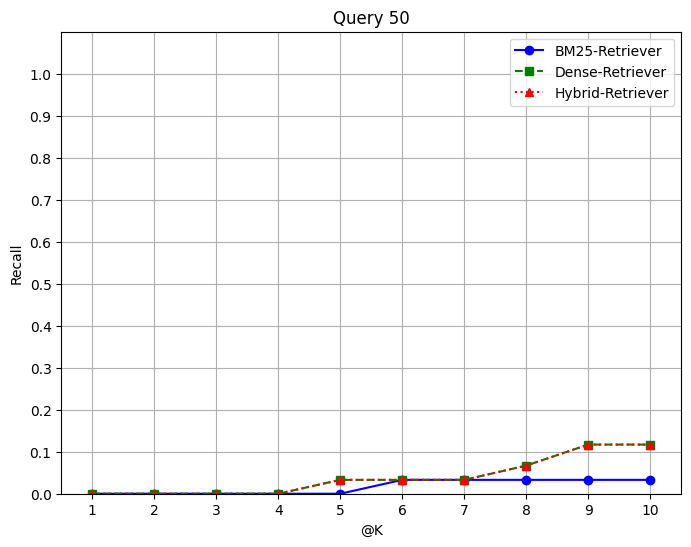

BM - Recall: [0.0599  0.10224 0.12488 0.14754 0.1672  0.1916  0.21866 0.2371  0.25896
 0.27726], Dense - Recall: [0.05172 0.11026 0.14004 0.16966 0.20896 0.2447  0.27678 0.29234 0.31686
 0.33778], Hybrid - Recall: [0.1038  0.18058 0.22366 0.26362 0.30268 0.34548 0.38558 0.40908 0.434
 0.46044]


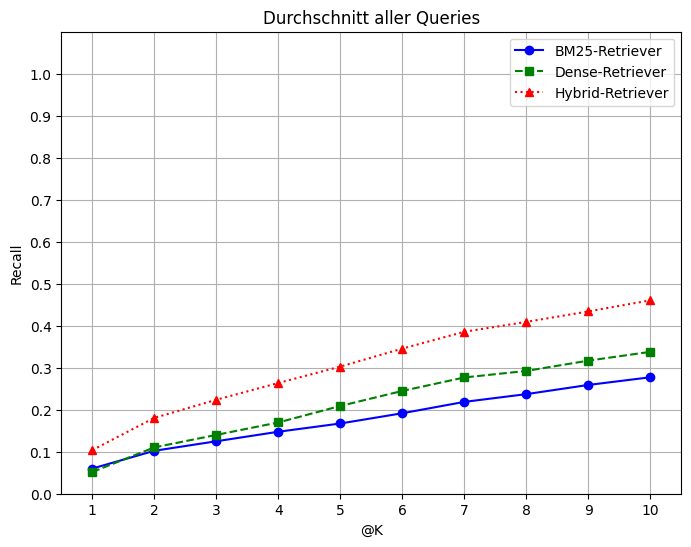

In [40]:
createRecallDiagramms()